Note: It is proper to first remove outliers from datasets and then doing ML on the clean data. Since the data in this project is from an academic database, it is better not to remove outliers as much as possible

# Extracting the features and targets from the basic Dataframe

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error 
import numpy as np
from colorama import Fore, Back, Style
from seaborn import heatmap
import seaborn as sns
pd.set_option('display.max_columns', None)
import pickle
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from xgboost import XGBRegressor
from math import ceil
from pycaret.regression import *
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from skopt.space.transformers import Normalize
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

In [2]:
Basic_df=pd.read_csv('full_CoRE2019_alldata.csv',low_memory=False)

In [3]:
column_indices_to_extract = list(range(2, 18))
Main_df = pd.read_csv('full_CoRE2019_alldata.csv', usecols=column_indices_to_extract)


In [4]:
Main_df[['logKH_CH4', 'CH4DC']]= Basic_df[['logKH_CH4', 'CH4DC']]

In [5]:
Main_df.describe()

,ASA [m^2/cm^3],CellV [A^3],Df,Di,Dif,NASA [m^2/cm^3],POAV [cm^3/g],POAVF,PONAV [cm^3/g],PONAVF,density [g/cm^3],total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4,CH4DC
count,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000
mean,878.943955,6302.704997,4.921482,6.983220,6.894232,141.323273,0.328231,0.288154,0.052199,0.071010,1.302904,1020.267228,1075.621000,0.359164,0.380430,-4.930494,87.120079
std,801.647701,11514.688982,2.662890,3.547494,3.491155,262.588512,0.475868,0.254516,0.092227,0.112494,0.472665,692.008243,1100.216833,0.197052,0.450924,0.540055,55.783560
min,0.000000,250.921000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.063653,1.070200,0.538008,0.000000,0.000000,-7.463039,0.020345
25%,0.000000,1868.950000,3.382630,4.870670,4.812410,0.000000,0.000000,0.000000,0.000000,0.000000,1.006280,418.888000,268.390254,0.204900,0.129519,-5.232647,41.552738
50%,861.200000,3284.850000,4.202680,5.887100,5.830350,0.000000,0.214724,0.299440,0.000000,0.000000,1.240540,949.259000,722.015876,0.338780,0.259982,-4.907855,75.853156
75%,1528.190000,6490.790000,5.715990,7.932900,7.802830,186.231000,0.472933,0.494160,0.081367,0.130340,1.545970,1549.670000,1486.698409,0.501820,0.485804,-4.606244,126.379642
max,3272.090000,438839.000000,71.501970,71.641190,71.641190,1605.750000,15.098600,0.961060,0.965610,0.638700,4.470600,3272.090000,8443.446688,0.961060,15.098600,-1.367461,287.037255


In [6]:
Main_df.dtypes

ASA [m^2/cm^3]           float64
CellV [A^3]              float64
Df                       float64
Di                       float64
Dif                      float64
NASA [m^2/cm^3]          float64
POAV [cm^3/g]            float64
POAVF                    float64
PONAV [cm^3/g]           float64
PONAVF                   float64
density [g/cm^3]         float64
MOFname                   object
total_SA_volumetric      float64
total_SA_gravimetric     float64
total_POV_volumetric     float64
total_POV_gravimetric    float64
logKH_CH4                float64
CH4DC                    float64
dtype: object

In [7]:
Main_df['MOFname'].nunique()

9525

In [8]:
Main_df.shape

(9525, 18)

number of unique MOFname is equal to the number of samples, so it is not proper to encode the name to be numeric to be used as feature

In [9]:
Main_df.drop(columns=['MOFname'], inplace=True)

In [10]:
Main_df.isnull().sum()

ASA [m^2/cm^3]           0
CellV [A^3]              0
Df                       0
Di                       0
Dif                      0
NASA [m^2/cm^3]          0
POAV [cm^3/g]            0
POAVF                    0
PONAV [cm^3/g]           0
PONAVF                   0
density [g/cm^3]         0
total_SA_volumetric      0
total_SA_gravimetric     0
total_POV_volumetric     0
total_POV_gravimetric    0
logKH_CH4                0
CH4DC                    0
dtype: int64

In [11]:
Main_df.shape

(9525, 17)

### Heatmap on all the data and correlation plots

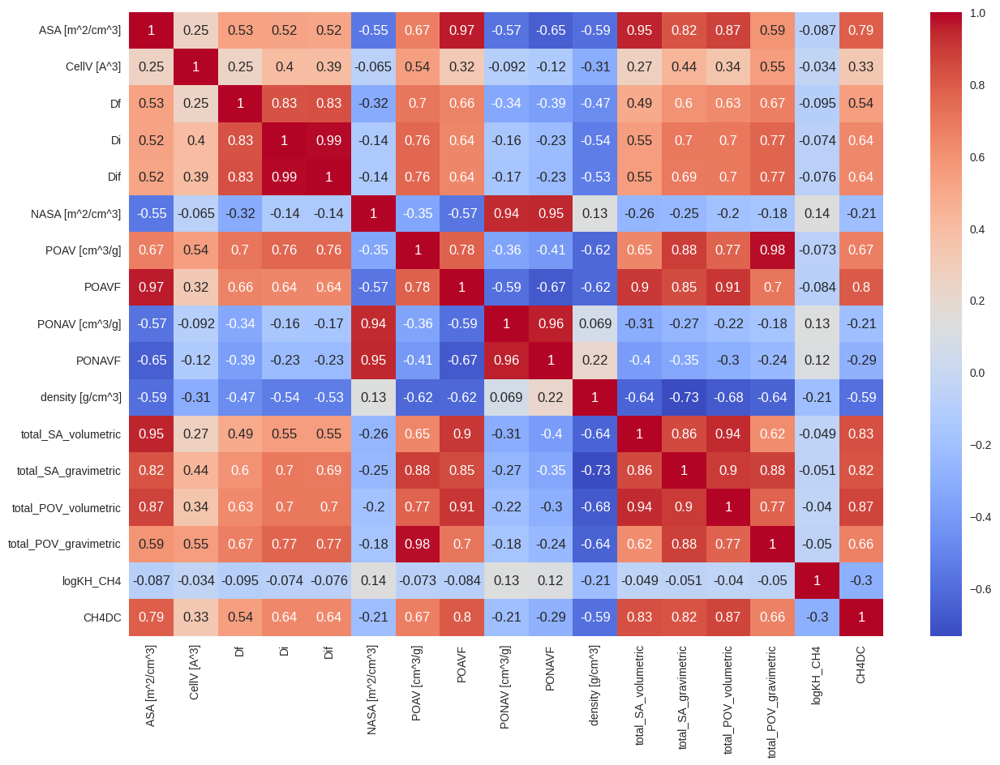

In [13]:
plt.figure(figsize=(15, 10))
sns.heatmap(Main_df.corr(), annot=True, cmap='coolwarm')
plt.show()  


The correlation of features with logKH_CH4 is too low, so we shouldn't expect that simple ML models can predict it precisely

In [12]:
def scatterplot(df, target, plots_per_row=3):
    Main_df = df
    features = Main_df.columns[:-1]  

    num_features = len(features)
    num_rows = ceil(num_features / plots_per_row) 

    fig, axes = plt.subplots(num_rows, plots_per_row, figsize=(15, 4*num_rows))  

    for i, feature in enumerate(features):
        row = i // plots_per_row
        col = i % plots_per_row

        sns.scatterplot(x=feature, y=target, data=Main_df, ax=axes[row, col])
        axes[row, col].set_title(f'{feature} vs {target}')
        axes[row, col].set_xlabel(feature)
        axes[row, col].set_ylabel(target)

    for i in range(num_features, num_rows * plots_per_row):
        row = i // plots_per_row
        col = i % plots_per_row
        fig.delaxes(axes[row, col])

    plt.tight_layout()
    plt.show()

In [13]:
df_CH4DC=Main_df.drop('logKH_CH4',axis=1)

In [14]:
df_logKH_CH4=Main_df.drop('CH4DC',axis=1)

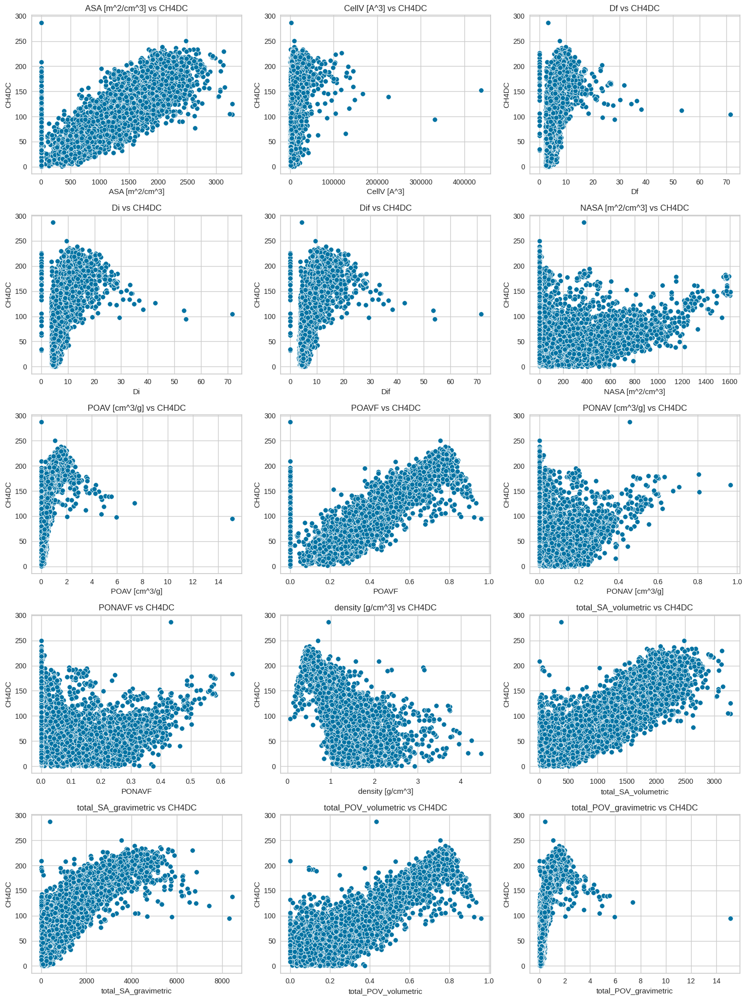

In [17]:
scatterplot(df_CH4DC,'CH4DC')

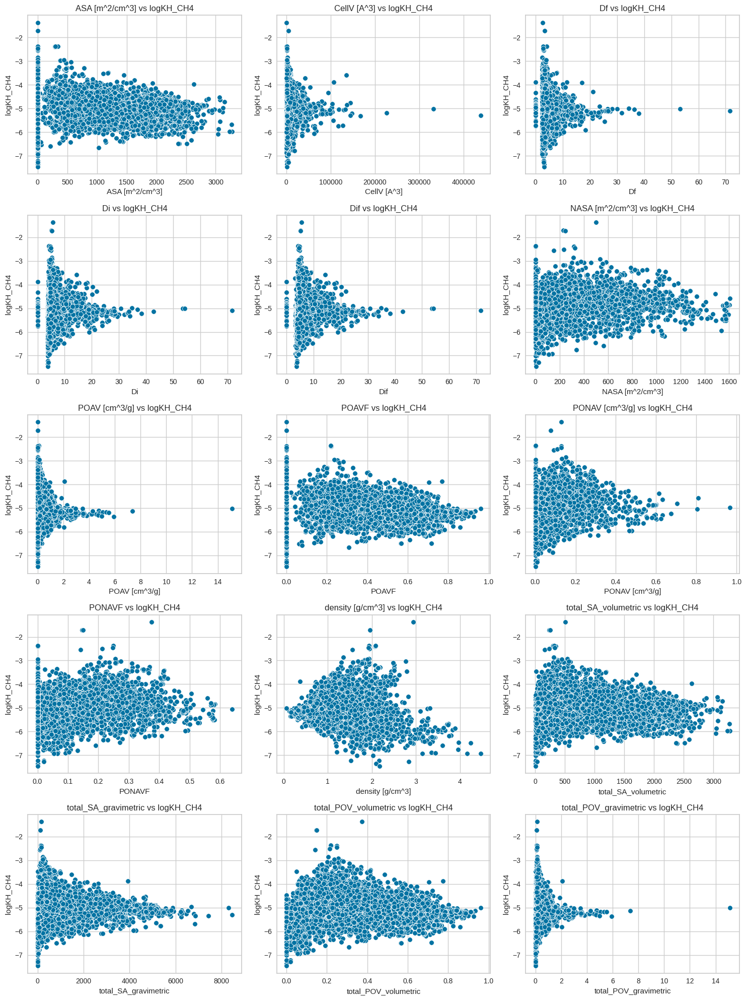

In [18]:
scatterplot(df_logKH_CH4,'logKH_CH4')

# CH4DC

### pycaret test

In [19]:
regression_setup = setup(df_CH4DC, target='CH4DC')

best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])

final_model = finalize_model(best_model)


,Description,Value
0,Session id,123
1,Target,CH4DC
2,Target type,Regression
3,Original data shape,"(9525, 16)"
4,Transformed data shape,"(9525, 16)"
5,Transformed train set shape,"(6667, 16)"
6,Transformed test set shape,"(2858, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,12.2218,307.1820,17.4994,0.9006,0.4099,1.1206,0.2327
rf,Random Forest Regressor,12.8607,325.4766,18.0100,0.8947,0.4248,1.1463,0.7173
xgboost,Extreme Gradient Boosting,13.2667,340.1691,18.4216,0.8900,0.4317,0.7925,0.0667
gbr,Gradient Boosting Regressor,14.9151,390.7696,19.7462,0.8736,0.4691,1.1286,0.3860
ada,AdaBoost Regressor,20.1007,615.4521,24.7902,0.8014,0.5947,1.6392,0.1027
dt,Decision Tree Regressor,17.0613,626.1229,24.9835,0.7974,0.5593,0.4943,0.0173
knn,K Neighbors Regressor,18.5482,636.5812,25.2079,0.7940,0.5123,1.1757,0.0073
ridge,Ridge Regression,19.4004,654.5452,25.5299,0.7884,0.5953,1.5663,0.0047
lr,Linear Regression,19.3752,657.0175,25.5696,0.7876,0.6025,1.5852,0.1867
en,Elastic Net,21.4298,764.5304,27.6217,0.7531,0.5653,1.2177,0.0153


### Standard Scaling then ML

In [20]:
clean_feature_names = df_CH4DC.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_CH4DC.columns = clean_feature_names

In [21]:
X=df_CH4DC.drop('CH4DC', axis=1)
y=df_CH4DC['CH4DC']

In [22]:
feature_names = X.columns

In [23]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)

In [24]:
X=X_scaled


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 301.55592906194715
Mean Absolute Error (MAE): 11.971991159834191
R^2 Score: 0.9062420178919971
Cross-Validation Mean MSE: 305.40511381890735
Cross-Validation Std MSE: 9.683356731914772


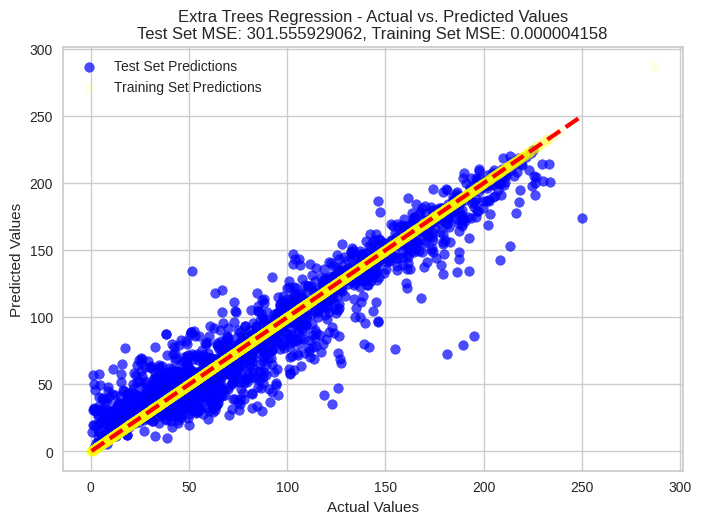

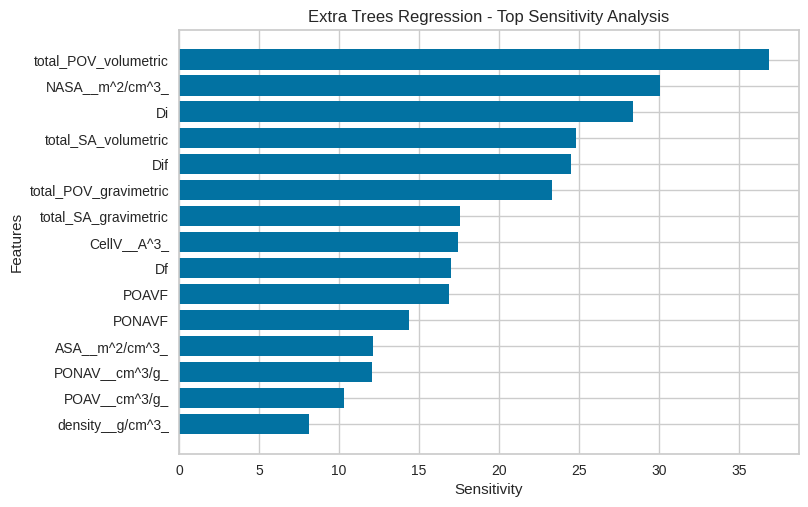


Random Forest Regression Evaluation Scores:
Mean Squared Error (MSE): 321.8903805080931
Mean Absolute Error (MAE): 12.665559984043117
R^2 Score: 0.8999197507729442
Cross-Validation Mean MSE: 325.1084155314323
Cross-Validation Std MSE: 7.392972918603287


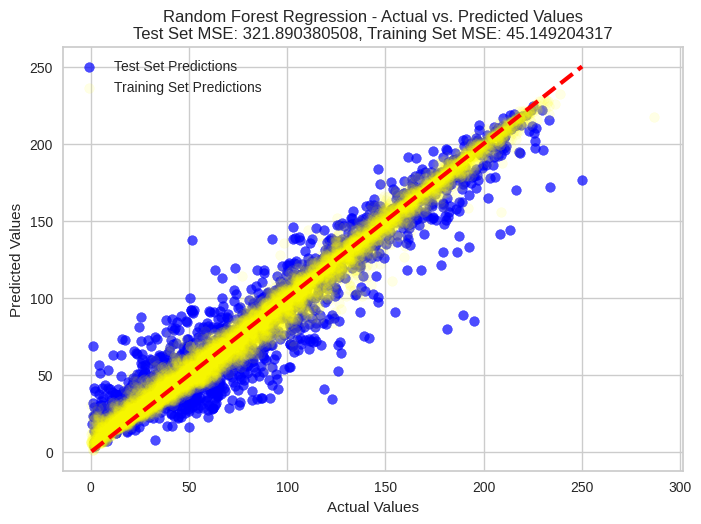

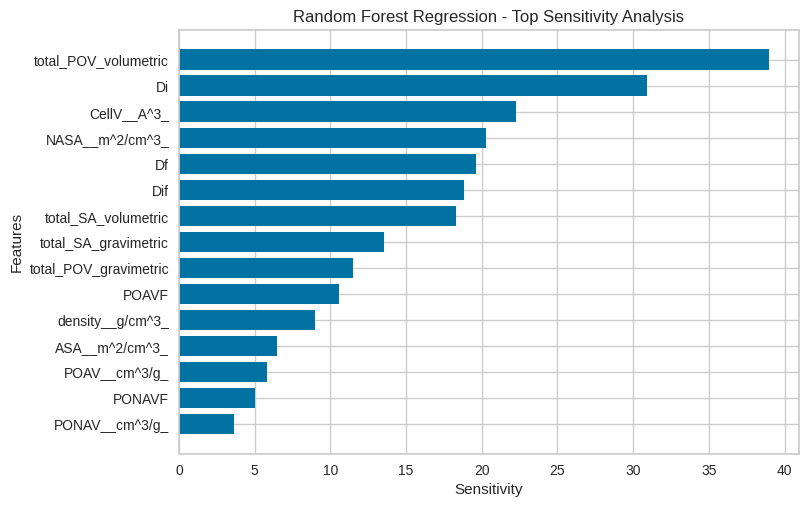


Extreme Gradient Boosting Evaluation Scores:
Mean Squared Error (MSE): 351.96576969016127
Mean Absolute Error (MAE): 13.230360502813083
R^2 Score: 0.8905688890286728
Cross-Validation Mean MSE: 349.56729371512245
Cross-Validation Std MSE: 12.472781467842804


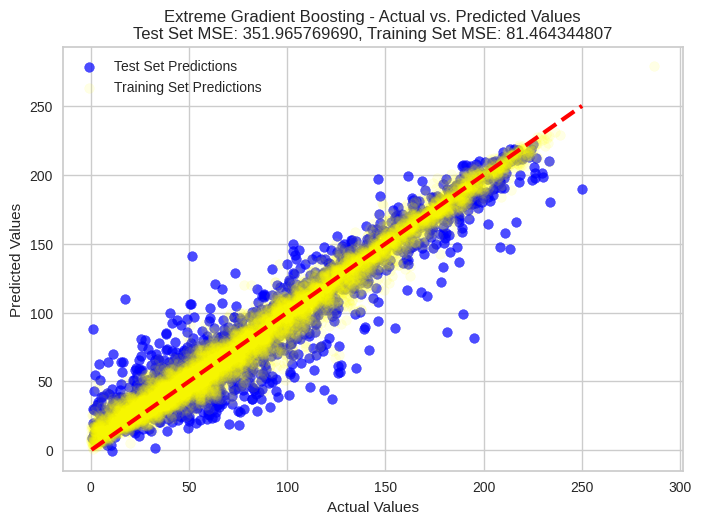

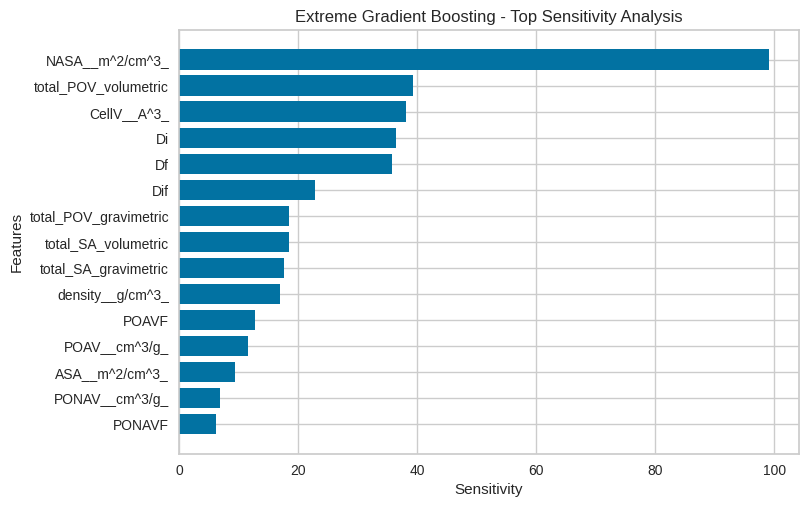


Gradient Boosting Regression Evaluation Scores:
Mean Squared Error (MSE): 404.9826911461477
Mean Absolute Error (MAE): 14.905820413353265
R^2 Score: 0.8740851820468392
Cross-Validation Mean MSE: 393.7640314565638
Cross-Validation Std MSE: 10.504472569238395


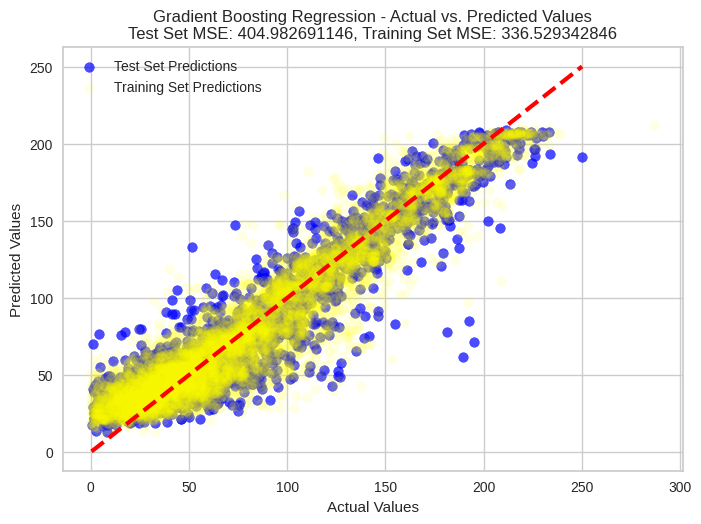

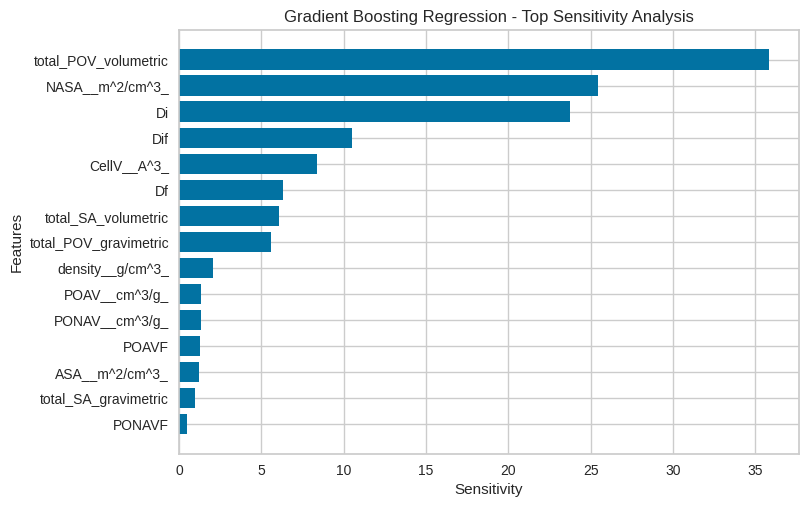


AdaBoost Regressor Evaluation Scores:
Mean Squared Error (MSE): 698.5555044912611
Mean Absolute Error (MAE): 21.440398853234708
R^2 Score: 0.7828092629606886
Cross-Validation Mean MSE: 634.2949946595361
Cross-Validation Std MSE: 37.131749917983356


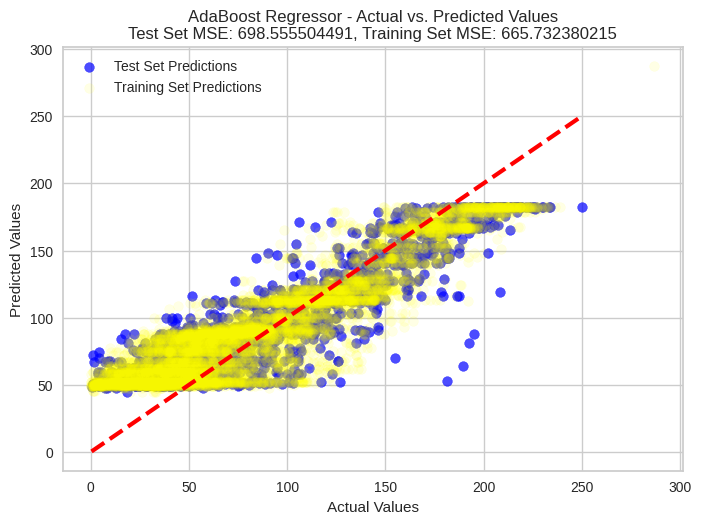

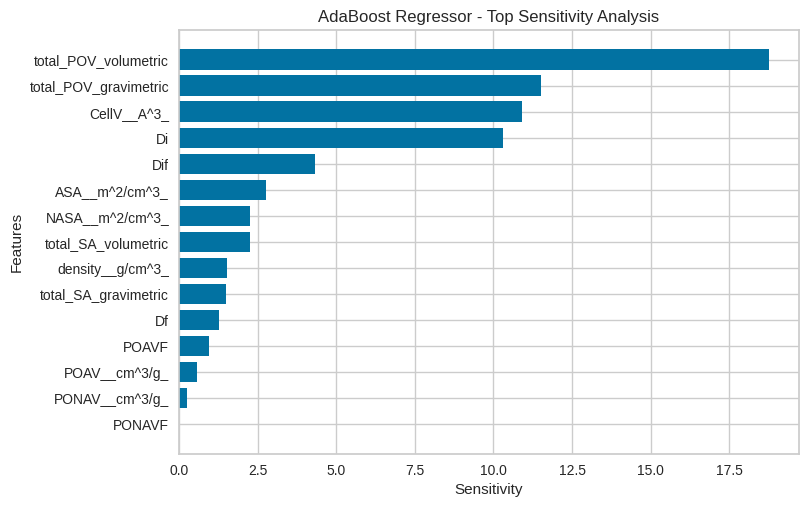


Decision Tree Regression Evaluation Scores:
Mean Squared Error (MSE): 615.319521092405
Mean Absolute Error (MAE): 16.594924254491076
R^2 Score: 0.8086885015700176
Cross-Validation Mean MSE: 624.5100874485436
Cross-Validation Std MSE: 21.10244514744805


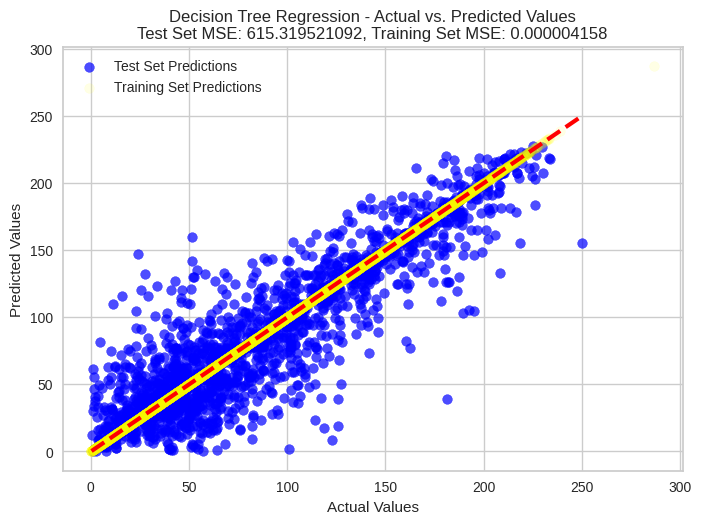

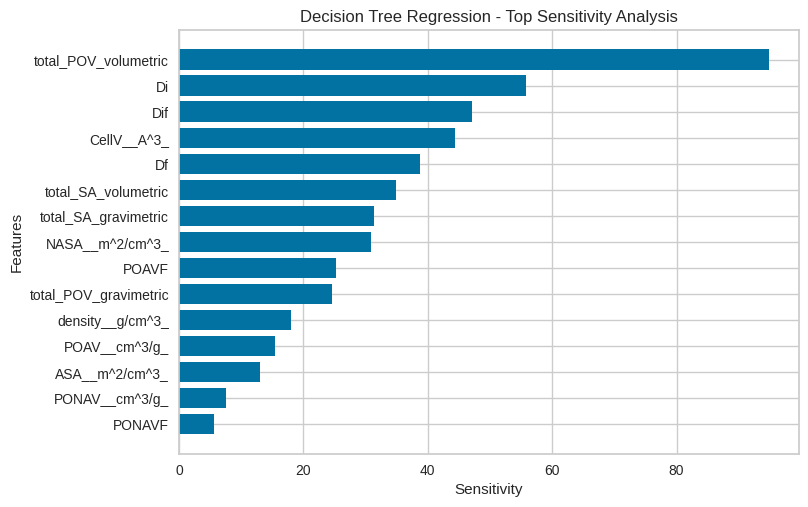


K-Nearest Neighbors Regression Evaluation Scores:
Mean Squared Error (MSE): 403.4635969310926
Mean Absolute Error (MAE): 14.114163679696695
R^2 Score: 0.8745574898163416
Cross-Validation Mean MSE: 407.00094377141704
Cross-Validation Std MSE: 18.958584384338092


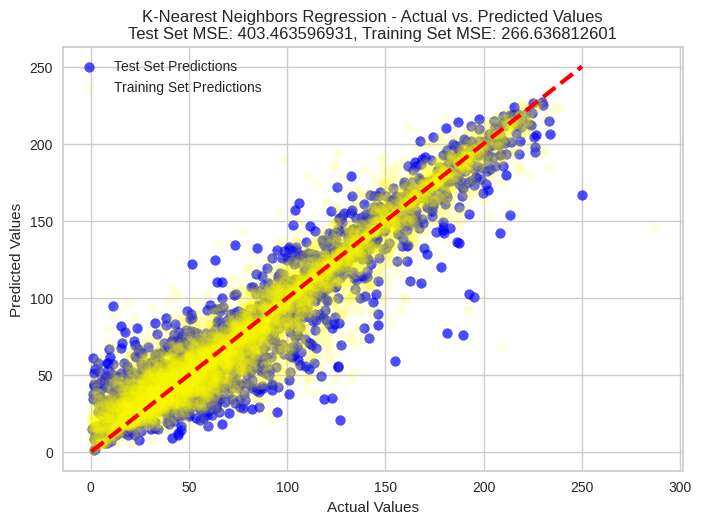

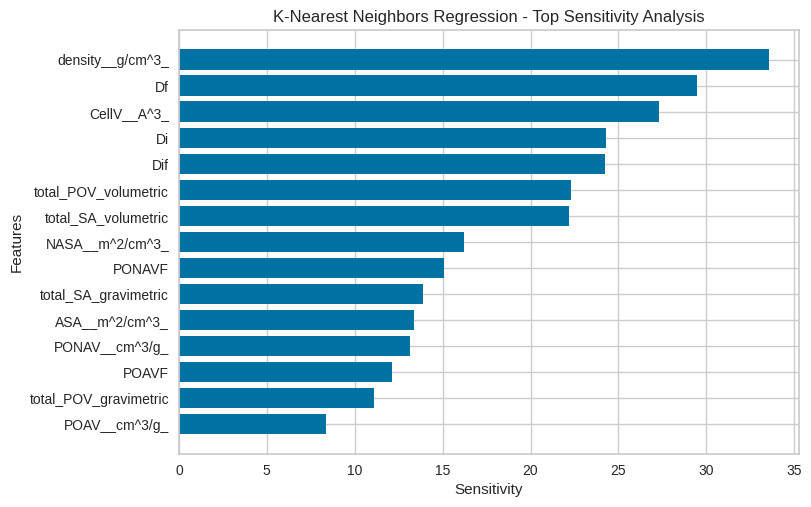

In [25]:
X=pd.DataFrame(X_scaled,columns=feature_names)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
    "Random Forest Regression": RandomForestRegressor(),
    "Extreme Gradient Boosting": XGBRegressor(),
    "Gradient Boosting Regression": GradientBoostingRegressor(),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "Decision Tree Regression": DecisionTreeRegressor(),
    "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train) 

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error')
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

### MinMax Scaling then ML

In [26]:
clean_feature_names = df_CH4DC.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_CH4DC.columns = clean_feature_names

In [27]:
X=df_CH4DC.drop('CH4DC', axis=1)
y=df_CH4DC['CH4DC']

In [28]:
feature_names = X.columns

In [29]:
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)

In [30]:
X=pd.DataFrame(X_scaled,columns=feature_names)


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 294.05486335437735
Mean Absolute Error (MAE): 11.725756223635766
R^2 Score: 0.9068013815002043
Cross-Validation Mean MSE: 309.8816899659776
Cross-Validation Std MSE: 10.127234234912171


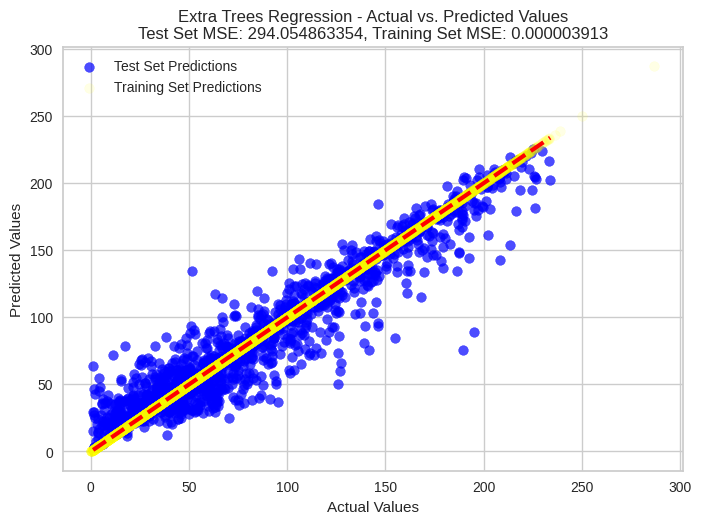

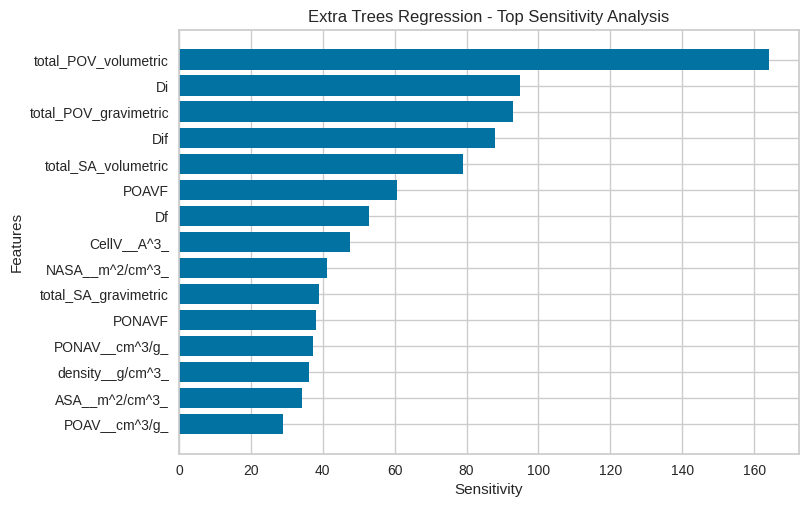


Random Forest Regression Evaluation Scores:
Mean Squared Error (MSE): 310.5745194097723
Mean Absolute Error (MAE): 12.26470552908124
R^2 Score: 0.9015655928283497
Cross-Validation Mean MSE: 321.5141527763097
Cross-Validation Std MSE: 7.941833250468389


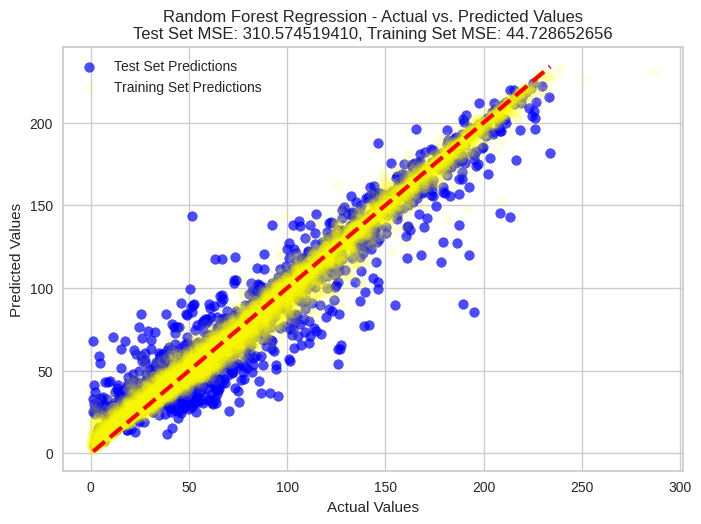

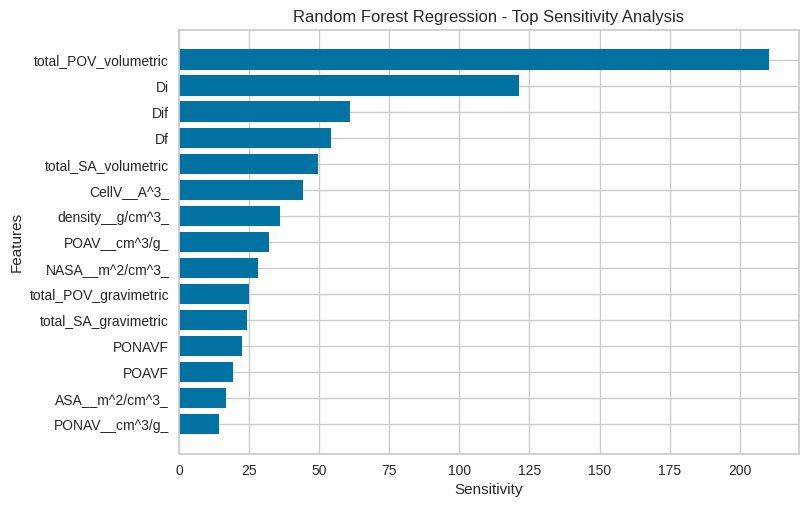


Extreme Gradient Boosting Evaluation Scores:
Mean Squared Error (MSE): 338.9169953429254
Mean Absolute Error (MAE): 12.799144849236379
R^2 Score: 0.8925826446407177
Cross-Validation Mean MSE: 349.56729371512245
Cross-Validation Std MSE: 12.472781467842804


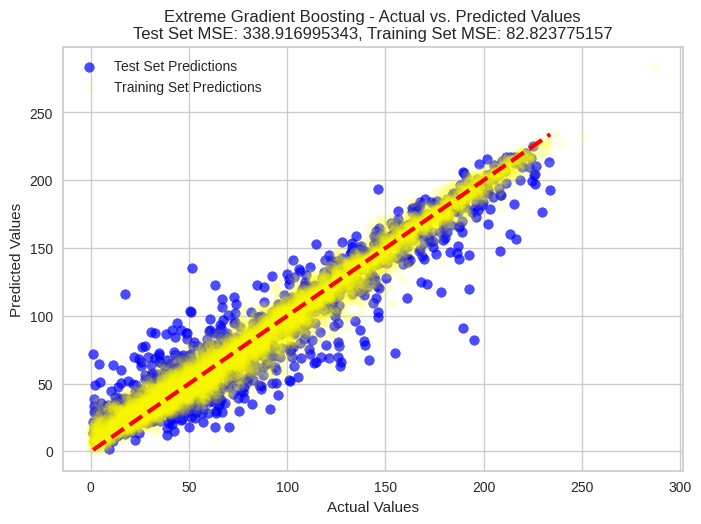

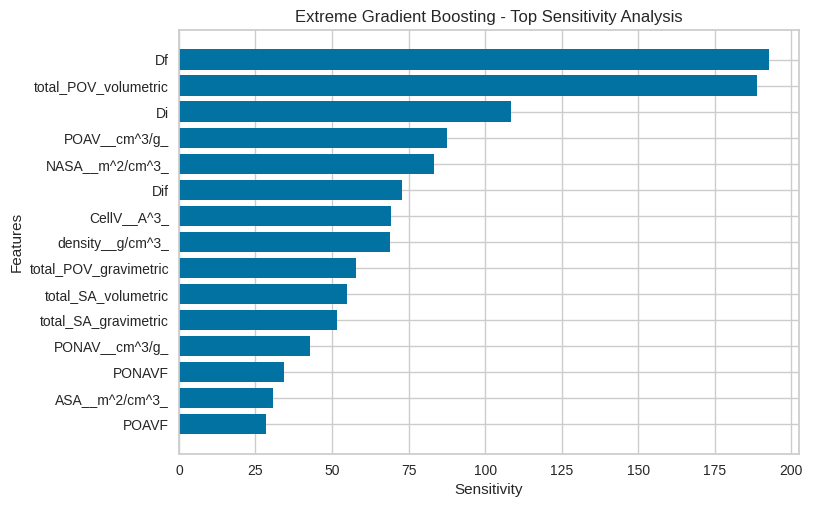


Gradient Boosting Regression Evaluation Scores:
Mean Squared Error (MSE): 408.060111177385
Mean Absolute Error (MAE): 14.719317762492649
R^2 Score: 0.8706682209136835
Cross-Validation Mean MSE: 393.8073263920924
Cross-Validation Std MSE: 10.497751470568812


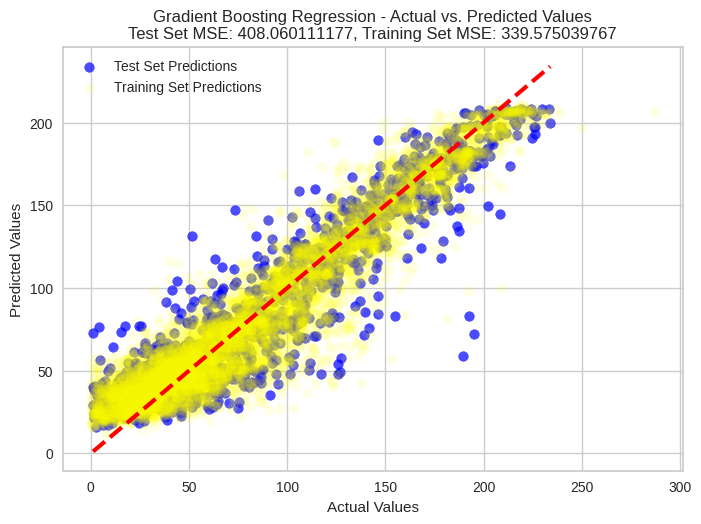

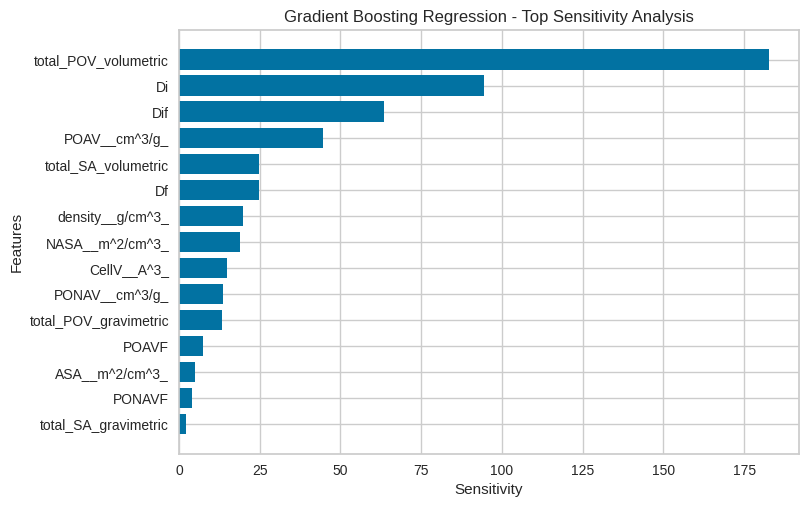


AdaBoost Regressor Evaluation Scores:
Mean Squared Error (MSE): 619.8313388873663
Mean Absolute Error (MAE): 19.572082252778014
R^2 Score: 0.8035488213722778
Cross-Validation Mean MSE: 646.8268022540963
Cross-Validation Std MSE: 19.96227750362315


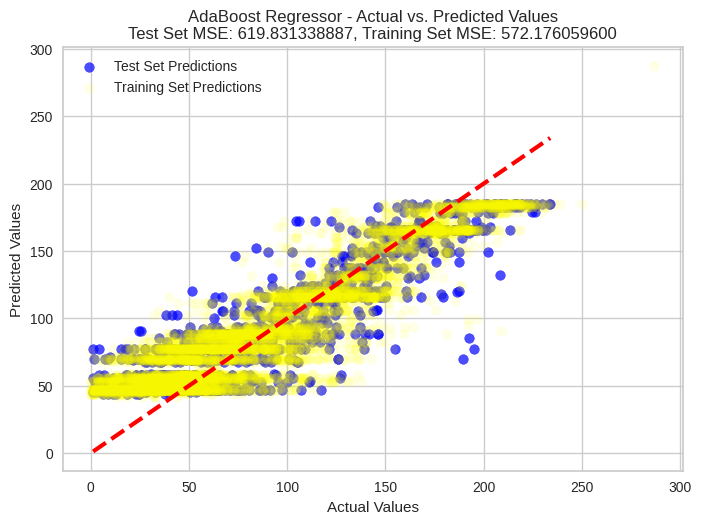

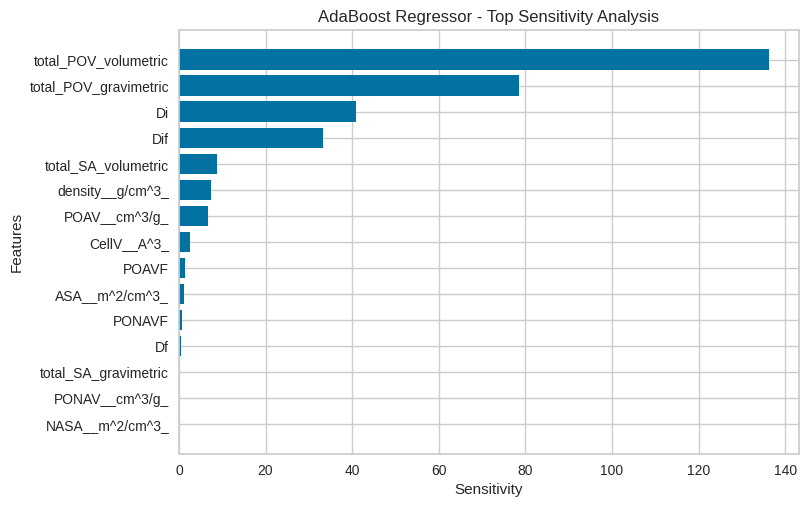


Decision Tree Regression Evaluation Scores:
Mean Squared Error (MSE): 581.024696908587
Mean Absolute Error (MAE): 16.055572448642195
R^2 Score: 0.8158483133098751
Cross-Validation Mean MSE: 621.09287181752
Cross-Validation Std MSE: 20.42178408905717


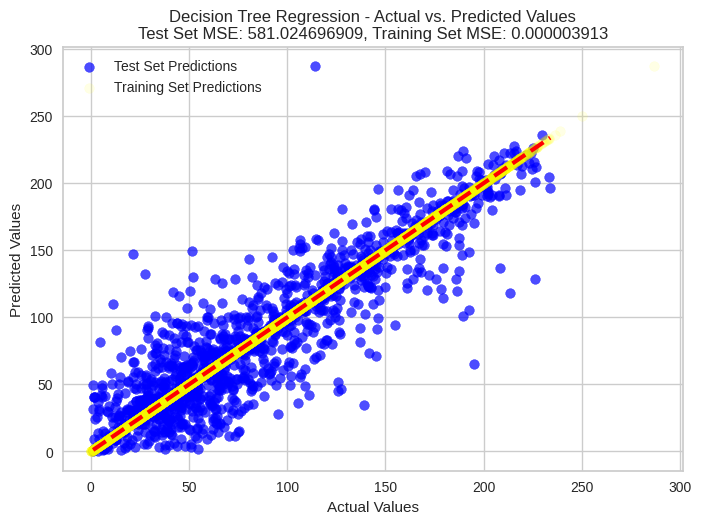

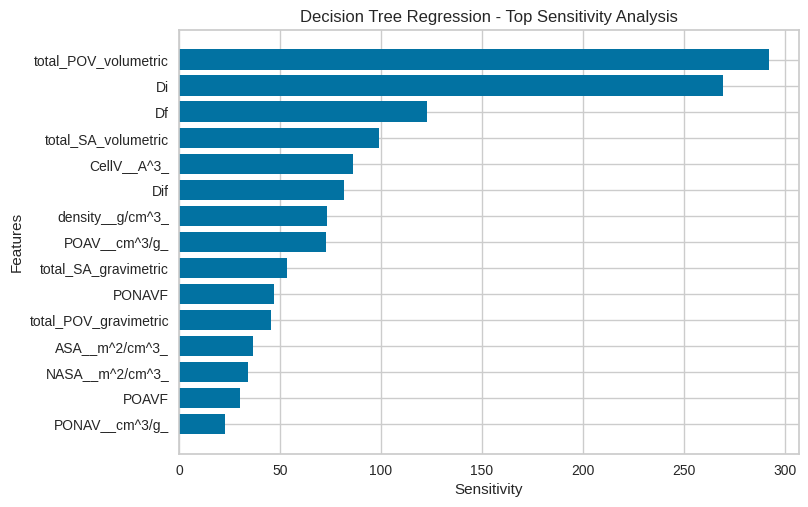


K-Nearest Neighbors Regression Evaluation Scores:
Mean Squared Error (MSE): 460.997199448112
Mean Absolute Error (MAE): 15.222974324677375
R^2 Score: 0.8538901835163297
Cross-Validation Mean MSE: 436.40418190847925
Cross-Validation Std MSE: 16.765287834094035


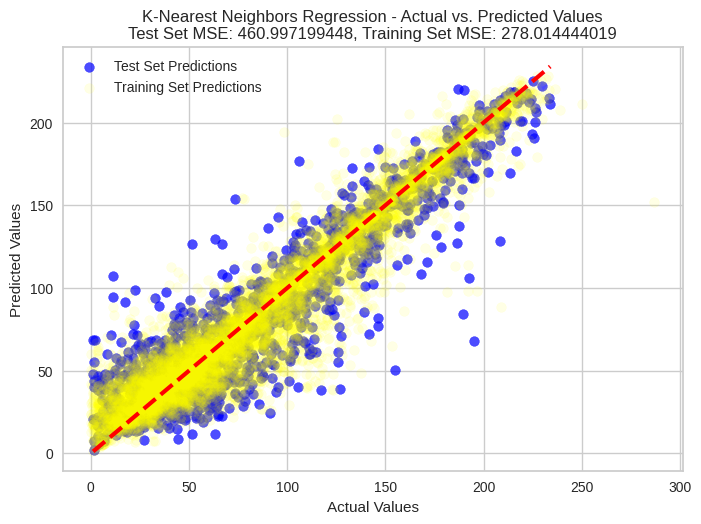

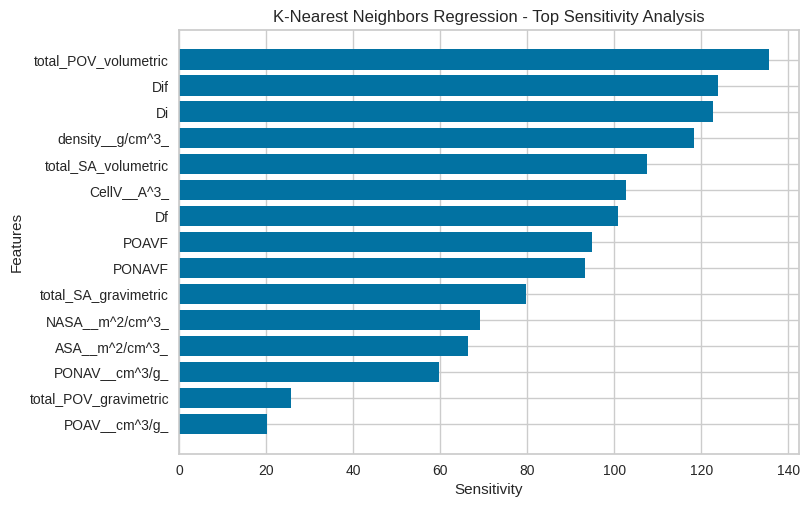

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
    "Random Forest Regression": RandomForestRegressor(),
    "Extreme Gradient Boosting": XGBRegressor(),
    "Gradient Boosting Regression": GradientBoostingRegressor(),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "Decision Tree Regression": DecisionTreeRegressor(),
    "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error')
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

## Model Stacking

In [32]:
def Meta_model_Tuning(X,y,TestSize,RandomState):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TestSize, random_state=RandomState)

    # Define base models
    base_models = [
        ("Extra Trees Regression", ExtraTreesRegressor()),
    #     ("Random Forest Regression", RandomForestRegressor()),
    #     ("Extreme Gradient Boosting", XGBRegressor()),
    #     ("Gradient Boosting Regression", GradientBoostingRegressor()),
    #     ("AdaBoost Regressor", AdaBoostRegressor()),
    #     ("Decision Tree Regression", DecisionTreeRegressor()),
    #     ("K-Nearest Neighbors Regression", KNeighborsRegressor()),
    ]



    
    meta_model = ExtraTreesRegressor(n_jobs=-1)

    
    train_predictions = []
    test_predictions = []

    # Train base models and gather predictions
    for model_name, model in base_models:
        model.fit(X_train, y_train)
        train_pred = model.predict(X_train)
        test_pred = model.predict(X_test)
        train_predictions.append(train_pred)
        test_predictions.append(test_pred)

    # Transpose predictions to match the shape for stacking
    train_predictions = np.array(train_predictions).T
    test_predictions = np.array(test_predictions).T

    # Train meta learner using the predictions from base models
    meta_model.fit(train_predictions, y_train)

    
    meta_predictions = meta_model.predict(test_predictions)

    
    mse = mean_squared_error(y_test, meta_predictions)
    mae = mean_absolute_error(y_test, meta_predictions)
    r2 = meta_model.score(test_predictions, y_test)

    
    cv_scores = cross_val_score(meta_model, train_predictions, y_train, cv=2, scoring='neg_mean_squared_error')
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()


    print("Stacked Model Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)

#     meta_model = ExtraTreesRegressor(n_jobs=-1)

#     param_space = {
#         'n_estimators': [20,30,40,50, 100, 150],
#         'max_depth': [None, 5, 10,20,30,50,100],  # Vary depth or leave unlimited
#         'min_samples_split': [1,2,3, 5, 10,30,50,70,100],  # Vary split size
#         'min_samples_leaf': [0,1, 2, 4,5,10,15,25,50,100],  # Vary leaf size
#         'max_features': ['sqrt', 'log2', None, 0.5, 0.6, 0.7, 0.8, 0.9]  # Vary feature selection
#     }
    
    meta_model=XGBRegressor(n_jobs=-1)

    param_space = {
        'n_estimators': [20,30,40,50, 100, 150,200,300,500],  # Number of boosting rounds
        'max_depth': [1,3, 5, 7, 9,20,30,50,100],  # Maximum depth of a tree
        'learning_rate': [0.001,0.01, 0.1, 0.2, 0.3],  
        'subsample': [0.1,0.3,0.4,0.5,0.6, 0.7, 0.8, 0.9, 1.0],  # Subsample ratio of the training instance
        'colsample_bytree': [0.1,0.3,0.5,0.6, 0.7, 0.8, 0.9, 1.0],  # Subsample ratio of columns when constructing each tree
        'reg_alpha': [0, 0.0001,0.001, 0.01, 0.1, 1,10,100],  # L1 regularization term on weights
        'reg_lambda': [0,0.000001,0.0001, 0.001, 0.01, 0.1, 1,10,100]  # L2 regularization term on weights
    }


    random_search = RandomizedSearchCV(
        estimator=meta_model,
        param_distributions=param_space,
        n_iter=300,  
        scoring='neg_mean_squared_error',
        cv=18,
        random_state=42,
        n_jobs=-1  
    )


    random_search.fit(train_predictions, y_train)

  
    best_meta_model = random_search.best_estimator_

  
    best_meta_predictions = best_meta_model.predict(test_predictions)


    best_mse = mean_squared_error(y_test, best_meta_predictions)
    best_mae = mean_absolute_error(y_test, best_meta_predictions)
    best_r2 = best_meta_model.score(test_predictions, y_test)


    print("Best Model Evaluation Scores:")
    print("Mean Squared Error (MSE):", best_mse)
    print("Mean Absolute Error (MAE):", best_mae)
    print("R^2 Score:", best_r2)


    print("Best Hyperparameters:", random_search.best_params_)

In [33]:
Meta_model_Tuning(X,y,TestSize=0.15,RandomState=42)

Stacked Model Evaluation Scores:
Mean Squared Error (MSE): 294.09713512714455
Mean Absolute Error (MAE): 11.74957074354394
R^2 Score: 0.9067879837594613
Cross-Validation Mean MSE: 0.3430643409910329
Cross-Validation Std MSE: 0.3429671267331218
Best Model Evaluation Scores:
Mean Squared Error (MSE): 294.38753622577167
Mean Absolute Error (MAE): 11.76627545697719
R^2 Score: 0.9066959431759657
Best Hyperparameters: {'subsample': 0.5, 'reg_lambda': 0.1, 'reg_alpha': 1, 'n_estimators': 200, 'max_depth': 20, 'learning_rate': 0.2, 'colsample_bytree': 0.8}


In [63]:
def ExtraTreesRegressionScore(X,y):
    k=np.arange(0.15,0.3,0.03)
    list=[]
    for i in k:
        for z in range(1,101):
            X_train, X_test, y_train, y_test= train_test_split(X,y, test_size=i, random_state=z)
            etr=ExtraTreesRegressor(n_jobs=-1)
            reg=etr.fit(X_train,y_train)           
            cv_score=cross_val_score(etr,X_train, y_train,n_jobs=-1,cv=2)
            Predictions=etr.predict(X_test)

            
            
            score= etr.score(X_test, y_test)
            list.append([i,cv_score.mean(),z,score])

    opted= max(list, key=lambda x:x[3])
    return opted



def ExtraTreesRegressionMse():
    k=np.arange(0.15,0.35,0.03)
    list=[]
    for i in k:
        for z in range(1,21):
            X_train, X_test, y_train, y_test= train_test_split(X,y, test_size=i, random_state=z)
            etr=ExtraTreesRegressor(n_jobs=-1)
            reg=etr.fit(X_train,y_train)

            
            cv_score=cross_val_score(etr,X_train, y_train,n_jobs=-1,cv=10)

            Predictions=etr.predict(X_test)
            mse=mean_squared_error(y_test,Predictions)

            score= etr.score(X_test, y_test)
            list.append([i,cv_score.mean(),z,score,mse])

    opted= min(list, key=lambda x:x[4])
    return opted



def ExtraTreesRegressionCVScore():
    k=np.arange(0.15,0.35,0.03)
    list=[]
    for i in k:
        for z in range(1,11):
            X_train, X_test, y_train, y_test= train_test_split(X,y, test_size=i, random_state=z)
            etr=ExtraTreesRegressor(n_jobs=-1)
            reg=etr.fit(X_train,y_train)
            
            cv_score=cross_val_score(etr,X_train, y_train,n_jobs=-1,cv=10)
            Predictions=etr.predict(X_test)
            score= etr.score(X_test, y_test)
            list.append([i,cv_score.max(),z,score])

    opted= max(list, key=lambda x:x[1])
    return opted


In [38]:
opted_Rscore=ExtraTreesRegressionScore(X,y)


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 276.2552100150999
Mean Absolute Error (MAE): 11.379064393859252
R^2 Score: 0.9095216180861245
Cross-Validation Mean MSE: 308.57999764910124
Cross-Validation Std MSE: 10.952019179732565


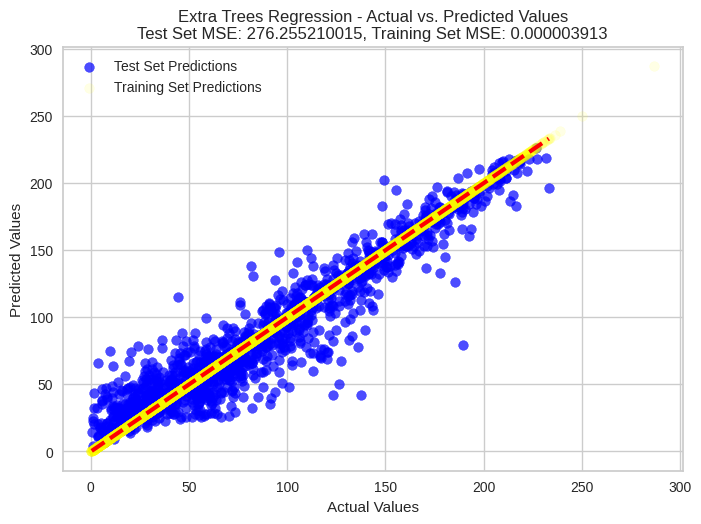

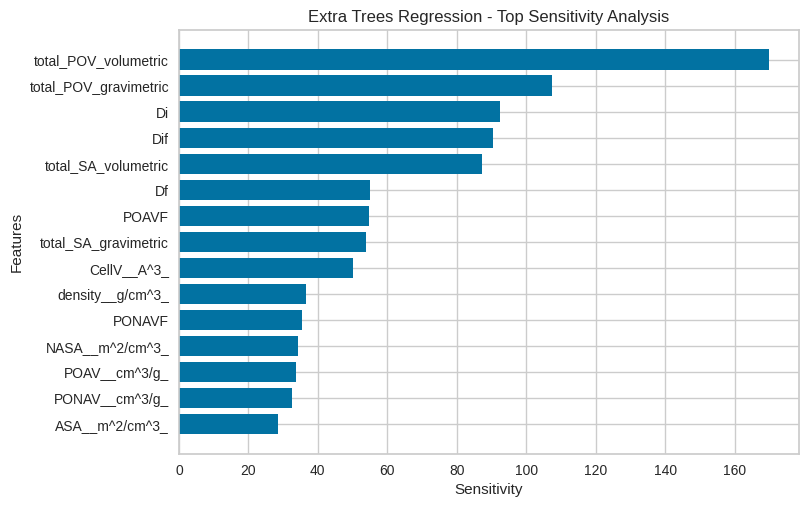

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(n_jobs=-1),
#     "Random Forest Regression": RandomForestRegressor(),
#     "Extreme Gradient Boosting": XGBRegressor(),
#     "Gradient Boosting Regression": GradientBoostingRegressor(),
#     "AdaBoost Regressor": AdaBoostRegressor(),
#     "Decision Tree Regression": DecisionTreeRegressor(),
#     "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
   
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
  
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

In [40]:
print(opted_Rscore)

[0.15, 0.8996449131013422, 6, 0.9086541901203927]


In [41]:
del opted_Rscore

In [42]:
opted_mse=ExtraTreesRegressionMse()


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 267.3770155450952
Mean Absolute Error (MAE): 11.431369696760656
R^2 Score: 0.9126296986110493
Cross-Validation Mean MSE: 308.8203630915218
Cross-Validation Std MSE: 9.27382563695678


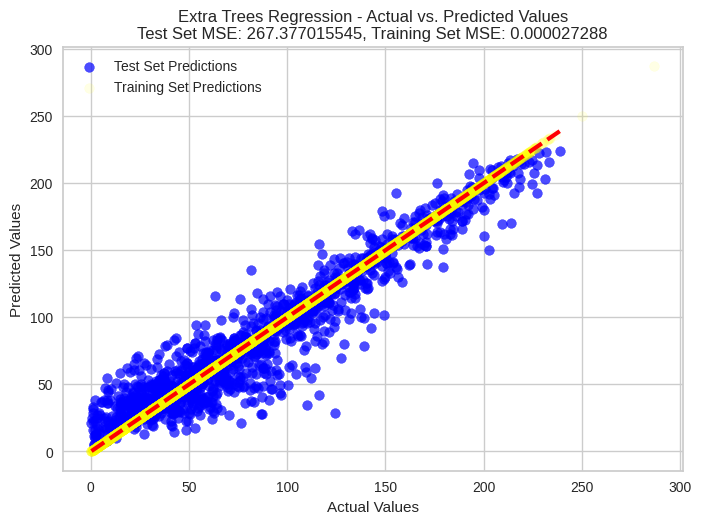

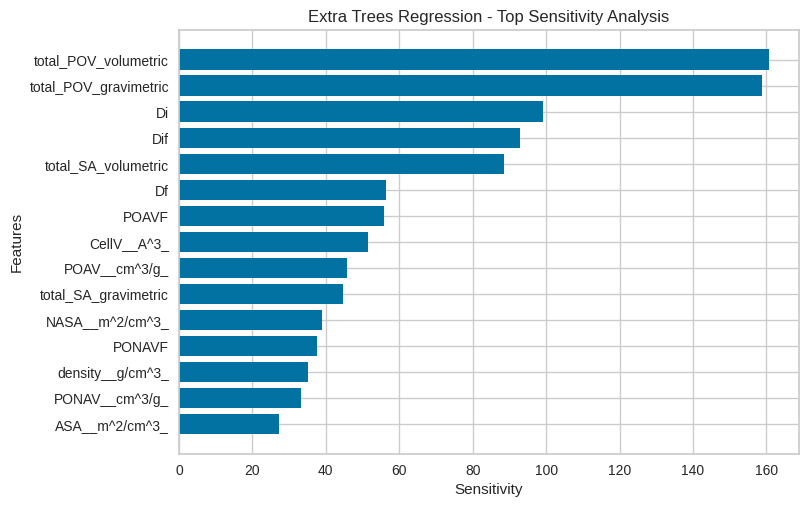

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_mse[0], random_state=opted_mse[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
#     "Random Forest Regression": RandomForestRegressor(),
#     "Extreme Gradient Boosting": XGBRegressor(),
#     "Gradient Boosting Regression": GradientBoostingRegressor(),
#     "AdaBoost Regressor": AdaBoostRegressor(),
#     "Decision Tree Regression": DecisionTreeRegressor(),
#     "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train) 

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error')
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

In [44]:
print(opted_mse)

[0.15, 0.8995737791360703, 18, 0.9125972098115034, 267.47644015646927]


In [45]:
del opted_mse

In [46]:
opted_cvscore= ExtraTreesRegressionCVScore()


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 312.2343447756882
Mean Absolute Error (MAE): 12.363596579662675
R^2 Score: 0.8985235309946946
Cross-Validation Mean MSE: 309.44694760846926
Cross-Validation Std MSE: 10.849135289187219


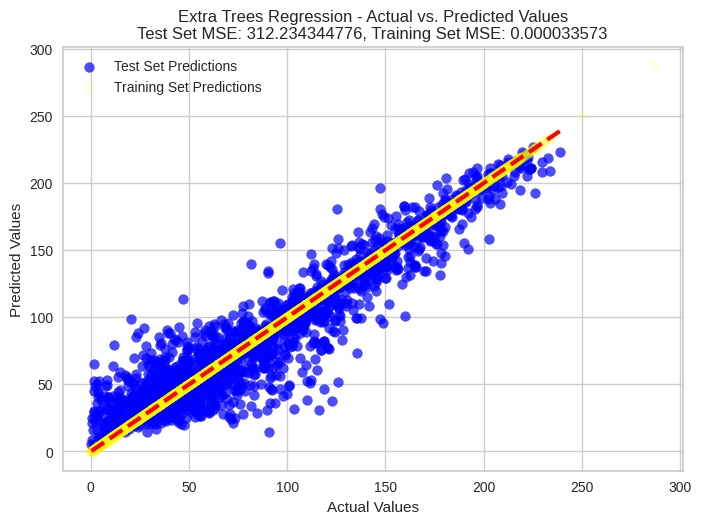

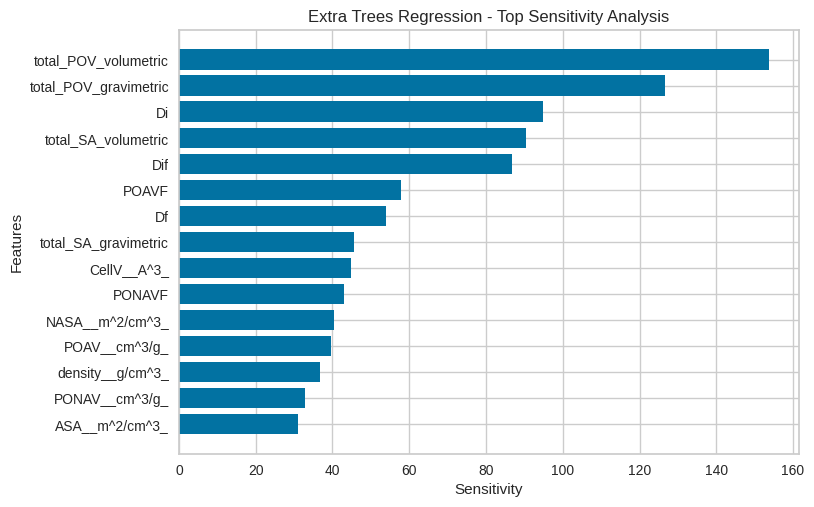

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_cvscore[0], random_state=opted_cvscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
#     "Random Forest Regression": RandomForestRegressor(),
#     "Extreme Gradient Boosting": XGBRegressor(),
#     "Gradient Boosting Regression": GradientBoostingRegressor(),
#     "AdaBoost Regressor": AdaBoostRegressor(),
#     "Decision Tree Regression": DecisionTreeRegressor(),
#     "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    

    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error')
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
   
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

In [48]:
print(opted_cvscore)

[0.21, 0.9230546439130396, 7, 0.898208570456088]


since this model is basedon optimizing CV score, then this has the lowest overfitting with optimal score between test size of 0.15 to 0.35 which showed the Rscore of 0.897 and max cv score of 0.924

In [49]:
del opted_cvscore

# LogKCH4

### pycaret test

In [50]:
regression_setup = setup(df_logKH_CH4, target='logKH_CH4')


best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])


final_model = finalize_model(best_model)


,Description,Value
0,Session id,4750
1,Target,logKH_CH4
2,Target type,Regression
3,Original data shape,"(9525, 16)"
4,Transformed data shape,"(9525, 16)"
5,Transformed train set shape,"(6667, 16)"
6,Transformed test set shape,"(2858, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.2411,0.1363,0.3683,0.5401,0.0643,0.0508,0.3027
rf,Random Forest Regressor,0.2504,0.1409,0.3745,0.5243,0.0654,0.0528,1.0880
xgboost,Extreme Gradient Boosting,0.2658,0.1520,0.3894,0.4857,0.0679,0.0558,0.0720
gbr,Gradient Boosting Regressor,0.2963,0.1730,0.4154,0.4154,0.0728,0.0626,0.4633
knn,K Neighbors Regressor,0.3274,0.2158,0.4640,0.2698,0.0801,0.0682,0.0093
ada,AdaBoost Regressor,0.3714,0.2380,0.4875,0.1941,0.0841,0.0771,0.1007
ridge,Ridge Regression,0.3595,0.2478,0.4969,0.1624,0.0861,0.0758,0.0060
br,Bayesian Ridge,0.3597,0.2483,0.4973,0.1608,0.0861,0.0758,0.0053
lr,Linear Regression,0.3599,0.2485,0.4975,0.1597,0.0861,0.0758,0.1287
dt,Decision Tree Regressor,0.3356,0.2741,0.5221,0.0721,0.0908,0.0700,0.0227


### Standard Scaling then ML

In [51]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

In [52]:
X=df_logKH_CH4.drop('logKH_CH4', axis=1)
y=df_logKH_CH4['logKH_CH4']

In [53]:
feature_names = X.columns

In [54]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.11437339455573325
Mean Absolute Error (MAE): 0.22497094987135144
R^2 Score: 0.5996687365884257
Cross-Validation Mean MSE: 0.12878352199259022
Cross-Validation Std MSE: 0.01380011536089429


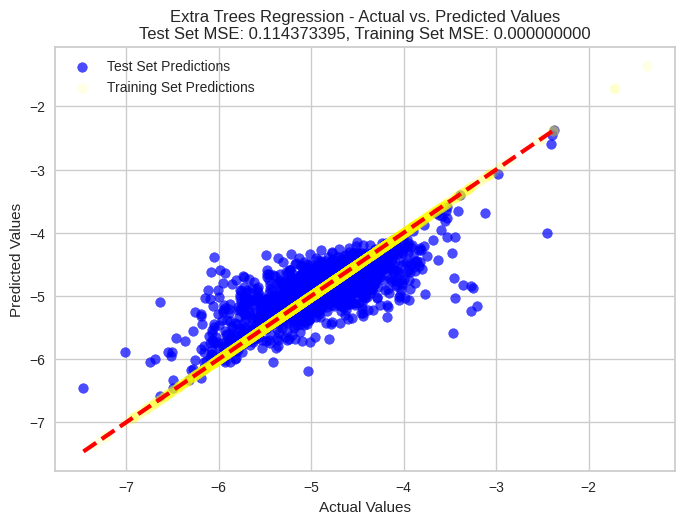

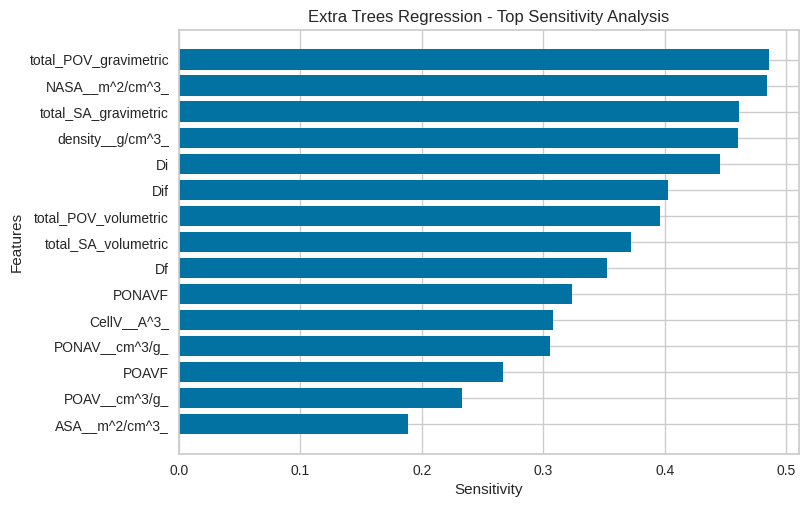


Random Forest Regression Evaluation Scores:
Mean Squared Error (MSE): 0.12177452239786977
Mean Absolute Error (MAE): 0.23552908421161134
R^2 Score: 0.5737632113461081
Cross-Validation Mean MSE: 0.13513896102588055
Cross-Validation Std MSE: 0.012982562984470796


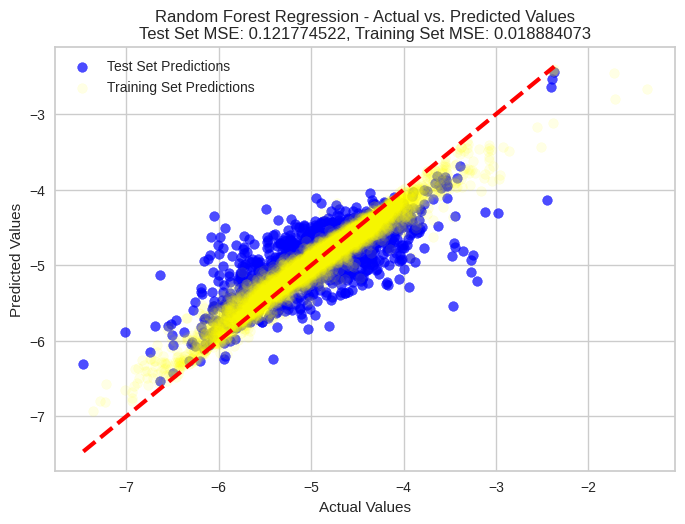

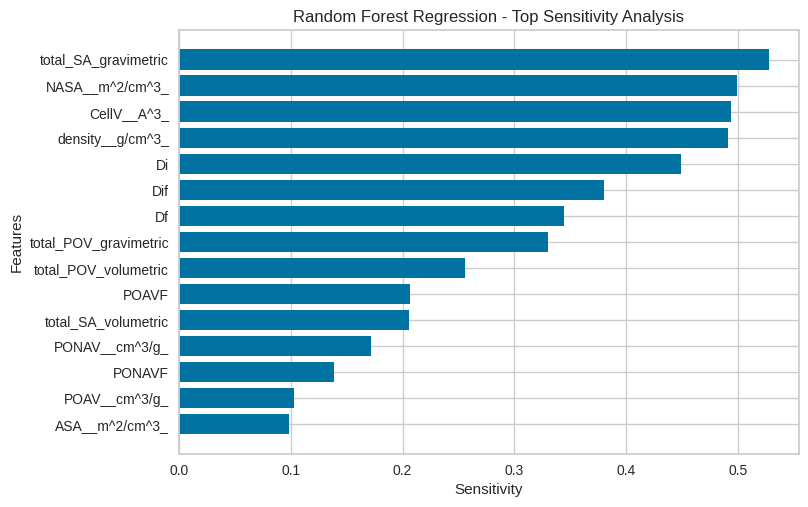


Extreme Gradient Boosting Evaluation Scores:
Mean Squared Error (MSE): 0.14339029031311784
Mean Absolute Error (MAE): 0.25864139355072896
R^2 Score: 0.4981034155278956
Cross-Validation Mean MSE: 0.15113499920548257
Cross-Validation Std MSE: 0.011598977020058045


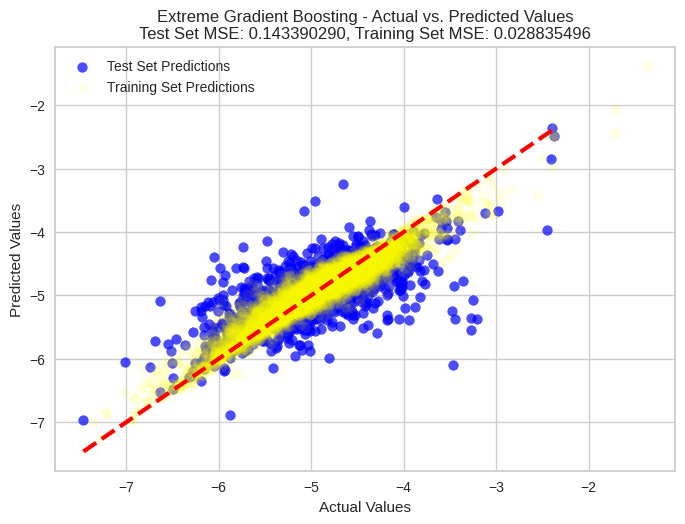

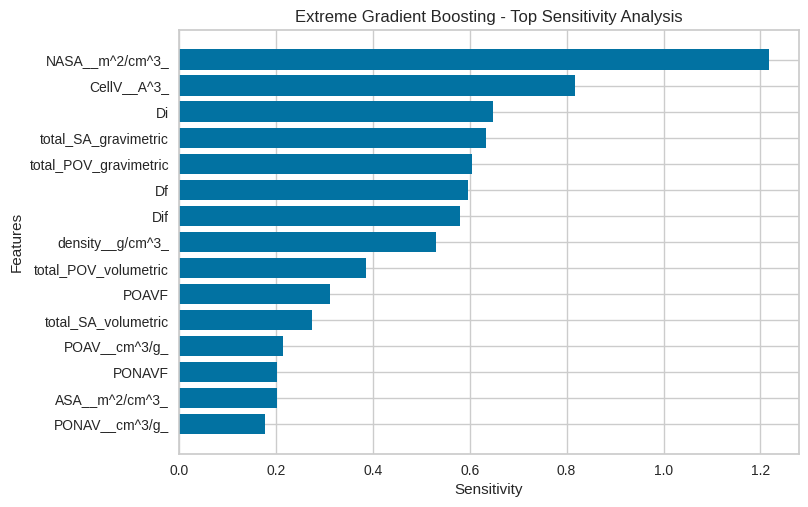


Gradient Boosting Regression Evaluation Scores:
Mean Squared Error (MSE): 0.15852647253843866
Mean Absolute Error (MAE): 0.290374050284517
R^2 Score: 0.4451235509621223
Cross-Validation Mean MSE: 0.16698634376940963
Cross-Validation Std MSE: 0.010018419663691118


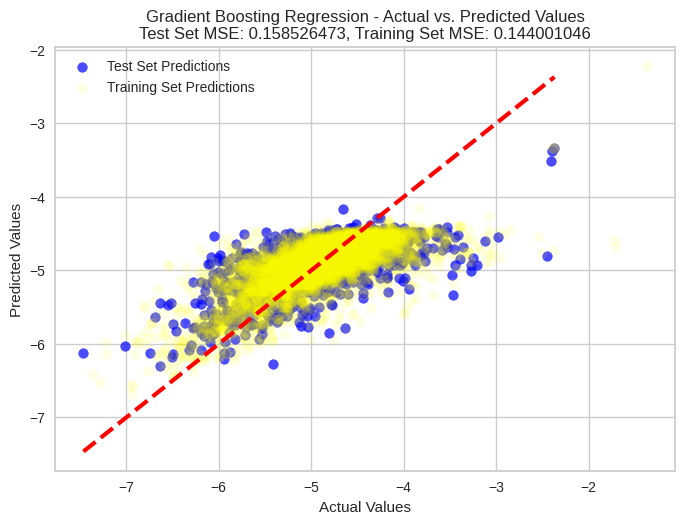

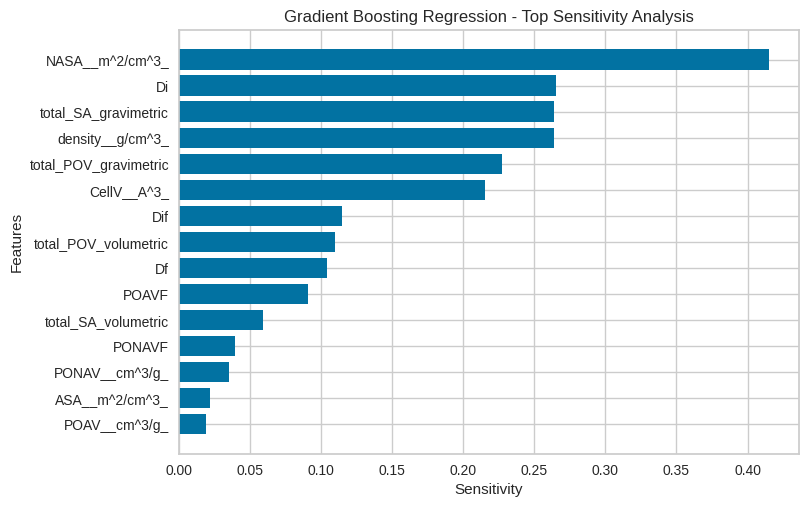


AdaBoost Regressor Evaluation Scores:
Mean Squared Error (MSE): 0.23179758002561304
Mean Absolute Error (MAE): 0.37108557560128164
R^2 Score: 0.18865905460049526
Cross-Validation Mean MSE: 0.23406648937171873
Cross-Validation Std MSE: 0.012013692641809756


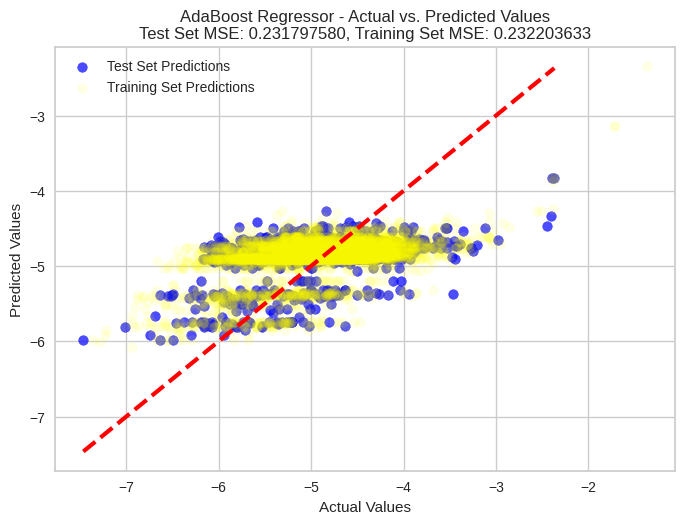

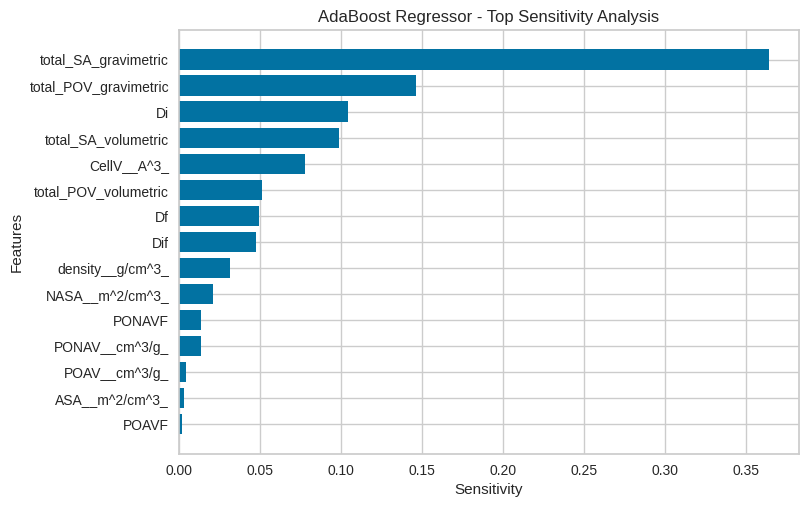


Decision Tree Regression Evaluation Scores:
Mean Squared Error (MSE): 0.27512018411733113
Mean Absolute Error (MAE): 0.3339826255156876
R^2 Score: 0.03702070463558582
Cross-Validation Mean MSE: 0.25605748871685713
Cross-Validation Std MSE: 0.011939972332726688


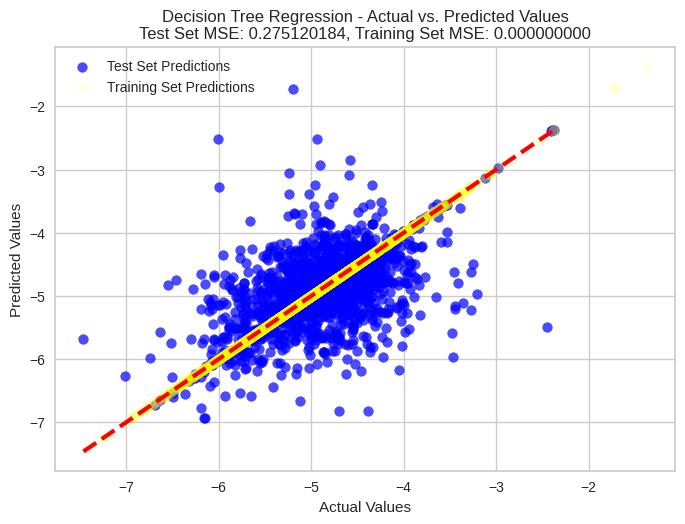

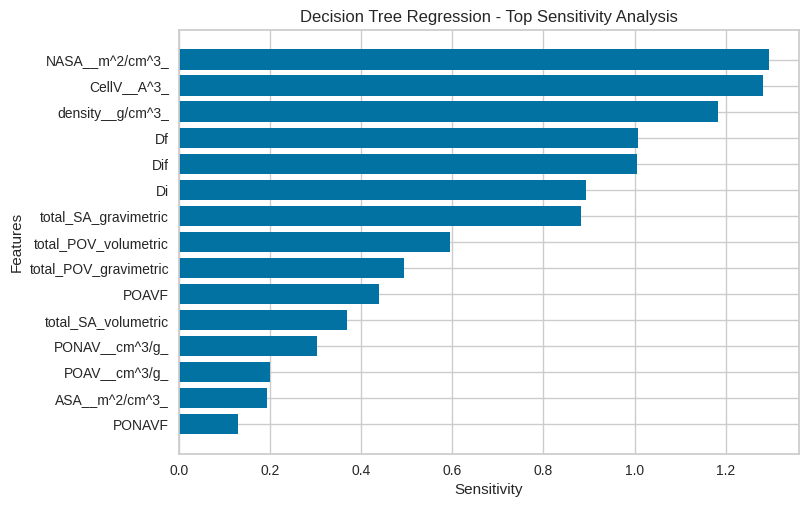


K-Nearest Neighbors Regression Evaluation Scores:
Mean Squared Error (MSE): 0.1504000582374975
Mean Absolute Error (MAE): 0.26680680390374006
R^2 Score: 0.47356773342901914
Cross-Validation Mean MSE: 0.16047595049546245
Cross-Validation Std MSE: 0.009850914894488833


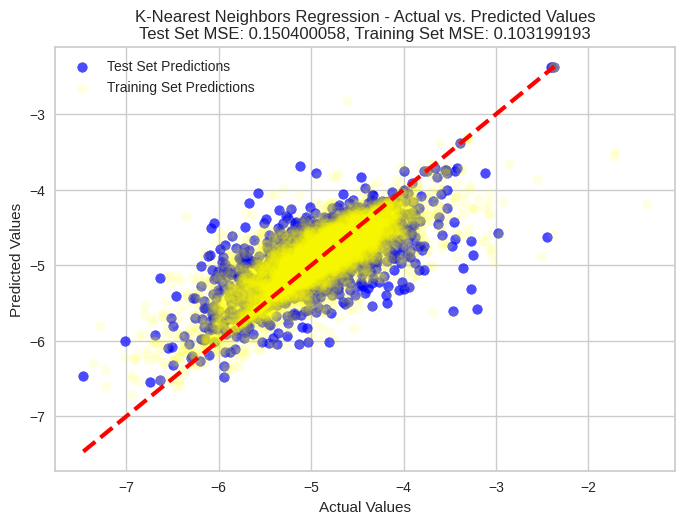

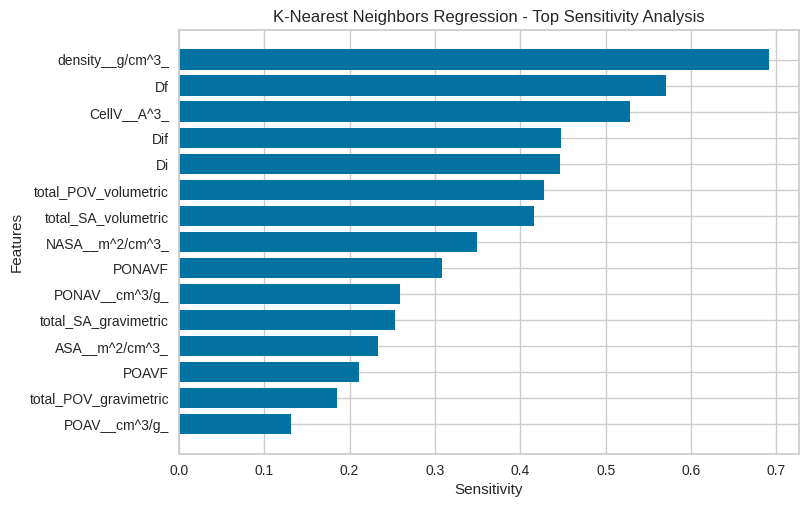

In [56]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
    "Random Forest Regression": RandomForestRegressor(),
    "Extreme Gradient Boosting": XGBRegressor(),
    "Gradient Boosting Regression": GradientBoostingRegressor(),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "Decision Tree Regression": DecisionTreeRegressor(),
    "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
   
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error', n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

### MinMax Scaling then ML

In [57]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_CH4DC.columns = clean_feature_names

In [58]:
X=df_logKH_CH4.drop('logKH_CH4', axis=1)
y=df_logKH_CH4['logKH_CH4']

In [59]:
feature_names = X.columns

In [60]:
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.11360528468696866
Mean Absolute Error (MAE): 0.22406609246445747
R^2 Score: 0.6023572848770888
Cross-Validation Mean MSE: 0.1277025131919636
Cross-Validation Std MSE: 0.014349068205681591


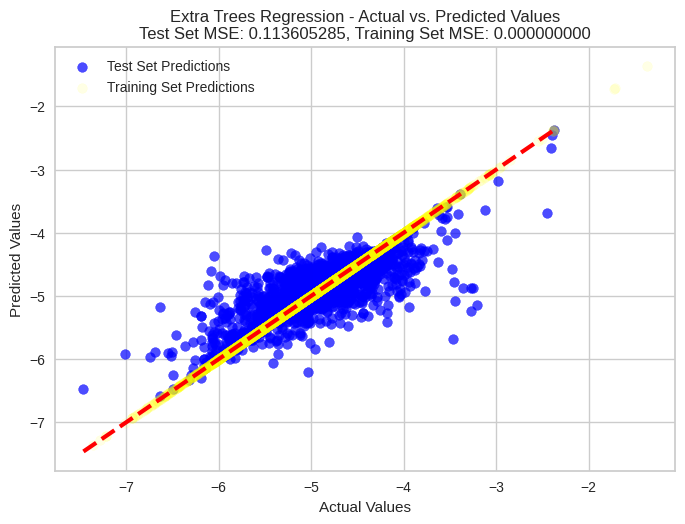

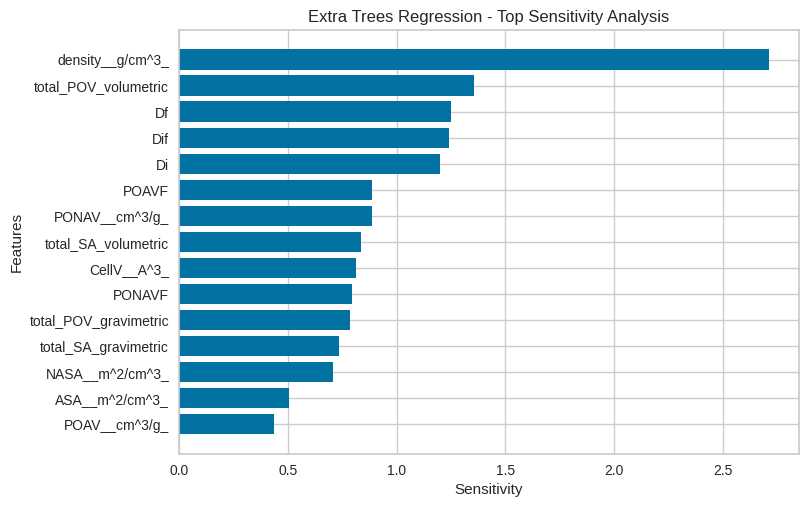


Random Forest Regression Evaluation Scores:
Mean Squared Error (MSE): 0.12099762025910193
Mean Absolute Error (MAE): 0.2355684128740033
R^2 Score: 0.5764825344541455
Cross-Validation Mean MSE: 0.13348141750797363
Cross-Validation Std MSE: 0.013601032889614185


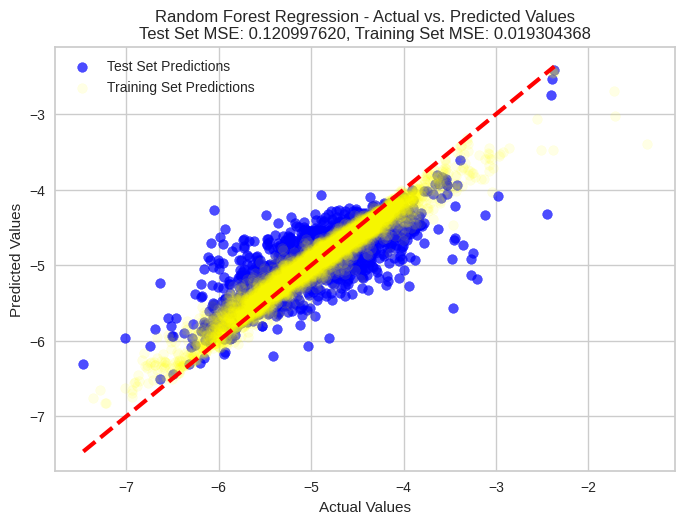

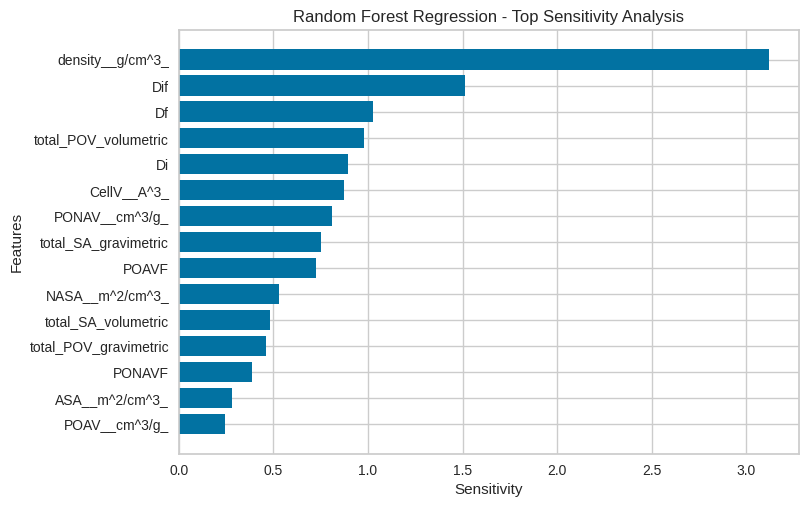


Extreme Gradient Boosting Evaluation Scores:
Mean Squared Error (MSE): 0.14339029031311784
Mean Absolute Error (MAE): 0.25864139355072896
R^2 Score: 0.4981034155278956
Cross-Validation Mean MSE: 0.15113499920548257
Cross-Validation Std MSE: 0.011598977020058045


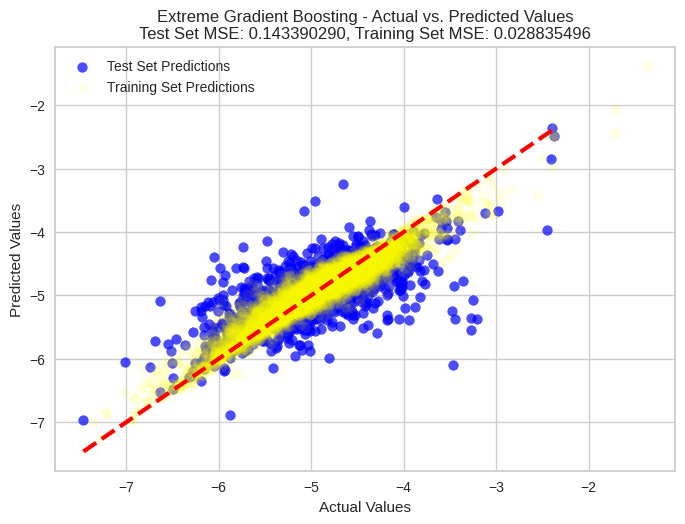

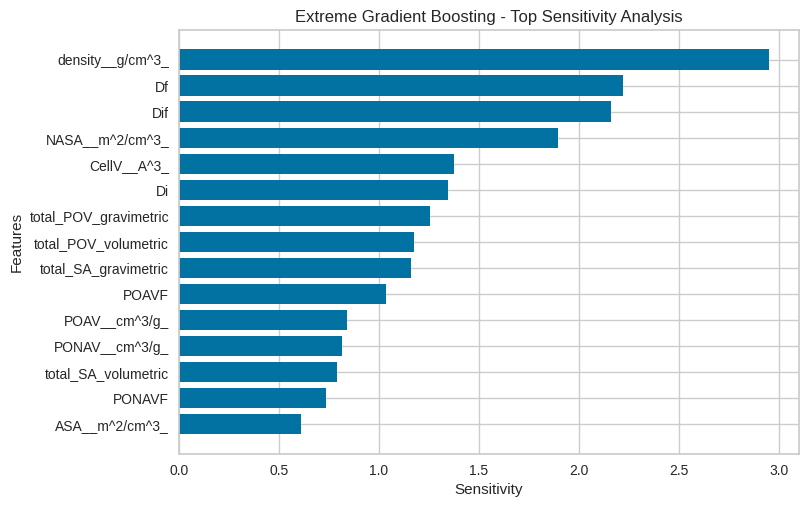


Gradient Boosting Regression Evaluation Scores:
Mean Squared Error (MSE): 0.1585741716688583
Mean Absolute Error (MAE): 0.29046194852586116
R^2 Score: 0.4449565938370086
Cross-Validation Mean MSE: 0.16726912306080177
Cross-Validation Std MSE: 0.010317171961413617


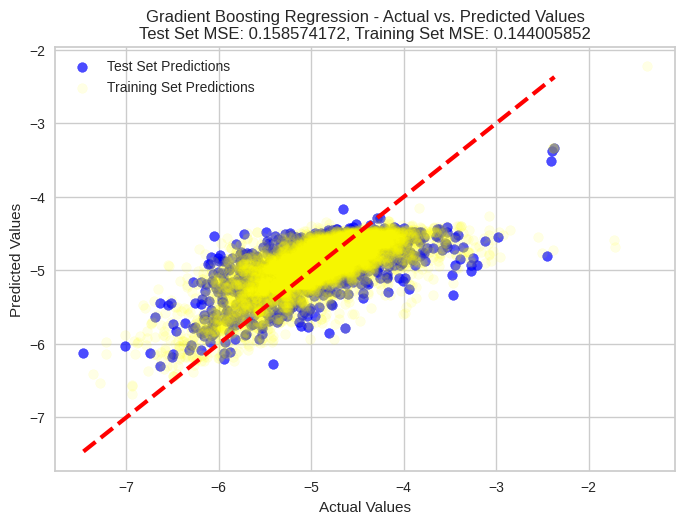

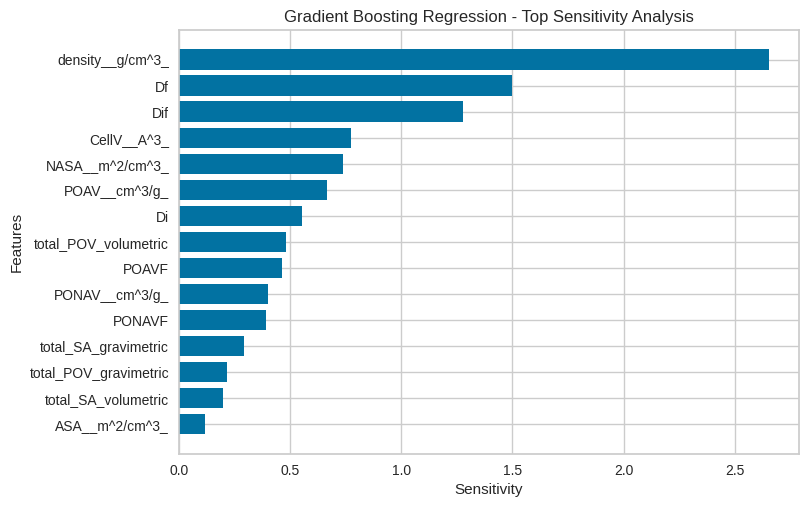


AdaBoost Regressor Evaluation Scores:
Mean Squared Error (MSE): 0.2292431622180251
Mean Absolute Error (MAE): 0.36557942670973925
R^2 Score: 0.19760006148557463
Cross-Validation Mean MSE: 0.23382323925964962
Cross-Validation Std MSE: 0.012502637174218886


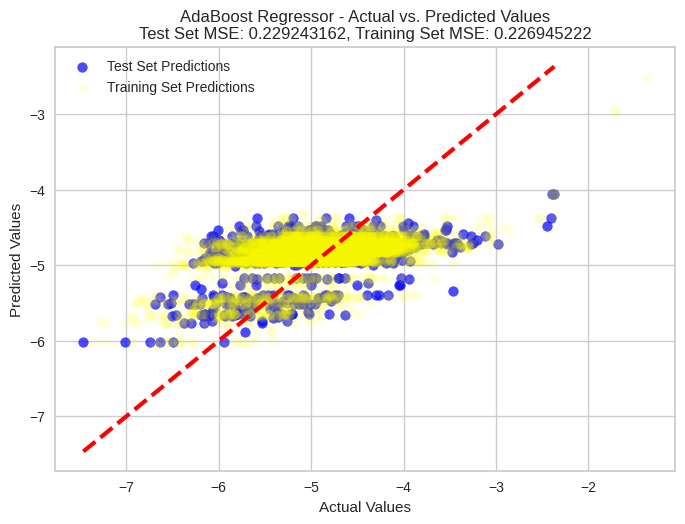

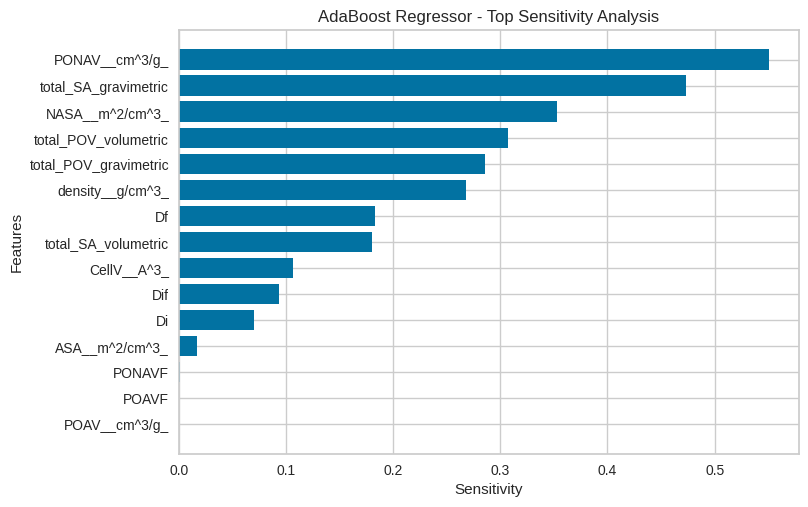


Decision Tree Regression Evaluation Scores:
Mean Squared Error (MSE): 0.2600510488116652
Mean Absolute Error (MAE): 0.3236071665324811
R^2 Score: 0.08976589068930163
Cross-Validation Mean MSE: 0.2484665997543089
Cross-Validation Std MSE: 0.011009023993430556


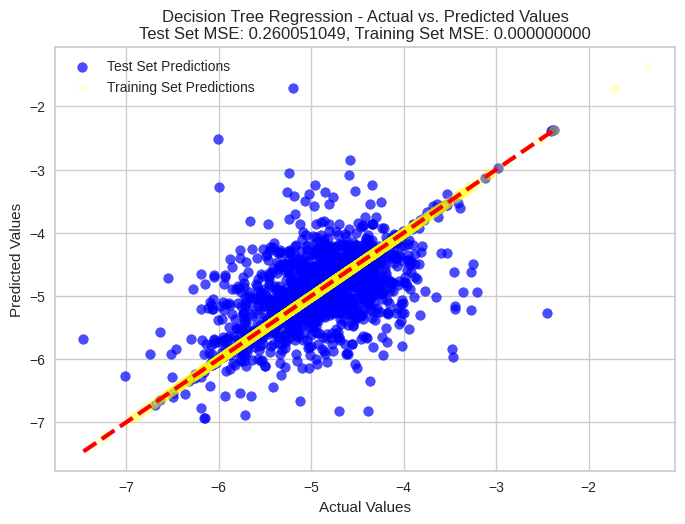

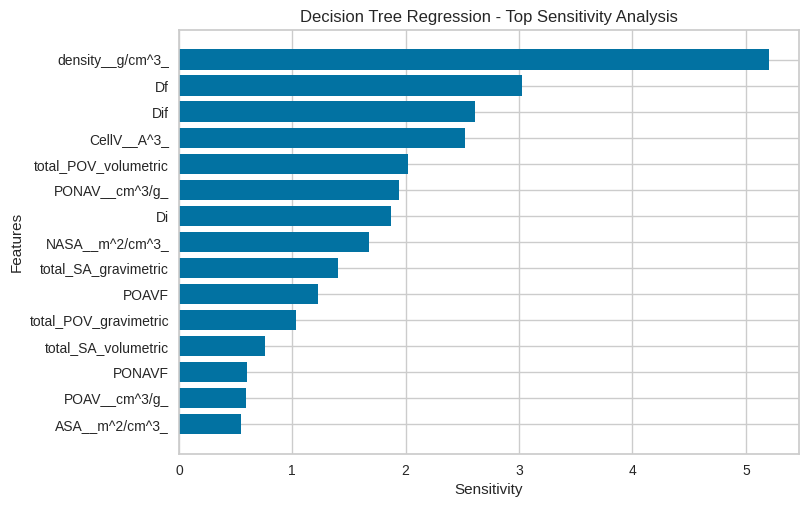


K-Nearest Neighbors Regression Evaluation Scores:
Mean Squared Error (MSE): 0.16228390377282548
Mean Absolute Error (MAE): 0.2782610513546647
R^2 Score: 0.4319717406212026
Cross-Validation Mean MSE: 0.17023880299791724
Cross-Validation Std MSE: 0.009607150288449922


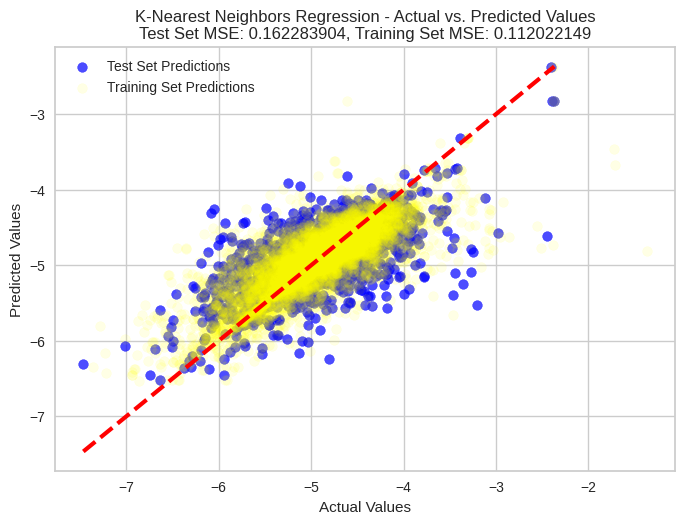

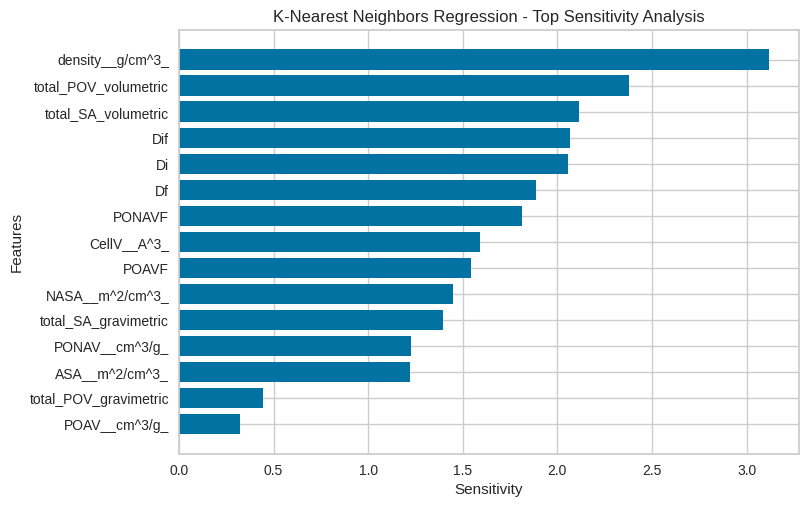

In [61]:
X=pd.DataFrame(X_scaled,columns=feature_names)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
    "Random Forest Regression": RandomForestRegressor(),
    "Extreme Gradient Boosting": XGBRegressor(),
    "Gradient Boosting Regression": GradientBoostingRegressor(),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "Decision Tree Regression": DecisionTreeRegressor(),
    "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
   
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
   
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

# Loop over Parameters of test size and random_state

In [62]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4.drop('logKH_CH4', axis=1)
y=df_logKH_CH4['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

In [63]:
opted_Rscore= ExtraTreesRegressionScore(X,y)


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.10685565560019733
Mean Absolute Error (MAE): 0.21424912961095302
R^2 Score: 0.6136311504327051
Cross-Validation Mean MSE: 0.1290737529661905
Cross-Validation Std MSE: 0.013508120101043717


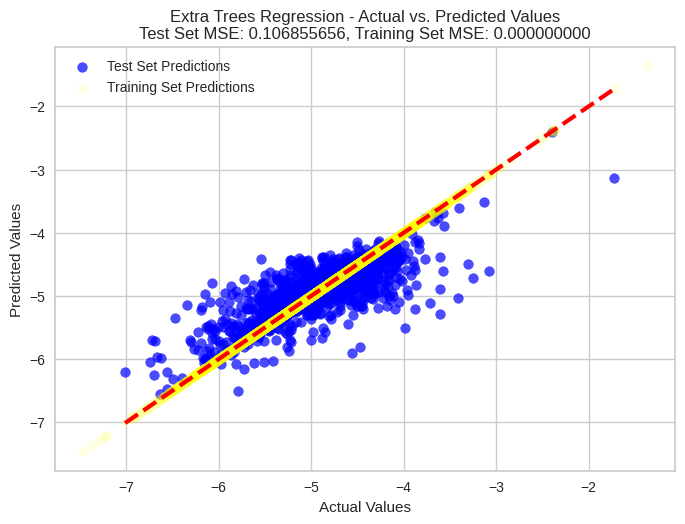

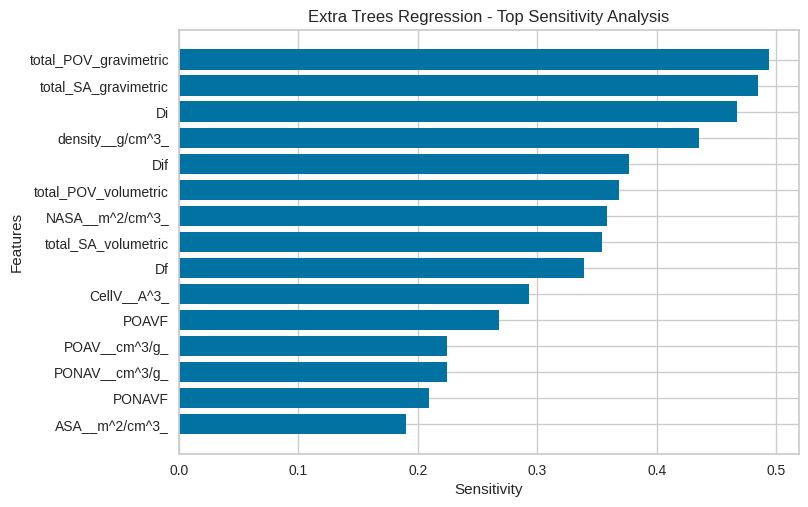

In [64]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
#     "Random Forest Regression": RandomForestRegressor(),
#     "Extreme Gradient Boosting": XGBRegressor(),
#     "Gradient Boosting Regression": GradientBoostingRegressor(),
#     "AdaBoost Regressor": AdaBoostRegressor(),
#     "Decision Tree Regression": DecisionTreeRegressor(),
#     "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
 
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

In [65]:
print(opted_Rscore)

[0.15, 0.5477284807597887, 2, 0.6029067151093449]


In [66]:
del opted_Rscore

In [67]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4.drop('logKH_CH4', axis=1)
y=df_logKH_CH4['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

In [68]:
opted_mse=ExtraTreesRegressionMse()


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.1063891700288031
Mean Absolute Error (MAE): 0.2148666398960958
R^2 Score: 0.588508789126921
Cross-Validation Mean MSE: 0.12836948830384629
Cross-Validation Std MSE: 0.013534141622902623


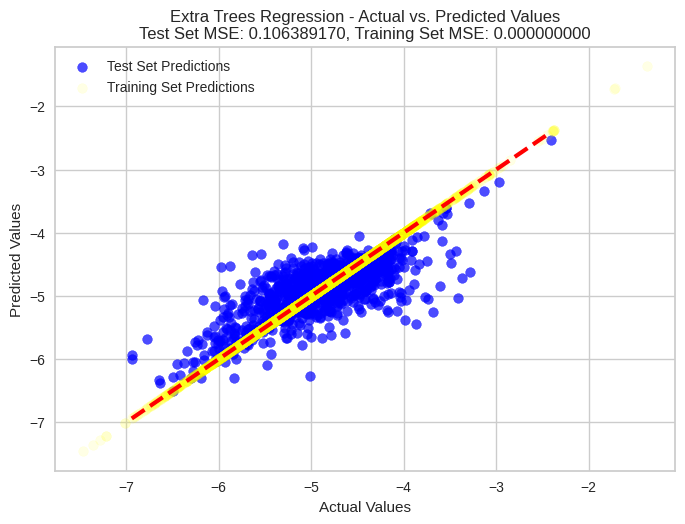

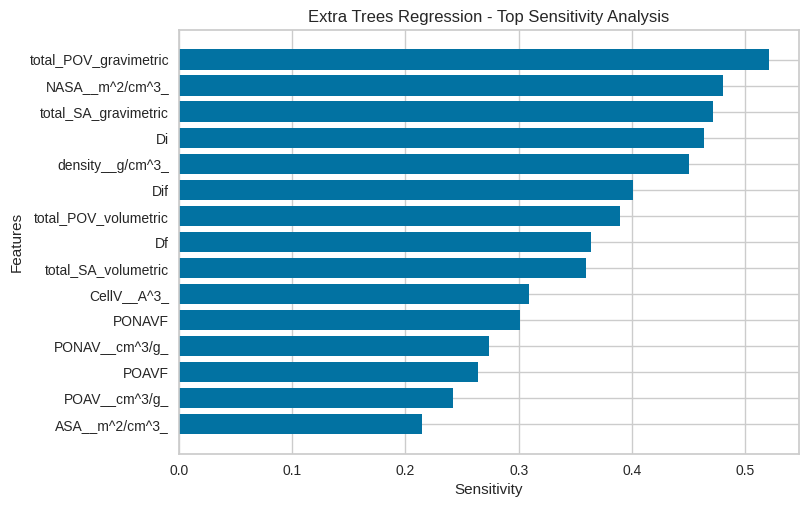

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_mse[0], random_state=opted_mse[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
#     "Random Forest Regression": RandomForestRegressor(),
#     "Extreme Gradient Boosting": XGBRegressor(),
#     "Gradient Boosting Regression": GradientBoostingRegressor(),
#     "AdaBoost Regressor": AdaBoostRegressor(),
#     "Decision Tree Regression": DecisionTreeRegressor(),
#     "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
   
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

In [70]:
print(opted_mse)

[0.15, 0.5560982862994299, 3, 0.5930094563700867, 0.10522554310330863]


In [71]:
del opted_mse

In [72]:
opted_cvscore= ExtraTreesRegressionCVScore()


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.13074310583728418
Mean Absolute Error (MAE): 0.23821746718088127
R^2 Score: 0.5348323535386077
Cross-Validation Mean MSE: 0.12878211104922752
Cross-Validation Std MSE: 0.014893254799615875


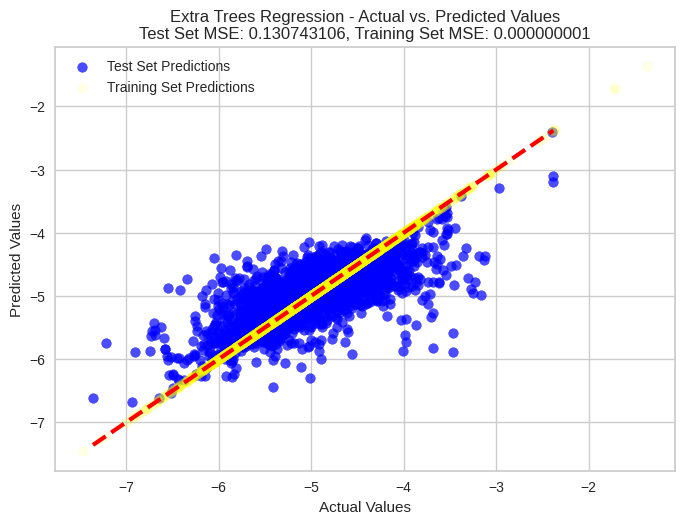

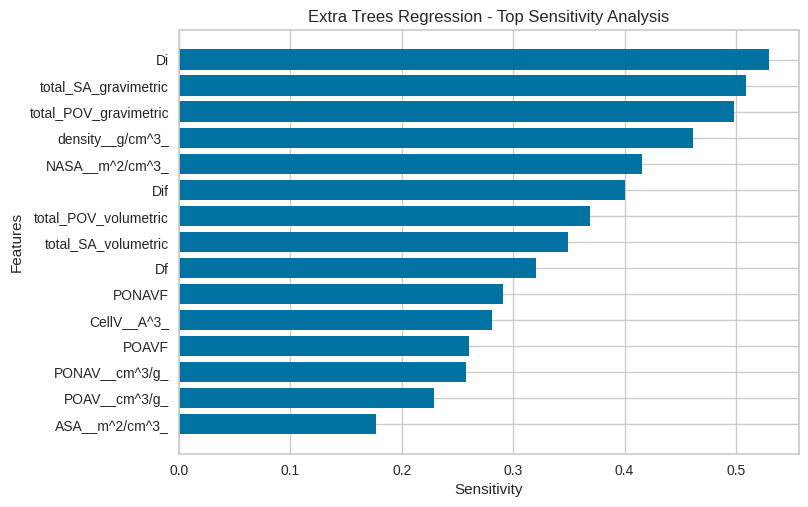

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_cvscore[0], random_state=opted_cvscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),
#     "Random Forest Regression": RandomForestRegressor(),
#     "Extreme Gradient Boosting": XGBRegressor(),
#     "Gradient Boosting Regression": GradientBoostingRegressor(),
#     "AdaBoost Regressor": AdaBoostRegressor(),
#     "Decision Tree Regression": DecisionTreeRegressor(),
#     "K-Nearest Neighbors Regression": KNeighborsRegressor(),
    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
   
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

In [74]:
print(opted_cvscore)

[0.32999999999999996, 0.6409754190543618, 7, 0.5355445161417232]


In [75]:
del opted_cvscore

### LogKCH4-MetaModel_tuning

In [77]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=2)


base_models = [
    ("Extra Trees Regression", ExtraTreesRegressor()),
#     ("Random Forest Regression", RandomForestRegressor()),
#     ("Extreme Gradient Boosting", XGBRegressor()),
#     ("Gradient Boosting Regression", GradientBoostingRegressor()),
#     ("AdaBoost Regressor", AdaBoostRegressor()),
#     ("Decision Tree Regression", DecisionTreeRegressor()),
#     ("K-Nearest Neighbors Regression", KNeighborsRegressor()),
]


meta_model = LinearRegression()


train_predictions = []
test_predictions = []


for model_name, model in base_models:
    model.fit(X_train, y_train)
    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test)
    train_predictions.append(train_pred)
    test_predictions.append(test_pred)


train_predictions = np.array(train_predictions).T
test_predictions = np.array(test_predictions).T


meta_model.fit(train_predictions, y_train)


meta_predictions = meta_model.predict(test_predictions)


mse = mean_squared_error(y_test, meta_predictions)
mae = mean_absolute_error(y_test, meta_predictions)
r2 = meta_model.score(test_predictions, y_test)


cv_scores = cross_val_score(meta_model, train_predictions, y_train, cv=5, scoring='neg_mean_squared_error',n_jobs=-1)
cv_mse_scores = -cv_scores
cv_mean_mse = cv_mse_scores.mean()
cv_std_mse = cv_mse_scores.std()


print("Stacked Model Evaluation Scores:")
print("Mean Squared Error (MSE):", mse)
print("Mean Absolute Error (MAE):", mae)
print("R^2 Score:", r2)
print("Cross-Validation Mean MSE:", cv_mean_mse)
print("Cross-Validation Std MSE:", cv_std_mse)

Stacked Model Evaluation Scores:
Mean Squared Error (MSE): 0.10863701073917956
Mean Absolute Error (MAE): 0.2156231721906791
R^2 Score: 0.6071901236863577
Cross-Validation Mean MSE: 3.919260184207236e-11
Cross-Validation Std MSE: 4.8000938105075727e-11


In [78]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score

# Define meta model
# meta_model_lr = LinearRegression()

# # Hyperparameters to tune
# param_grid_lr = {
#     'fit_intercept': [True, False],
#     'positive': [True, False],
# #     'normalize': [True, False],
#     'copy_X': [True, False],
# #     'n_jobs': [None, -1],
# }

meta_model_gb = GradientBoostingRegressor()
param_grid_gb = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [3, 5, 7],  
    'min_samples_split': [2, 5, 10], 
    'min_samples_leaf': [1, 2, 4],  
    'subsample': [0.8, 0.9, 1.0]  
}


meta_model_xgb = XGBRegressor()
param_grid_xgb = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [3, 5, 7],  
    'min_child_weight': [1, 3, 5], 
    'subsample': [0.8, 0.9, 1.0],  
    'colsample_bytree': [0.8, 0.9, 1.0],  
}

meta_model_et = ExtraTreesRegressor()
param_grid_et = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 5, 10], 
    'min_samples_split': [2, 5, 10], 
    'min_samples_leaf': [1, 2, 4], 
    'max_features': [ 'sqrt', 'log2']  
}


# grid_search_lr = GridSearchCV(meta_model, param_grid, cv=5, scoring='neg_mean_squared_error')
# grid_search_lr.fit(train_predictions, y_train)


grid_search_gb = GridSearchCV(meta_model_gb, param_grid_gb, cv=5, scoring='neg_mean_squared_error',n_jobs=-1)
grid_search_gb.fit(train_predictions, y_train)


grid_search_xgb = GridSearchCV(meta_model_xgb, param_grid_xgb, cv=5, scoring='neg_mean_squared_error',n_jobs=-1)
grid_search_xgb.fit(train_predictions, y_train)

grid_search_et = GridSearchCV(meta_model_et, param_grid_et, cv=5, scoring='neg_mean_squared_error',n_jobs=-1)
grid_search_et.fit(train_predictions, y_train)


# best_params_lr = grid_search_lr.best_params_
best_params_gb = grid_search_gb.best_params_
best_params_xgb = grid_search_xgb.best_params_
best_params_et = grid_search_et.best_params_


# meta_model_tuned_lr = LinearRegression(**best_params_lr)
meta_model_tuned_gb = GradientBoostingRegressor(**best_params_gb)
meta_model_tuned_xgb = XGBRegressor(**best_params_xgb)
meta_model_tuned_et = ExtraTreesRegressor(**best_params_et)



# # meta_model_tuned_lr.fit(train_predictions, y_train)
meta_model_tuned_gb.fit(train_predictions, y_train)
meta_model_tuned_xgb.fit(train_predictions, y_train)
meta_model_tuned_et.fit(train_predictions, y_train)



# meta_predictions_tuned_lr = meta_model_tuned_lr.predict(test_predictions)
meta_predictions_tuned_gb = meta_model_tuned_gb.predict(test_predictions)
meta_predictions_tuned_xgb = meta_model_tuned_xgb.predict(test_predictions)
meta_predictions_tuned_et = meta_model_tuned_et.predict(test_predictions)


# mse_tuned_lr = mean_squared_error(y_test, meta_predictions_tuned_lr)
# mae_tuned_lr = mean_absolute_error(y_test, meta_predictions_tuned_lr)
# r2_tuned_lr = r2_score(y_test, meta_predictions_tuned_lr)

mse_tuned_gb = mean_squared_error(y_test, meta_predictions_tuned_gb)
mae_tuned_gb = mean_absolute_error(y_test, meta_predictions_tuned_gb)
r2_tuned_gb = r2_score(y_test, meta_predictions_tuned_gb)

mse_tuned_xgb = mean_squared_error(y_test, meta_predictions_tuned_xgb)
mae_tuned_xgb = mean_absolute_error(y_test, meta_predictions_tuned_xgb)
r2_tuned_xgb = r2_score(y_test, meta_predictions_tuned_xgb)

mse_tuned_et = mean_squared_error(y_test, meta_predictions_tuned_et)
mae_tuned_et = mean_absolute_error(y_test, meta_predictions_tuned_et)
r2_tuned_et = r2_score(y_test, meta_predictions_tuned_et)

print("Tuned Meta Model Evaluation Scores:")
# print("Linear Regression:")
# print("Mean Squared Error (MSE):", mse_tuned_lr)
# print("Mean Absolute Error (MAE):", mae_tuned_lr)
# print("R^2 Score:", r2_tuned_lr)
print("\nGradient Boosting Regressor:")
print("Mean Squared Error (MSE):", mse_tuned_gb)
print("Mean Absolute Error (MAE):", mae_tuned_gb)
print("R^2 Score:", r2_tuned_gb)
print("\nXGBoost Regressor:")
print("Mean Squared Error (MSE):", mse_tuned_xgb)
print("Mean Absolute Error (MAE):", mae_tuned_xgb)
print("R^2 Score:", r2_tuned_xgb)
print("\nExtraTree Regressor:")
print("Mean Squared Error (MSE):", mse_tuned_et)
print("Mean Absolute Error (MAE):", mae_tuned_et)
print("R^2 Score:", r2_tuned_et)

Tuned Meta Model Evaluation Scores:

Gradient Boosting Regressor:
Mean Squared Error (MSE): 0.10865942271929677
Mean Absolute Error (MAE): 0.21563616660789334
R^2 Score: 0.607109086412984

XGBoost Regressor:
Mean Squared Error (MSE): 0.10826152107993013
Mean Absolute Error (MAE): 0.21573188499367332
R^2 Score: 0.6085478197938191

ExtraTree Regressor:
Mean Squared Error (MSE): 0.10863669655602175
Mean Absolute Error (MAE): 0.2156220807606225
R^2 Score: 0.6071912597103197


# Tuning XGB metamodel

In [79]:
def MetaModelScore(X, y):
    k = np.arange(0.15, 0.3, 0.02)
    results = []
    step = 1

    best_r2 = -np.inf
    best_params = None
    
    for i in k:
        for z in range(1, 3):
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=i, random_state=z)
            base_models = [
                ("Extra Trees Regression", ExtraTreesRegressor()),
                
            ]

           
            train_predictions = []
            test_predictions = []

            
            for model_name, model in base_models:
                model.fit(X_train, y_train)
                train_pred = model.predict(X_train)
                test_pred = model.predict(X_test)
                train_predictions.append(train_pred)
                test_predictions.append(test_pred)

           
            train_predictions = np.array(train_predictions).T
            test_predictions = np.array(test_predictions).T

          
            meta_model_gb = GradientBoostingRegressor()
            param_dist_gb = {
                'n_estimators': randint(50, 151),
                'learning_rate': uniform(0.01, 0.5),
                'max_depth': randint(1, 10),  
                'min_samples_split': randint(1, 11),  
                'min_samples_leaf': randint(1, 15),  
                'subsample': uniform(0.9, 0.2),  
            }

            random_search_gb = RandomizedSearchCV(meta_model_gb, param_distributions=param_dist_gb, 
                                                  n_iter=100, cv=5, scoring='neg_mean_squared_error', 
                                                  n_jobs=-1, random_state=z)
            random_search_gb.fit(train_predictions, y_train)
            best_params_gb = random_search_gb.best_params_
            meta_model_tuned_gb = GradientBoostingRegressor(**best_params_gb)
            meta_model_tuned_gb.fit(train_predictions, y_train)
            meta_predictions_tuned_gb = meta_model_tuned_gb.predict(test_predictions)
            mse_tuned_gb = mean_squared_error(y_test, meta_predictions_tuned_gb)
            mae_tuned_gb = mean_absolute_error(y_test, meta_predictions_tuned_gb)
            r2_tuned_gb = r2_score(y_test, meta_predictions_tuned_gb)
            
            print("\nGradient Boosting Regressor", 'step:', step)
            print("Test Size:", i)
            print("Random State:", z)
            print("Mean Squared Error (MSE):", mse_tuned_gb)
            print("Mean Absolute Error (MAE):", mae_tuned_gb)
            print("R^2 Score:", r2_tuned_gb)
            if r2_tuned_gb > best_r2:
                best_r2 = r2_tuned_gb
                best_params = best_params_gb

            plt.figure()
            plt.scatter(y_test, meta_predictions_tuned_gb, alpha=0.7, label='Meta-model Test Set Predictions', color='blue')
            plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')

            
            plt.scatter(y_train, meta_model_tuned_gb.predict(train_predictions), alpha=0.1, label='Training Set Predictions', color='yellow')

            plt.xlabel("Actual Values")
            plt.ylabel("Predicted Values")
            plt.title("Meta-model - Actual vs. Predicted Values")
            plt.legend()
            plt.show()


            step += 1
            results.append([i, z, mse_tuned_gb, mae_tuned_gb, r2_tuned_gb])
            
    print("Best Parameters based on R^2 Score:", best_params)
    opted_MetaModel = max(results, key=lambda x: x[4])
    print(opted_MetaModel)
    return opted_MetaModel

In [80]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_CH4DC.columns = clean_feature_names

In [81]:
X=df_logKH_CH4.drop('logKH_CH4', axis=1)
y=df_logKH_CH4['logKH_CH4']

In [82]:
feature_names = X.columns

In [83]:
scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled, columns=feature_names)


Gradient Boosting Regressor step: 1
Test Size: 0.15
Random State: 1
Mean Squared Error (MSE): 0.12541306520059747
Mean Absolute Error (MAE): 0.22739732635712304
R^2 Score: 0.5644621353217325


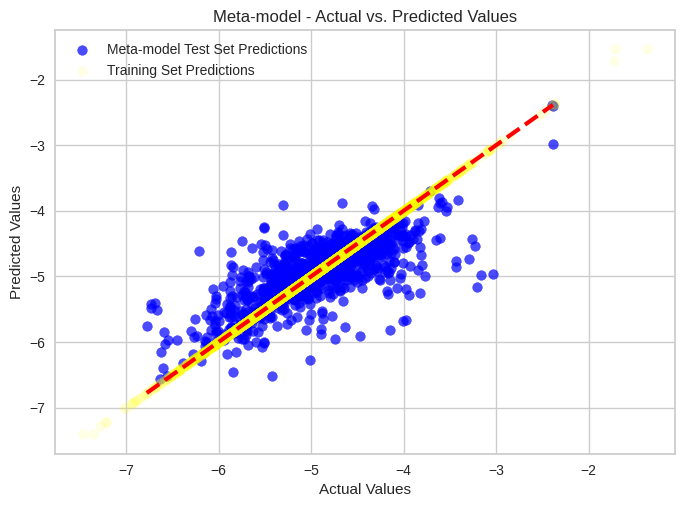


Gradient Boosting Regressor step: 2
Test Size: 0.15
Random State: 2
Mean Squared Error (MSE): 0.10819461101505998
Mean Absolute Error (MAE): 0.2141780324695126
R^2 Score: 0.6087897533128561


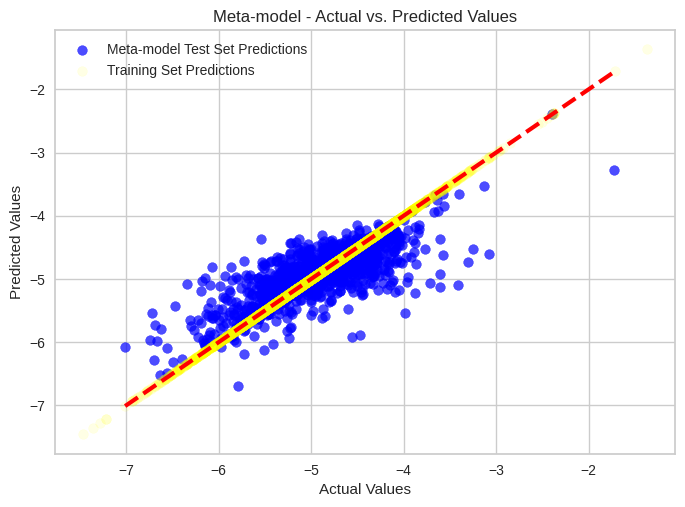


Gradient Boosting Regressor step: 3
Test Size: 0.16999999999999998
Random State: 1
Mean Squared Error (MSE): 0.12076561190383081
Mean Absolute Error (MAE): 0.22205103360368492
R^2 Score: 0.5673517065618918


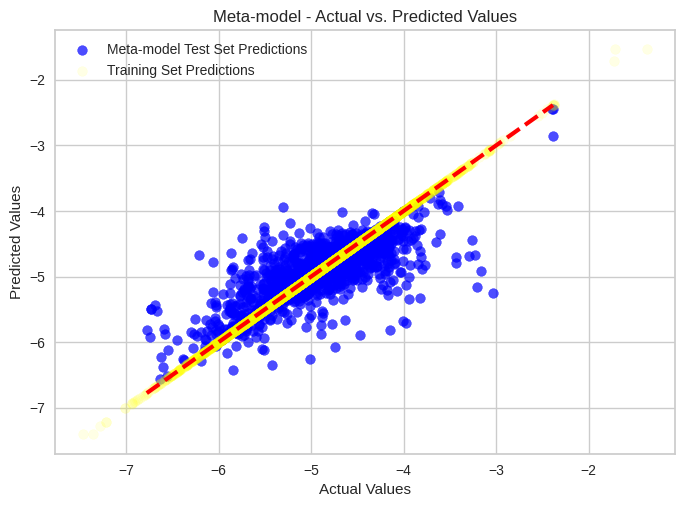


Gradient Boosting Regressor step: 4
Test Size: 0.16999999999999998
Random State: 2
Mean Squared Error (MSE): 0.13168010113971682
Mean Absolute Error (MAE): 0.22357512669303437
R^2 Score: 0.5456490584312292


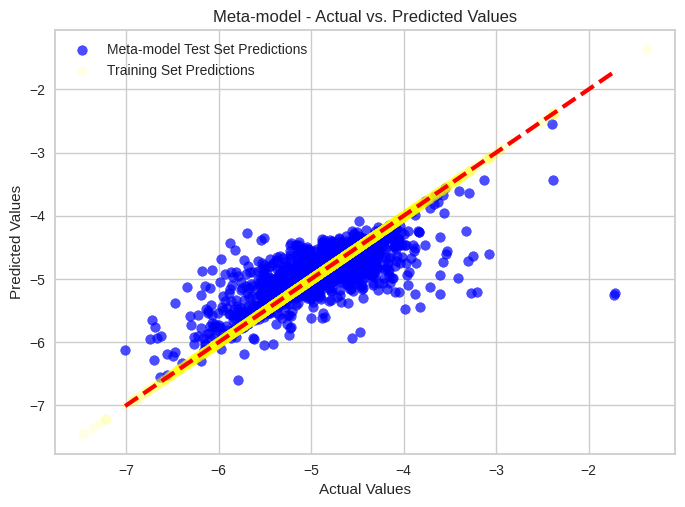


Gradient Boosting Regressor step: 5
Test Size: 0.18999999999999997
Random State: 1
Mean Squared Error (MSE): 0.11782280327501511
Mean Absolute Error (MAE): 0.22153575138570017
R^2 Score: 0.5754616380940175


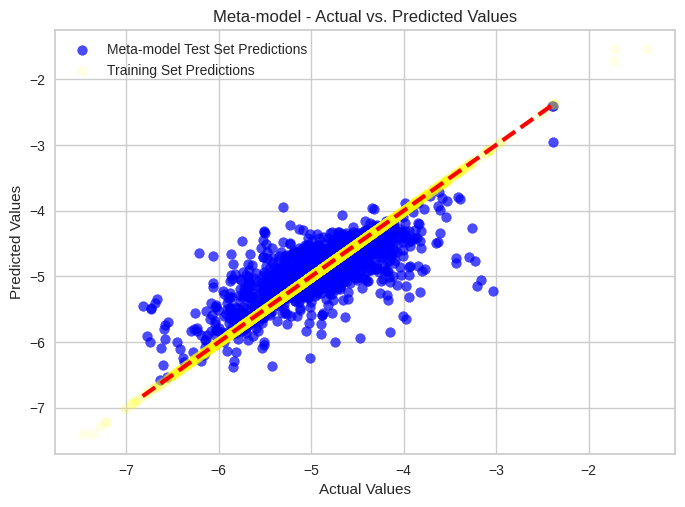


Gradient Boosting Regressor step: 6
Test Size: 0.18999999999999997
Random State: 2
Mean Squared Error (MSE): 0.1362824322163748
Mean Absolute Error (MAE): 0.2307184707790475
R^2 Score: 0.536514298010524


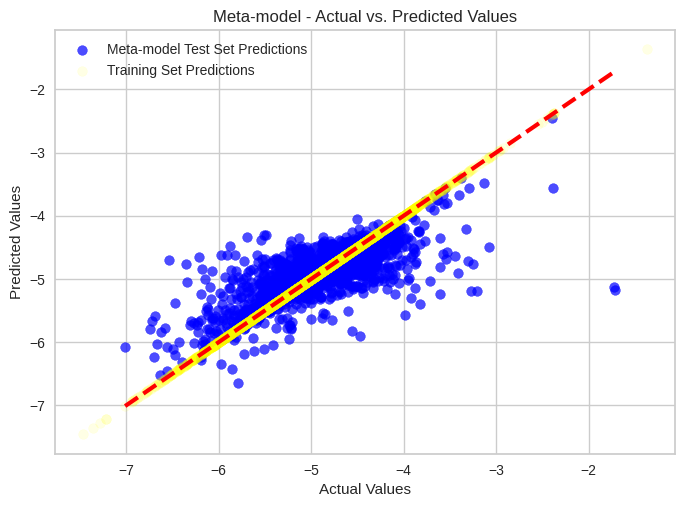


Gradient Boosting Regressor step: 7
Test Size: 0.20999999999999996
Random State: 1
Mean Squared Error (MSE): 0.11828395721375667
Mean Absolute Error (MAE): 0.22242580293135145
R^2 Score: 0.5676323820655603


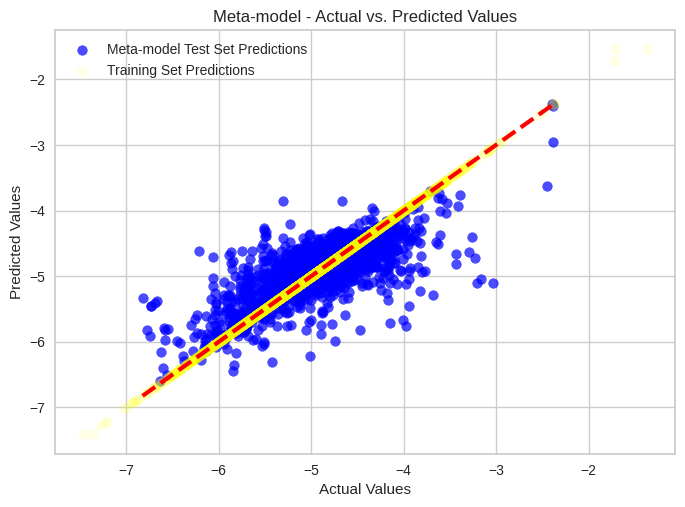


Gradient Boosting Regressor step: 8
Test Size: 0.20999999999999996
Random State: 2
Mean Squared Error (MSE): 0.1361211347776395
Mean Absolute Error (MAE): 0.23087172627968885
R^2 Score: 0.5430133858451622


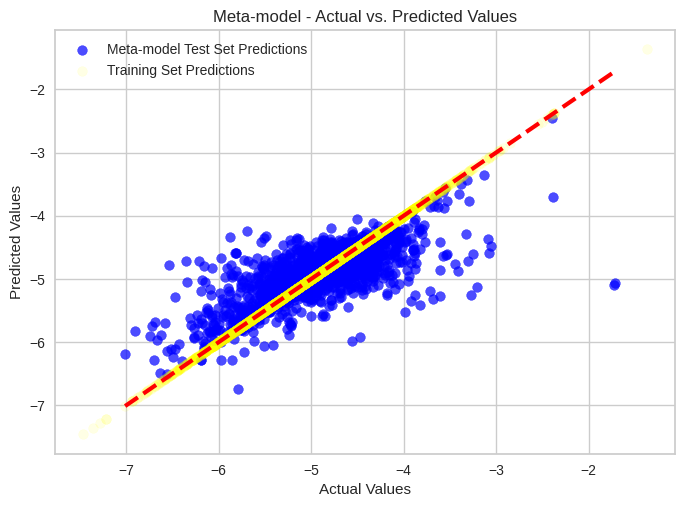


Gradient Boosting Regressor step: 9
Test Size: 0.22999999999999995
Random State: 1
Mean Squared Error (MSE): 0.12333572570111079
Mean Absolute Error (MAE): 0.22618779966326
R^2 Score: 0.5562851858712795


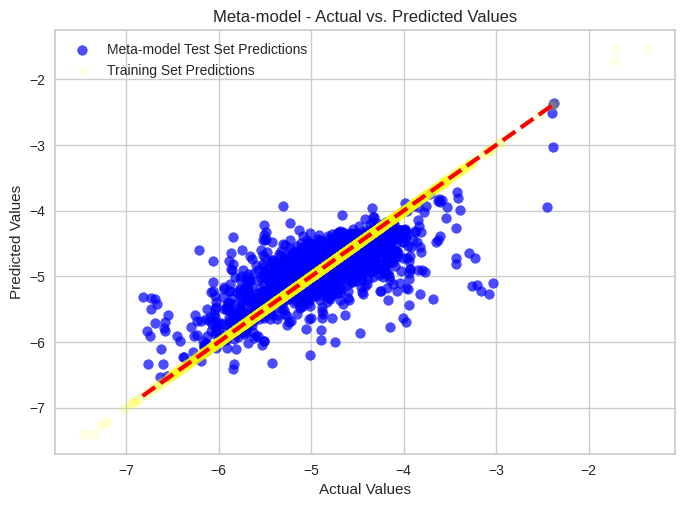


Gradient Boosting Regressor step: 10
Test Size: 0.22999999999999995
Random State: 2
Mean Squared Error (MSE): 0.13446607687989473
Mean Absolute Error (MAE): 0.23065646047318672
R^2 Score: 0.548149298330221


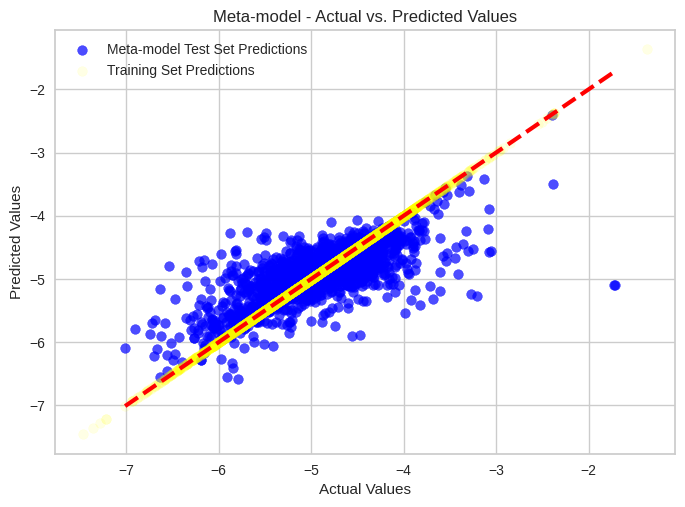


Gradient Boosting Regressor step: 11
Test Size: 0.24999999999999994
Random State: 1
Mean Squared Error (MSE): 0.1244611792805545
Mean Absolute Error (MAE): 0.22812694807423053
R^2 Score: 0.5565194657239912


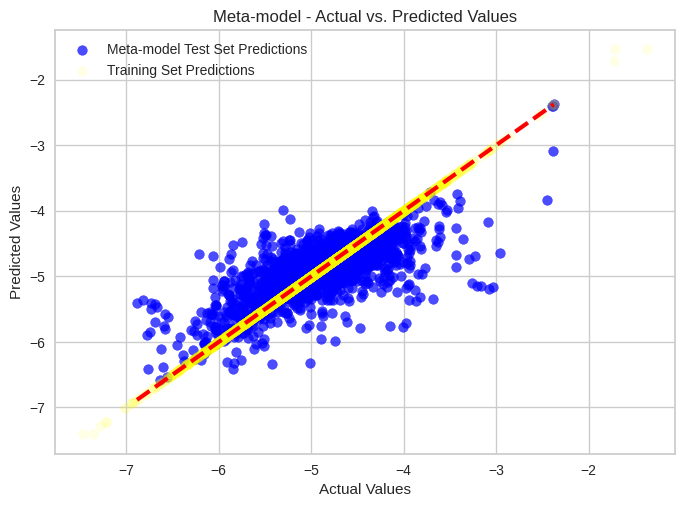


Gradient Boosting Regressor step: 12
Test Size: 0.24999999999999994
Random State: 2
Mean Squared Error (MSE): 0.1420908818404155
Mean Absolute Error (MAE): 0.23335923119129853
R^2 Score: 0.5360094747046911


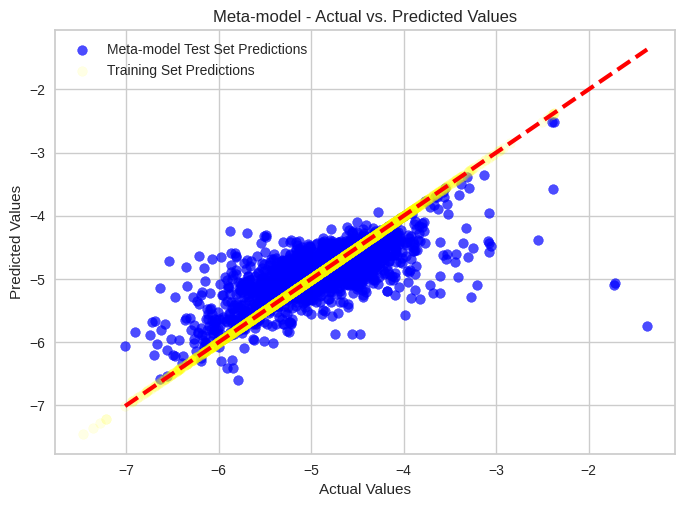


Gradient Boosting Regressor step: 13
Test Size: 0.2699999999999999
Random State: 1
Mean Squared Error (MSE): 0.1248421507231111
Mean Absolute Error (MAE): 0.22917019454454923
R^2 Score: 0.5578495662890548


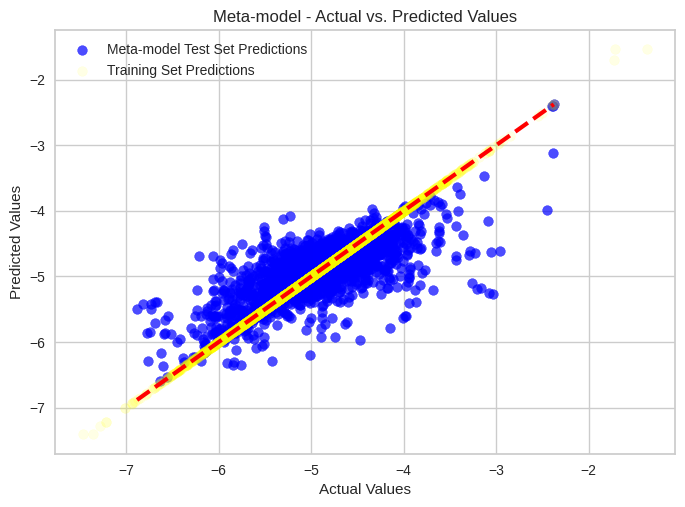


Gradient Boosting Regressor step: 14
Test Size: 0.2699999999999999
Random State: 2
Mean Squared Error (MSE): 0.1399525747130611
Mean Absolute Error (MAE): 0.23237738818481954
R^2 Score: 0.5393306977026975


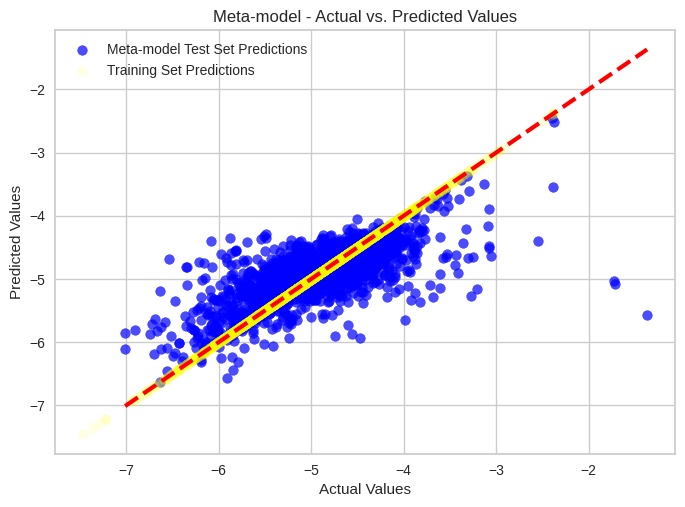


Gradient Boosting Regressor step: 15
Test Size: 0.2899999999999999
Random State: 1
Mean Squared Error (MSE): 0.1254760493726635
Mean Absolute Error (MAE): 0.22936914940803246
R^2 Score: 0.5601924770547708


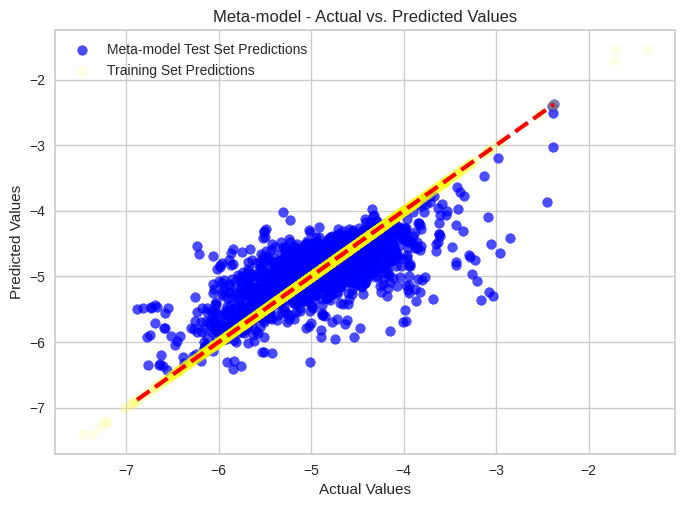


Gradient Boosting Regressor step: 16
Test Size: 0.2899999999999999
Random State: 2
Mean Squared Error (MSE): 0.13843092816246658
Mean Absolute Error (MAE): 0.2324847906216523
R^2 Score: 0.5451323792258793


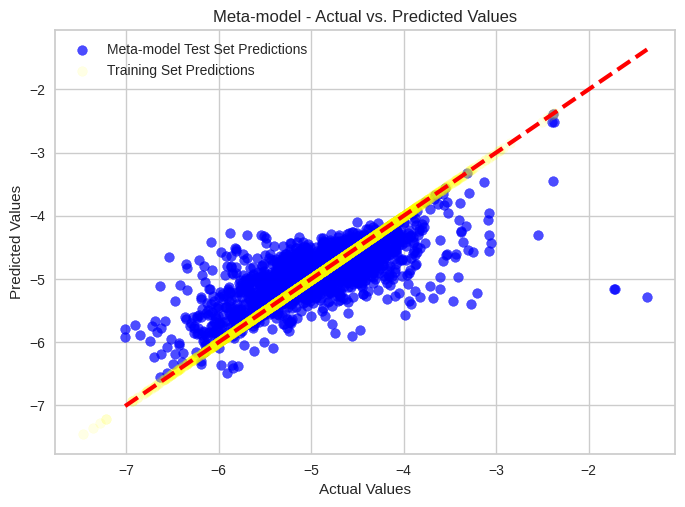

Best Parameters based on R^2 Score: {'learning_rate': 0.08260517794217197, 'max_depth': 6, 'min_samples_leaf': 1, 'min_samples_split': 6, 'n_estimators': 102, 'subsample': 0.9322933125783354}
[0.15, 2, 0.10819461101505998, 0.2141780324695126, 0.6087897533128561]


In [84]:
opted_MetaModel= MetaModelScore(X,y)

In [85]:
print(opted_MetaModel)

[0.15, 2, 0.10819461101505998, 0.2141780324695126, 0.6087897533128561]


In [86]:
del opted_MetaModel

### Visualizing the best try which Outliers are not removed from data

# BEST FOR LOGKH_CH4 so far


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.10727683935128648
Mean Absolute Error (MAE): 0.21451443172739085
R^2 Score: 0.612108233555253
Cross-Validation Mean MSE: 0.12789072642212895
Cross-Validation Std MSE: 0.01323712058568122


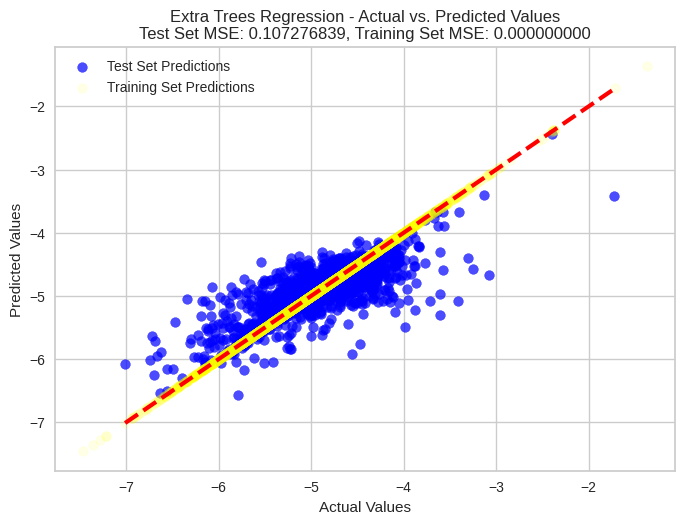

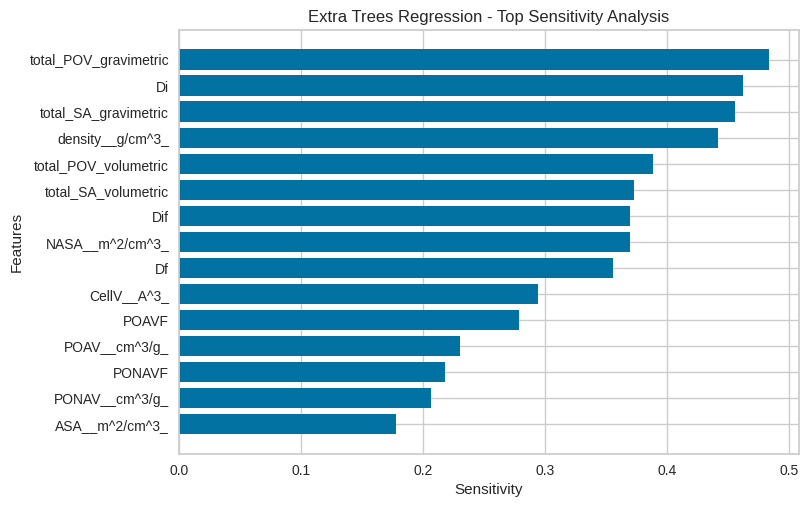

[0.15, 0.5485994353060489, 2, 0.6087209161388429]


In [87]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4.drop('logKH_CH4', axis=1)
y=df_logKH_CH4['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error')
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

print(opted_Rscore)

del opted_Rscore

# BEST FOR CH4DC


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 274.99399220791116
Mean Absolute Error (MAE): 11.394821591825533
R^2 Score: 0.9099346888348325
Cross-Validation Mean MSE: 308.5507507159872
Cross-Validation Std MSE: 10.02718945058809


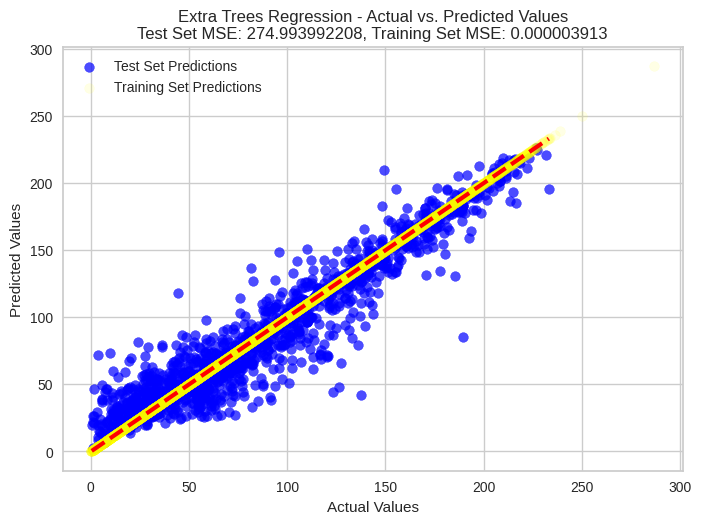

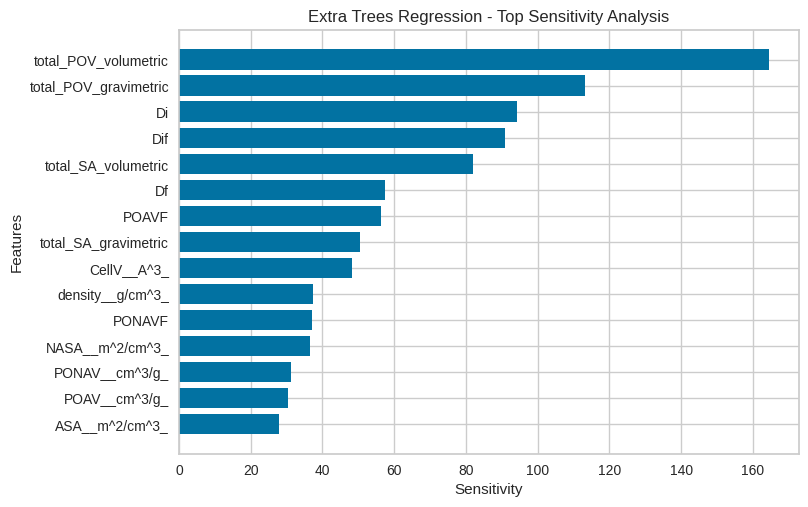

[0.15, 0.9001016962104442, 6, 0.9102168185489631]


In [100]:
clean_feature_names = df_CH4DC.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_CH4DC.columns = clean_feature_names

X=df_CH4DC.drop('CH4DC', axis=1)
y=df_CH4DC['CH4DC']

feature_names = X.columns

scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
   
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error')
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

print(opted_Rscore)

del opted_Rscore

# CH4DC-Outlier

### Remove outlier and Visualize

In [23]:
def remove_outliers_zscore(df, column, threshold=3):
    z_scores = (df[column] - df[column].mean()) / df[column].std()
    mask = np.abs(z_scores) <= threshold
    return df[mask]


def remove_outliers_iqr(df, column,lowerb=1.5,upperb=1.5):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - lowerb * iqr
    upper_bound = q3 + upperb * iqr
    mask = (df[column] >= lower_bound) & (df[column] <= upper_bound)
    return df[mask]


def remove_outliers_mad(df, column, threshold=3):
    median = df[column].median()
    mad = np.median(np.abs(df[column] - median))
    modified_z_scores = 0.6745 * (df[column] - median) / mad
    mask = np.abs(modified_z_scores) <= threshold
    return df[mask]


def remove_outliers_robust_zscore(df, column, threshold=3):
    median = df[column].median()
    mad = np.median(np.abs(df[column] - median))
    robust_z_scores = 0.6745 * (df[column] - median) / mad
    mask = np.abs(robust_z_scores) <= threshold
    return df[mask]


def remove_outliers_mahalanobis(df, columns, threshold=3):
    mean = df[columns].mean().values
    cov = np.cov(df[columns].values.T)
    inv_cov = np.linalg.inv(cov)
    mahalanobis_distances = np.sqrt(np.sum(np.square(np.dot(df[columns].values - mean, inv_cov)), axis=1))
    mask = mahalanobis_distances <= threshold
    return df[mask]

def boxplot_of_processed_data(df):
#     scaler=StandardScaler()
#     df_scaled=scaler.fit_transform(df)
#     df_scaled=pd.DataFrame(df_scaled, columns=df.columns)
    data=df
#     print('\n After Removing Outliers: \n')
#     print(data[target].describe())

   
    plt.figure()
    data.boxplot()
    plt.xticks(rotation=90)  
    plt.title('Boxplot of Columns')
    plt.xlabel('Columns')
    plt.ylabel('Values')
    plt.tight_layout()
    plt.show()
    
    print('#'*100)
    print('\n')

In [24]:
clean_feature_names_CH4DC = df_CH4DC.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_CH4DC.columns = clean_feature_names_CH4DC

clean_feature_names_logKH_CH4=df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names_logKH_CH4

Mscaler=MinMaxScaler()
CH4DC_scaled=Mscaler.fit_transform(df_CH4DC)
df_CH4DC_scaled=pd.DataFrame(CH4DC_scaled, columns=clean_feature_names_CH4DC)

Sscaler=StandardScaler()
logKH_CH4_scaled=Sscaler.fit_transform(df_logKH_CH4)
df_logKH_CH4_scaled=pd.DataFrame(logKH_CH4_scaled, columns=clean_feature_names_logKH_CH4)


In [25]:
df_logKH_CH4.columns

Index(['ASA__m^2/cm^3_', 'CellV__A^3_', 'Df', 'Di', 'Dif', 'NASA__m^2/cm^3_',
       'POAV__cm^3/g_', 'POAVF', 'PONAV__cm^3/g_', 'PONAVF',
       'density__g/cm^3_', 'total_SA_volumetric', 'total_SA_gravimetric',
       'total_POV_volumetric', 'total_POV_gravimetric', 'logKH_CH4'],
      dtype='object')

In [26]:
df_CH4DC_scaled.columns

Index(['ASA__m^2/cm^3_', 'CellV__A^3_', 'Df', 'Di', 'Dif', 'NASA__m^2/cm^3_',
       'POAV__cm^3/g_', 'POAVF', 'PONAV__cm^3/g_', 'PONAVF',
       'density__g/cm^3_', 'total_SA_volumetric', 'total_SA_gravimetric',
       'total_POV_volumetric', 'total_POV_gravimetric', 'CH4DC'],
      dtype='object')

In [27]:
df_CH4DC_scaled.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,CH4DC
count,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000
mean,0.268619,0.013798,0.068830,0.097475,0.096233,0.088011,0.021739,0.299830,0.054058,0.111179,0.281204,0.311584,0.127336,0.373717,0.025196,0.303466
std,0.244996,0.026254,0.037242,0.049518,0.048731,0.163530,0.031517,0.264829,0.095512,0.176130,0.107254,0.211557,0.130313,0.205036,0.029865,0.194356
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.003689,0.047308,0.067987,0.067174,0.000000,0.000000,0.000000,0.000000,0.000000,0.213896,0.127733,0.031725,0.213202,0.008578,0.144704
50%,0.263196,0.006917,0.058777,0.082175,0.081383,0.000000,0.014221,0.311573,0.000000,0.000000,0.267053,0.289876,0.085454,0.352507,0.017219,0.264210
75%,0.467038,0.014227,0.079942,0.110731,0.108915,0.115978,0.031323,0.514182,0.084265,0.204071,0.336359,0.473430,0.176025,0.522153,0.032175,0.440250
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [28]:
df_logKH_CH4.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4
count,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000,9525.000000
mean,878.943955,6302.704997,4.921482,6.983220,6.894232,141.323273,0.328231,0.288154,0.052199,0.071010,1.302904,1020.267228,1075.621000,0.359164,0.380430,-4.930494
std,801.647701,11514.688982,2.662890,3.547494,3.491155,262.588512,0.475868,0.254516,0.092227,0.112494,0.472665,692.008243,1100.216833,0.197052,0.450924,0.540055
min,0.000000,250.921000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.063653,1.070200,0.538008,0.000000,0.000000,-7.463039
25%,0.000000,1868.950000,3.382630,4.870670,4.812410,0.000000,0.000000,0.000000,0.000000,0.000000,1.006280,418.888000,268.390254,0.204900,0.129519,-5.232647
50%,861.200000,3284.850000,4.202680,5.887100,5.830350,0.000000,0.214724,0.299440,0.000000,0.000000,1.240540,949.259000,722.015876,0.338780,0.259982,-4.907855
75%,1528.190000,6490.790000,5.715990,7.932900,7.802830,186.231000,0.472933,0.494160,0.081367,0.130340,1.545970,1549.670000,1486.698409,0.501820,0.485804,-4.606244
max,3272.090000,438839.000000,71.501970,71.641190,71.641190,1605.750000,15.098600,0.961060,0.965610,0.638700,4.470600,3272.090000,8443.446688,0.961060,15.098600,-1.367461


Z-Score or Standard Deviation Method
count    9524.000000
mean        0.303392
std         0.194235
min         0.000000
25%         0.144699
50%         0.264197
75%         0.440231
max         0.871531
Name: CH4DC, dtype: float64


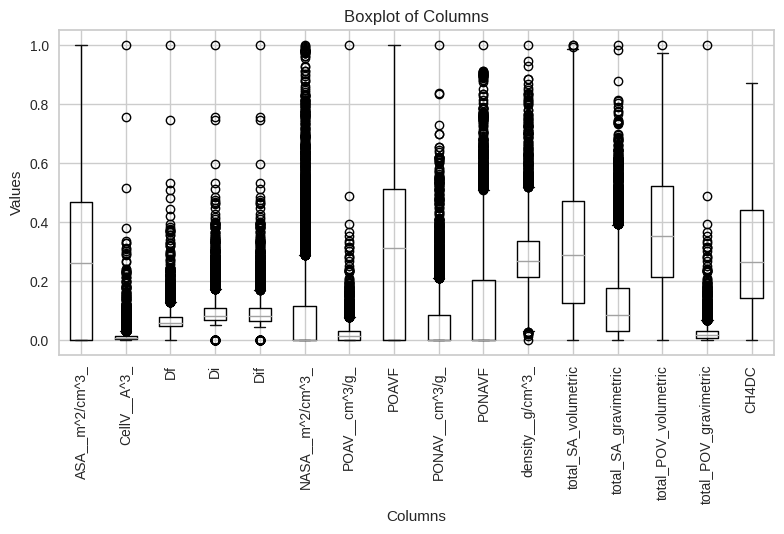

####################################################################################################


IQR (Interquartile Range) Method
count    9524.000000
mean        0.303392
std         0.194235
min         0.000000
25%         0.144699
50%         0.264197
75%         0.440231
max         0.871531
Name: CH4DC, dtype: float64


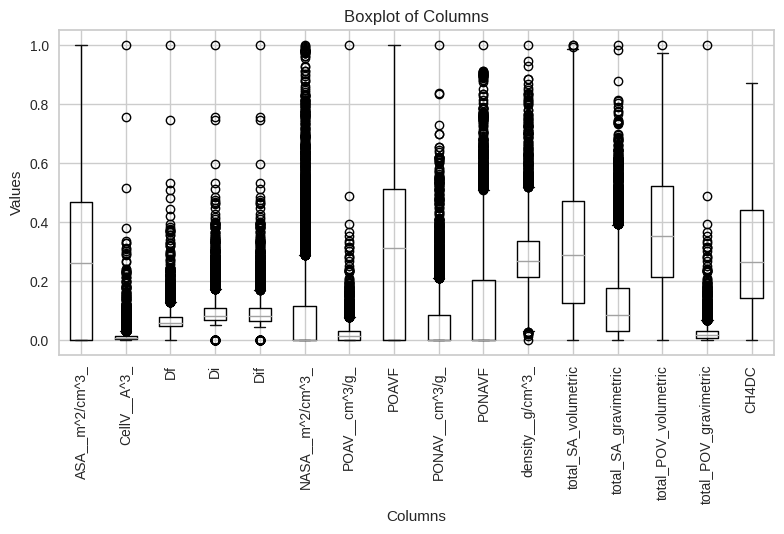

####################################################################################################


Median Absolute Deviation (MAD) Method
count    9112.000000
mean        0.284147
std         0.175543
min         0.000000
25%         0.140454
50%         0.252212
75%         0.414694
max         0.677333
Name: CH4DC, dtype: float64


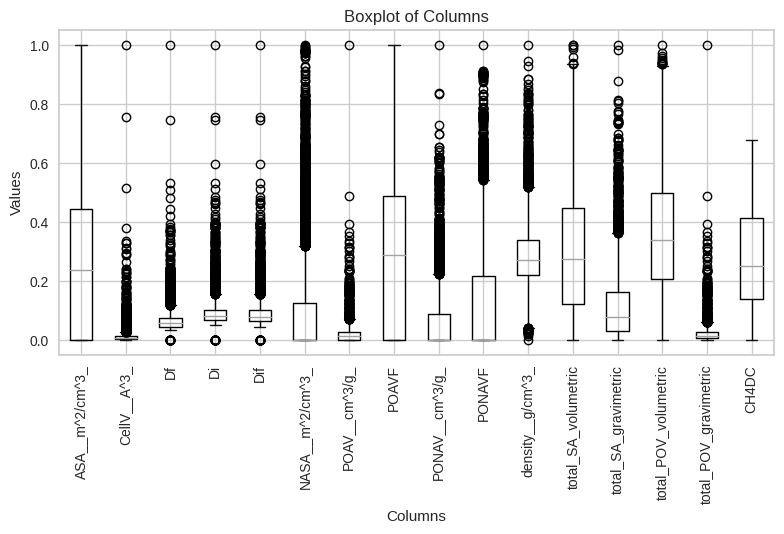

####################################################################################################


Robust Z-Score Method
count    9524.000000
mean        0.303392
std         0.194235
min         0.000000
25%         0.144699
50%         0.264197
75%         0.440231
max         0.871531
Name: CH4DC, dtype: float64


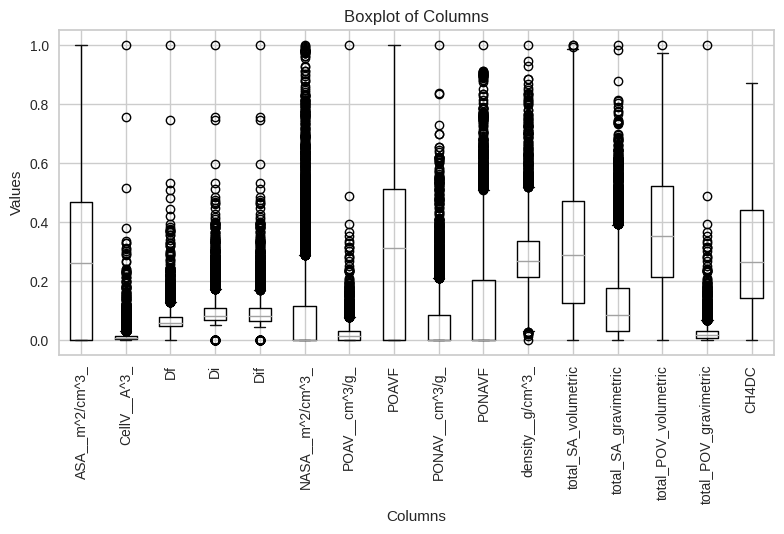

####################################################################################################


Z-Score or Standard Deviation Method
count    9426.000000
mean       -0.000959
std         0.931783
min        -2.979188
25%        -0.554381
50%         0.042526
75%         0.593478
max         2.986597
Name: logKH_CH4, dtype: float64


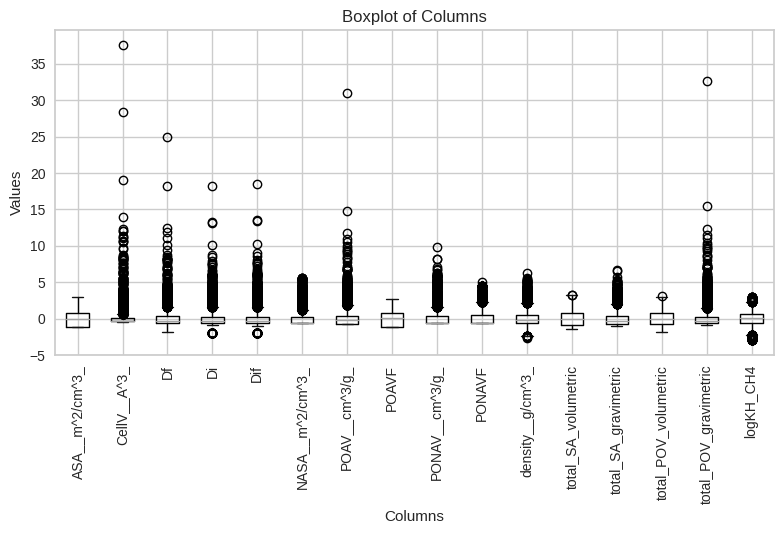

####################################################################################################


IQR (Interquartile Range) Method
count    9235.000000
mean        0.007556
std         0.863465
min        -2.297234
25%        -0.530333
50%         0.046462
75%         0.583853
max         2.339098
Name: logKH_CH4, dtype: float64


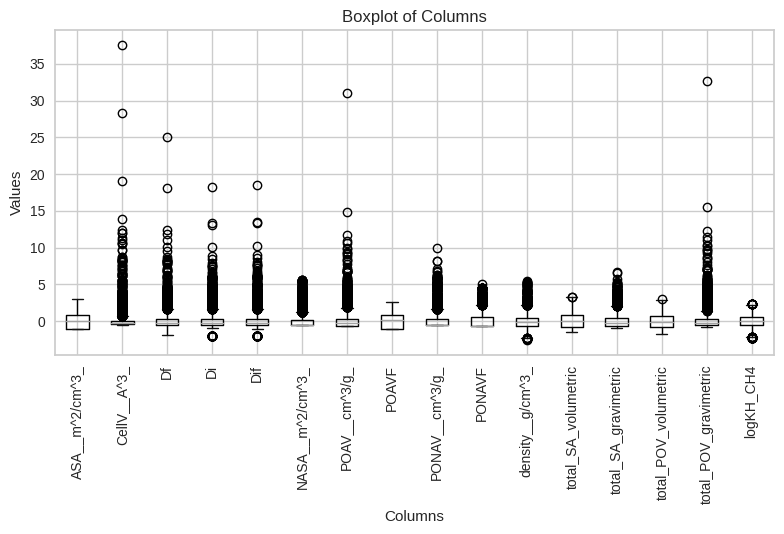

####################################################################################################


Median Absolute Deviation (MAD) Method
count    8701.000000
mean        0.048540
std         0.743911
min        -1.670699
25%        -0.461716
50%         0.068145
75%         0.570505
max         1.754300
Name: logKH_CH4, dtype: float64


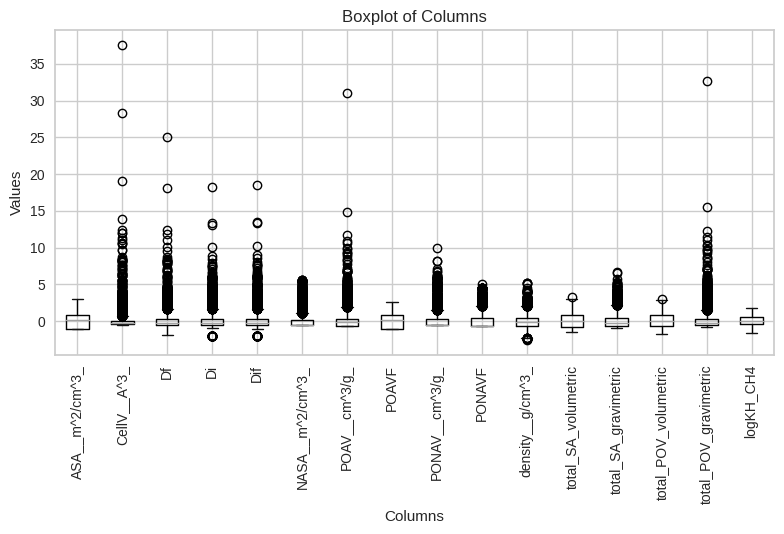

####################################################################################################


Robust Z-Score Method
count    9336.000000
mean        0.006523
std         0.895739
min        -2.527073
25%        -0.538033
50%         0.046113
75%         0.590663
max         2.607002
Name: logKH_CH4, dtype: float64


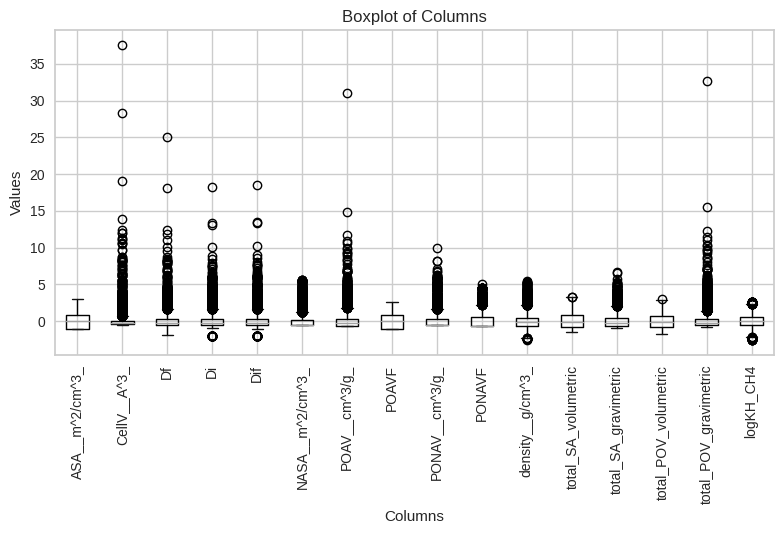

####################################################################################################




In [29]:
dfs=[[df_CH4DC_scaled,'CH4DC'], [df_logKH_CH4_scaled,'logKH_CH4']]
for i in dfs:
    df=i[0]
    target=i[1]
     
     
   
    print('Z-Score or Standard Deviation Method')
    df1 = remove_outliers_zscore(df, column=target, threshold=3)
    print(df1[target].describe())
    boxplot_of_processed_data(df1)
    
    
    
    print('IQR (Interquartile Range) Method')
    df2 = remove_outliers_iqr(df, column=target)
    print(df2[target].describe())
    boxplot_of_processed_data(df2)

    
    
    print('Median Absolute Deviation (MAD) Method')
    df3 = remove_outliers_mad(df, column=target, threshold=2)
    print(df3[target].describe())
    boxplot_of_processed_data(df3)

    
    print('Robust Z-Score Method')
    df4 = remove_outliers_robust_zscore(df, column=target, threshold=3)
    print(df4[target].describe())
    boxplot_of_processed_data(df4)
    
    


## Choosing IQR method for LogKH_CH4 with default lower and upper bound (1.5)

count    9235.000000
mean        0.007556
std         0.863465
min        -2.297234
25%        -0.530333
50%         0.046462
75%         0.583853
max         2.339098
Name: logKH_CH4, dtype: float64


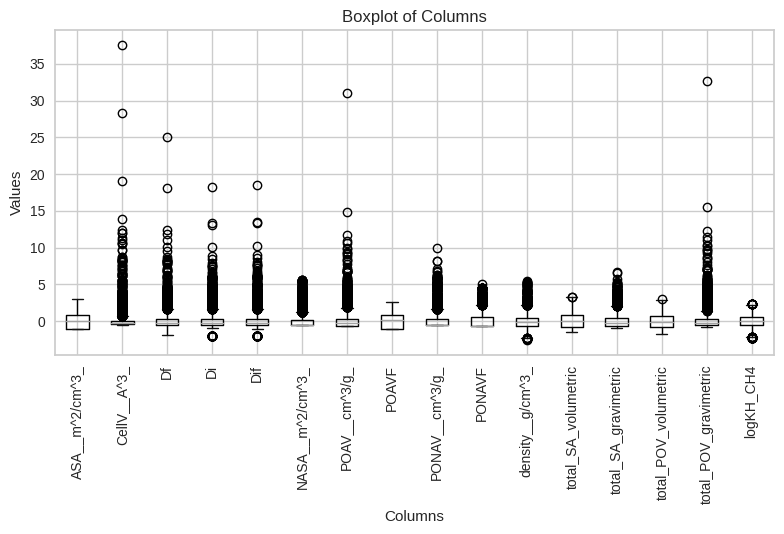

####################################################################################################




In [106]:
df_logKH_CH4_scaled_outlier = remove_outliers_iqr(df_logKH_CH4_scaled, column='logKH_CH4')
print(df_logKH_CH4_scaled_outlier['logKH_CH4'].describe())
boxplot_of_processed_data(df_logKH_CH4_scaled_outlier)

In [107]:
logKH_CH4_outlier=Sscaler.inverse_transform(df_logKH_CH4_scaled_outlier)

In [108]:
df_logKH_CH4_outlier=pd.DataFrame(logKH_CH4_outlier, columns=clean_feature_names_logKH_CH4)

In [109]:
df_logKH_CH4_outlier.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4
count,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000,9235.000000
mean,900.796892,6382.959958,4.968642,7.047342,6.956974,139.994189,0.337448,0.295168,0.051929,0.069971,1.281489,1040.791081,1103.004025,0.365139,0.389377,-4.926414
std,800.490427,11588.113784,2.686576,3.576556,3.519685,262.639781,0.480203,0.254219,0.092731,0.112219,0.449550,688.194709,1105.345744,0.195663,0.454817,0.466294
min,0.000000,274.337000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.063653,1.070200,0.587454,0.000000,0.000000,-6.171061
25%,0.000000,1903.635000,3.424355,4.900030,4.844595,0.000000,0.000000,0.000000,0.000000,0.000000,0.997508,443.684500,285.441421,0.211010,0.135009,-5.216888
50%,905.650000,3328.750000,4.251390,5.935450,5.882900,0.000000,0.226461,0.310320,0.000000,0.000000,1.229770,982.284000,753.788586,0.345960,0.268746,-4.905403
75%,1549.165000,6584.625000,5.775635,8.050775,7.925530,181.089000,0.483633,0.500720,0.080731,0.128150,1.521400,1569.310000,1521.628278,0.506710,0.492022,-4.615198
max,3272.090000,438839.000000,71.501970,71.641190,71.641190,1605.750000,15.098600,0.961060,0.965610,0.638700,3.891830,3272.090000,8443.446688,0.961060,15.098600,-3.667319


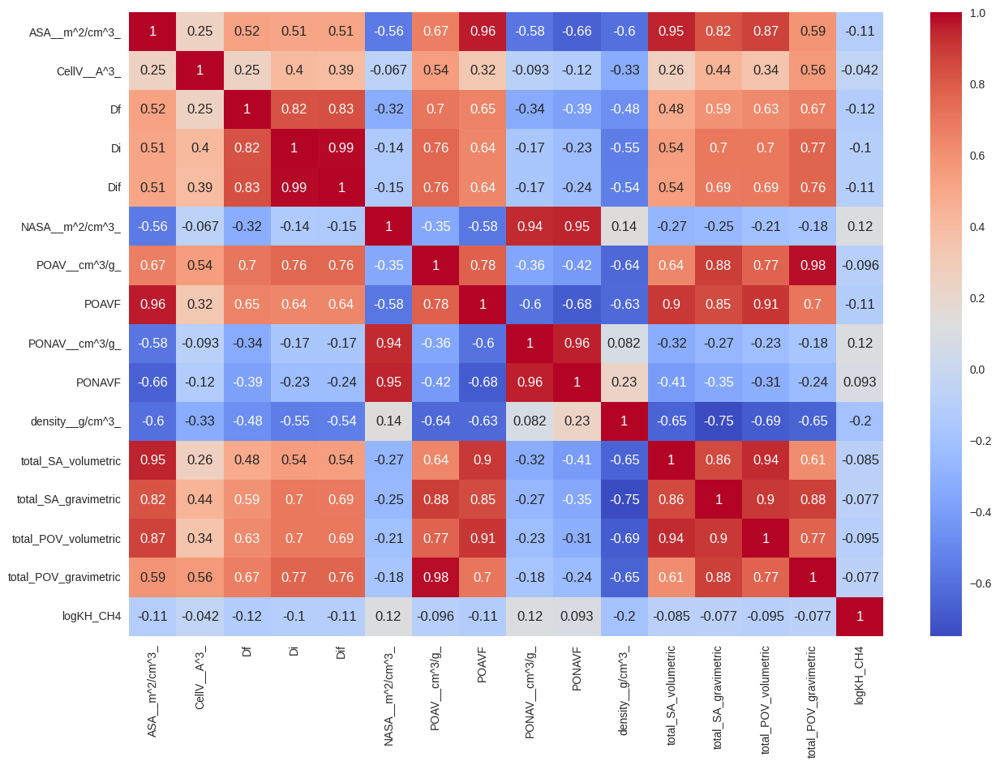

In [110]:
plt.figure(figsize=(15, 10))
sns.heatmap(df_logKH_CH4_outlier.corr(), annot=True, cmap='coolwarm')
plt.show()  

### pycaret test

In [111]:
regression_setup = setup(df_logKH_CH4_outlier, target='logKH_CH4')


best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])

final_model = finalize_model(best_model)

,Description,Value
0,Session id,751
1,Target,logKH_CH4
2,Target type,Regression
3,Original data shape,"(9235, 16)"
4,Transformed data shape,"(9235, 16)"
5,Transformed train set shape,"(6464, 16)"
6,Transformed test set shape,"(2771, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.2179,0.1019,0.3189,0.5334,0.0542,0.0449,0.2873
rf,Random Forest Regressor,0.2265,0.1060,0.3254,0.5148,0.0553,0.0467,1.0140
xgboost,Extreme Gradient Boosting,0.2399,0.1141,0.3376,0.4773,0.0573,0.0493,0.0733
gbr,Gradient Boosting Regressor,0.2672,0.1283,0.3579,0.4134,0.0609,0.0551,0.4620
ada,AdaBoost Regressor,0.3191,0.1681,0.4097,0.2321,0.0693,0.0655,0.0520
knn,K Neighbors Regressor,0.3006,0.1688,0.4105,0.2281,0.0695,0.0617,0.0073
ridge,Ridge Regression,0.3223,0.1774,0.4209,0.1891,0.0711,0.0661,0.0060
br,Bayesian Ridge,0.3223,0.1774,0.4209,0.1890,0.0711,0.0661,0.0053
lr,Linear Regression,0.3224,0.1774,0.4209,0.1891,0.0711,0.0661,0.1320
dt,Decision Tree Regressor,0.3004,0.2070,0.4546,0.0505,0.0774,0.0618,0.0200


pycaret test is less than before which shows that if R2 score increases by the same model, we may have overfitting


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.08815582017235989
Mean Absolute Error (MAE): 0.20086281663413721
R^2 Score: 0.5684426994157388
Cross-Validation Mean MSE: 0.09964123980335145
Cross-Validation Std MSE: 0.001962524389669573


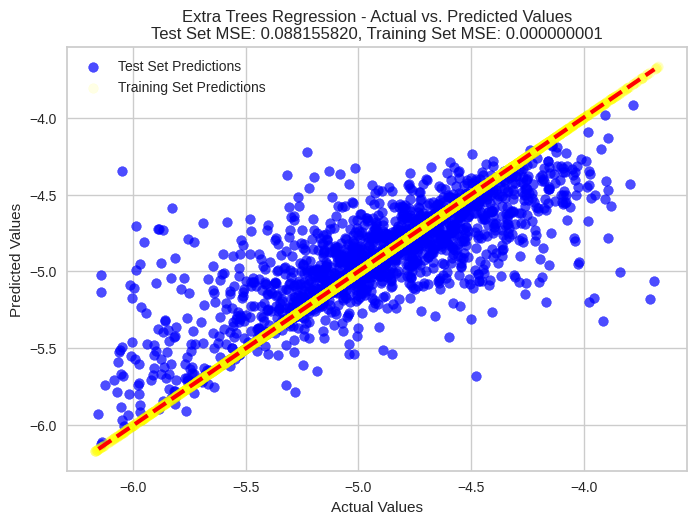

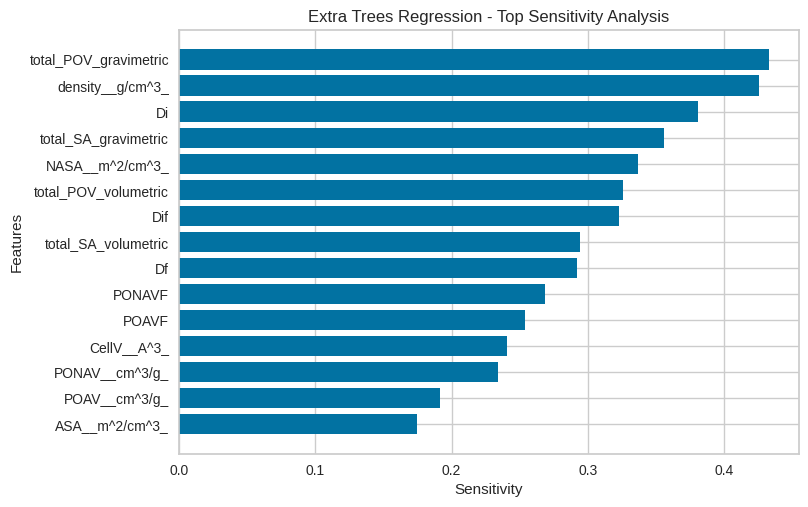

[0.18, 0.5376208849387352, 5, 0.5685010126945633]


In [112]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4_outlier.drop('logKH_CH4', axis=1)
y=df_logKH_CH4_outlier['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(n_jobs=-1),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

print(opted_Rscore)

del opted_Rscore

## Choosing MAD method (threshold=2) for LogKH_CH4

count    8701.000000
mean        0.048540
std         0.743911
min        -1.670699
25%        -0.461716
50%         0.068145
75%         0.570505
max         1.754300
Name: logKH_CH4, dtype: float64


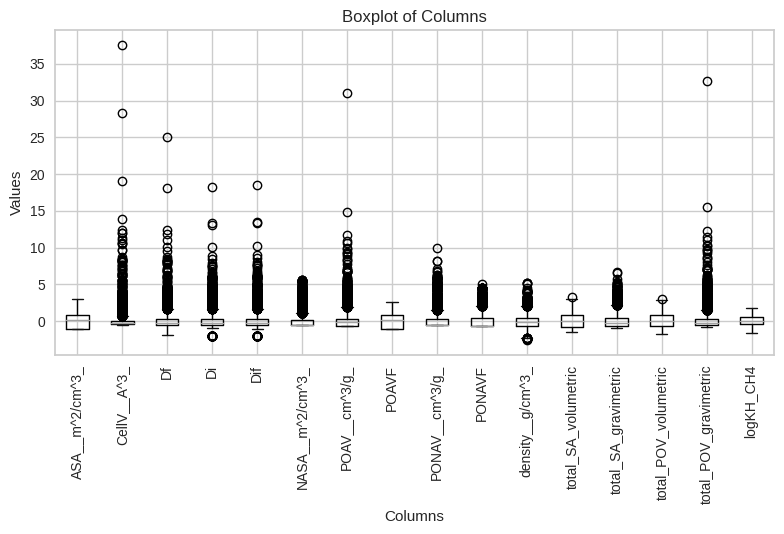

####################################################################################################




In [27]:
df_logKH_CH4_scaled_outlier = remove_outliers_mad(df_logKH_CH4_scaled, column='logKH_CH4',threshold=2)
print(df_logKH_CH4_scaled_outlier['logKH_CH4'].describe())
boxplot_of_processed_data(df_logKH_CH4_scaled_outlier)

In [28]:
logKH_CH4_outlier=Sscaler.inverse_transform(df_logKH_CH4_scaled_outlier)

In [29]:
df_logKH_CH4_outlier=pd.DataFrame(logKH_CH4_outlier, columns=clean_feature_names_logKH_CH4)

In [30]:
df_logKH_CH4_outlier.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4
count,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000,8701.000000
mean,927.973191,6514.489725,5.038772,7.142645,7.051120,137.295899,0.351279,0.304333,0.051079,0.067822,1.252824,1065.269090,1142.118873,0.372156,0.402357,-4.904281
std,794.542358,11774.740726,2.720353,3.624600,3.565366,261.911867,0.488367,0.252819,0.093277,0.111637,0.423287,679.517767,1115.096478,0.193764,0.462756,0.401732
min,0.000000,323.843000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.063653,1.070200,0.587454,0.000000,0.000000,-5.832715
25%,0.000000,1949.680000,3.477220,4.954900,4.896910,0.000000,0.000000,0.000000,0.000000,0.000000,0.983709,477.406000,313.879807,0.219180,0.141646,-5.179833
50%,949.876000,3424.660000,4.313740,6.013210,5.965700,0.000000,0.244824,0.326960,0.000000,0.000000,1.213570,1019.550000,802.010260,0.356020,0.281759,-4.893693
75%,1569.360000,6764.380000,5.843460,8.148690,8.051260,170.031000,0.492005,0.505800,0.078139,0.121380,1.492600,1584.396550,1568.147627,0.512620,0.499588,-4.622406
max,3270.130000,438839.000000,71.501970,71.641190,71.641190,1605.750000,15.098600,0.961060,0.965610,0.638700,3.742910,3270.130000,8443.446688,0.961060,15.098600,-3.983125


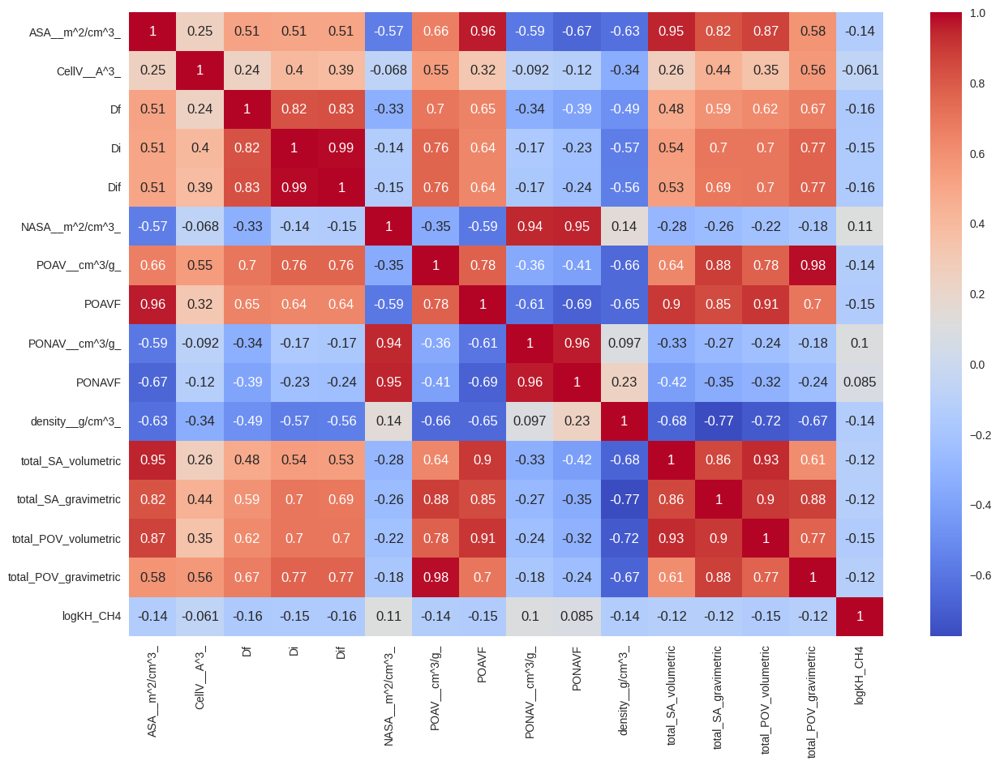

In [31]:
plt.figure(figsize=(15, 10))
sns.heatmap(df_logKH_CH4_outlier.corr(), annot=True, cmap='coolwarm')
plt.show()  

### pycaret test

In [32]:
regression_setup = setup(df_logKH_CH4_outlier, target='logKH_CH4')


best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])

final_model = finalize_model(best_model)

,Description,Value
0,Session id,3966
1,Target,logKH_CH4
2,Target type,Regression
3,Original data shape,"(8701, 16)"
4,Transformed data shape,"(8701, 16)"
5,Transformed train set shape,"(6090, 16)"
6,Transformed test set shape,"(2611, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.1972,0.0796,0.2820,0.5040,0.0481,0.0407,0.2153
rf,Random Forest Regressor,0.2046,0.0823,0.2867,0.4871,0.0489,0.0423,0.7353
xgboost,Extreme Gradient Boosting,0.2165,0.0889,0.2980,0.4460,0.0507,0.0446,0.0613
gbr,Gradient Boosting Regressor,0.2377,0.0965,0.3105,0.3985,0.0529,0.0490,0.3453
ada,AdaBoost Regressor,0.2745,0.1207,0.3474,0.2478,0.0590,0.0565,0.0487
knn,K Neighbors Regressor,0.2641,0.1271,0.3563,0.2071,0.0606,0.0544,0.0067
ridge,Ridge Regression,0.2836,0.1302,0.3607,0.1893,0.0611,0.0582,0.0060
br,Bayesian Ridge,0.2836,0.1302,0.3607,0.1893,0.0611,0.0582,0.0047
lr,Linear Regression,0.2836,0.1302,0.3607,0.1892,0.0611,0.0582,0.3540
dt,Decision Tree Regressor,0.2723,0.1572,0.3961,0.0184,0.0676,0.0560,0.0173


pycaret test is less than before which shows that if R2 score increases by the same model, we may have overfitting


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.06830942265308983
Mean Absolute Error (MAE): 0.18142879503806184
R^2 Score: 0.5735306750695357
Cross-Validation Mean MSE: 0.07479265435819035
Cross-Validation Std MSE: 0.003631372652202078


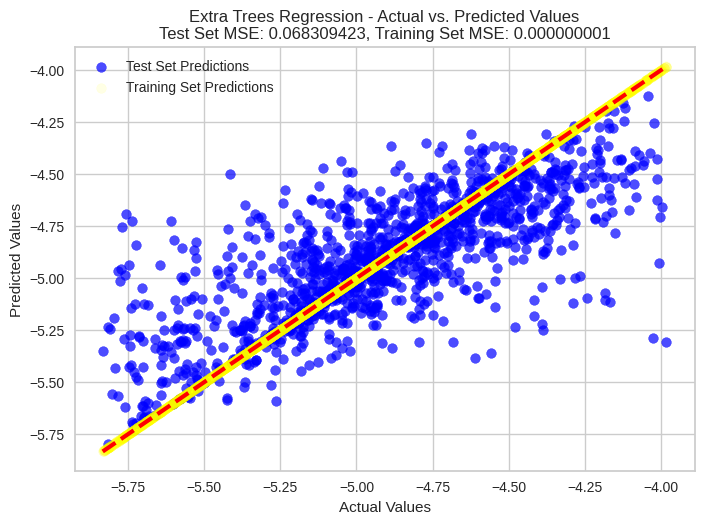

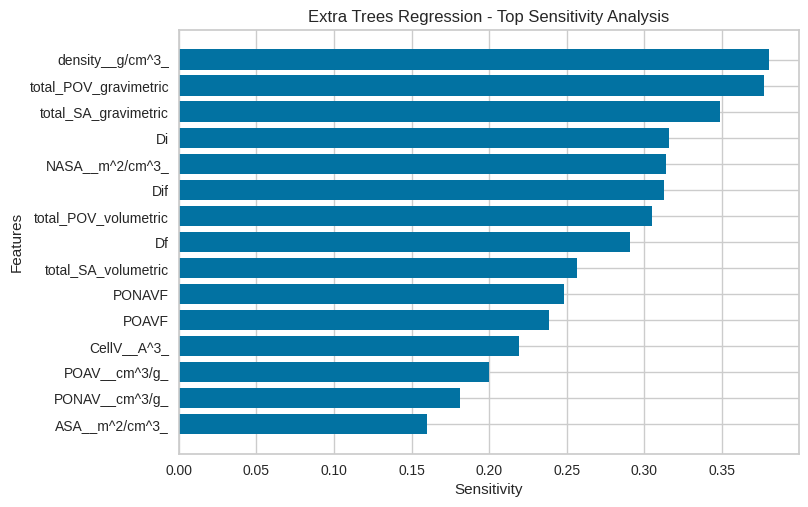

[0.15, 0.5263147439614857, 6, 0.5733825914544874]


In [33]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4_outlier.drop('logKH_CH4', axis=1)
y=df_logKH_CH4_outlier['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(n_jobs=-1),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

print(opted_Rscore)

del opted_Rscore

## Choosing MAD method (threshold=1) for LogKH_CH4

count    6363.000000
mean        0.050997
std         0.453201
min        -0.814946
25%        -0.321521
50%         0.063067
75%         0.413570
max         0.898645
Name: logKH_CH4, dtype: float64


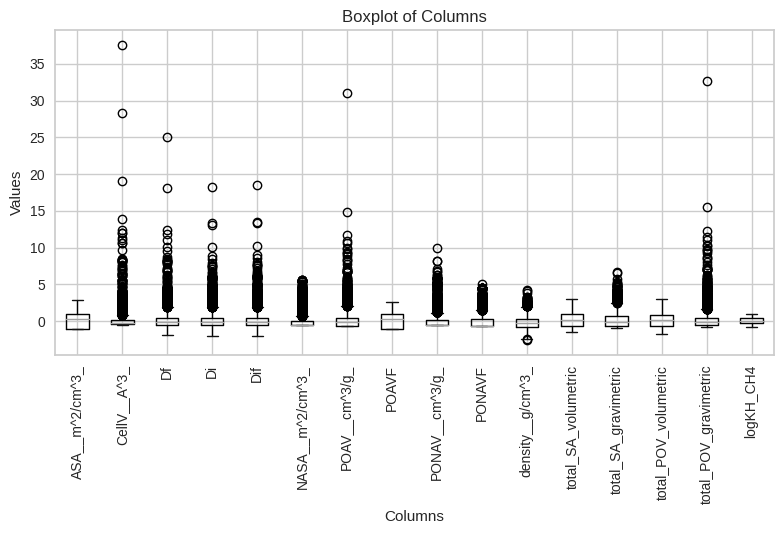

####################################################################################################




In [36]:
df_logKH_CH4_scaled_outlier = remove_outliers_mad(df_logKH_CH4_scaled, column='logKH_CH4',threshold=1)
print(df_logKH_CH4_scaled_outlier['logKH_CH4'].describe())
boxplot_of_processed_data(df_logKH_CH4_scaled_outlier)

In [37]:
logKH_CH4_outlier=Sscaler.inverse_transform(df_logKH_CH4_scaled_outlier)

In [38]:
df_logKH_CH4_outlier=pd.DataFrame(logKH_CH4_outlier, columns=clean_feature_names_logKH_CH4)

In [39]:
df_logKH_CH4_outlier.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4
count,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000,6363.000000
mean,1015.814226,7140.781124,5.271881,7.485569,7.383475,127.474167,0.397573,0.332035,0.045995,0.061072,1.209000,1143.288393,1269.410834,0.393106,0.443568,-4.902954
std,786.783176,12950.759776,2.902201,3.854860,3.785854,258.965064,0.528426,0.250867,0.090719,0.108386,0.409160,668.076497,1168.345930,0.191824,0.504152,0.244741
min,0.000000,327.796000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.063653,1.070200,0.673626,0.000000,0.000000,-5.370586
25%,0.000000,2040.775000,3.615095,5.103505,5.049795,0.000000,0.000000,0.000000,0.000000,0.000000,0.935626,562.250000,377.445143,0.240290,0.158627,-5.104124
50%,1115.570000,3664.620000,4.572100,6.398590,6.315450,0.000000,0.297606,0.374700,0.000000,0.000000,1.181300,1157.290000,955.009973,0.390620,0.320135,-4.896436
75%,1633.380000,7687.580000,6.210155,8.611760,8.465260,130.424000,0.526691,0.522350,0.064027,0.096680,1.456355,1645.278500,1764.070638,0.532250,0.538599,-4.707155
max,3144.830000,438839.000000,71.501970,71.641190,71.641190,1605.750000,15.098600,0.961060,0.965610,0.638700,3.314520,3144.830000,8443.446688,0.961060,15.098600,-4.445202


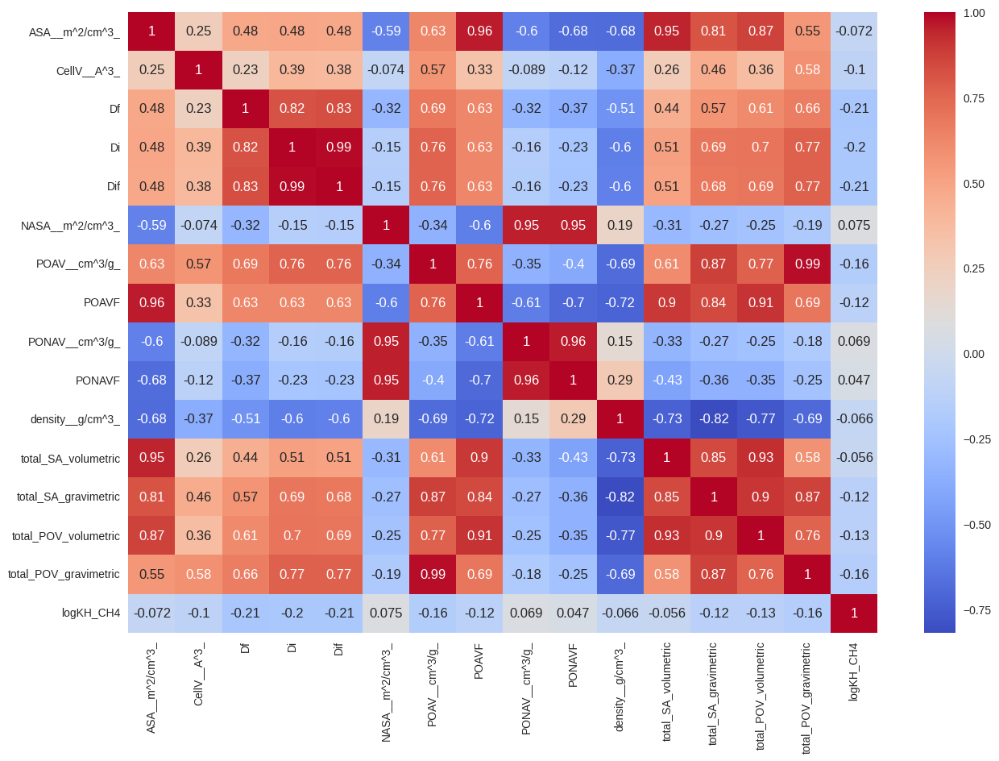

In [40]:
plt.figure(figsize=(15, 10))
sns.heatmap(df_logKH_CH4_outlier.corr(), annot=True, cmap='coolwarm')
plt.show()  

### pycaret test

In [41]:
regression_setup = setup(df_logKH_CH4_outlier, target='logKH_CH4')


best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])

final_model = finalize_model(best_model)

,Description,Value
0,Session id,8971
1,Target,logKH_CH4
2,Target type,Regression
3,Original data shape,"(6363, 16)"
4,Transformed data shape,"(6363, 16)"
5,Transformed train set shape,"(4454, 16)"
6,Transformed test set shape,"(1909, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.1330,0.0331,0.1818,0.4493,0.0309,0.0273,0.1567
rf,Random Forest Regressor,0.1380,0.0342,0.1848,0.4314,0.0314,0.0283,0.4740
xgboost,Extreme Gradient Boosting,0.1456,0.0377,0.1940,0.3732,0.0329,0.0298,0.0540
gbr,Gradient Boosting Regressor,0.1608,0.0407,0.2016,0.3235,0.0342,0.0329,0.2460
ada,AdaBoost Regressor,0.1827,0.0481,0.2193,0.2010,0.0372,0.0373,0.0420
knn,K Neighbors Regressor,0.1712,0.0506,0.2249,0.1576,0.0382,0.0350,0.0060
br,Bayesian Ridge,0.1879,0.0513,0.2262,0.1500,0.0383,0.0384,0.0047
lar,Least Angle Regression,0.1878,0.0513,0.2262,0.1500,0.0383,0.0384,0.0047
lr,Linear Regression,0.1878,0.0513,0.2262,0.1500,0.0383,0.0384,0.0047
ridge,Ridge Regression,0.1878,0.0512,0.2262,0.1501,0.0383,0.0384,0.0047



Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.03151733737042099
Mean Absolute Error (MAE): 0.12802547887954763
R^2 Score: 0.4826126988103765
Cross-Validation Mean MSE: 0.03179365804656422
Cross-Validation Std MSE: 0.0007937454710676825


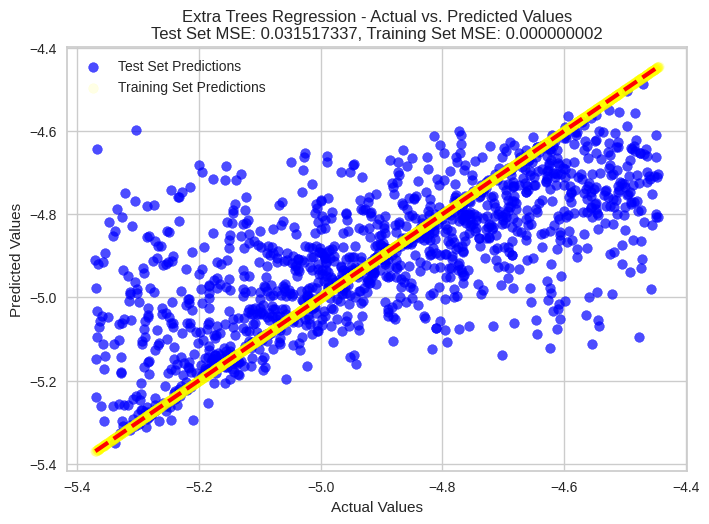

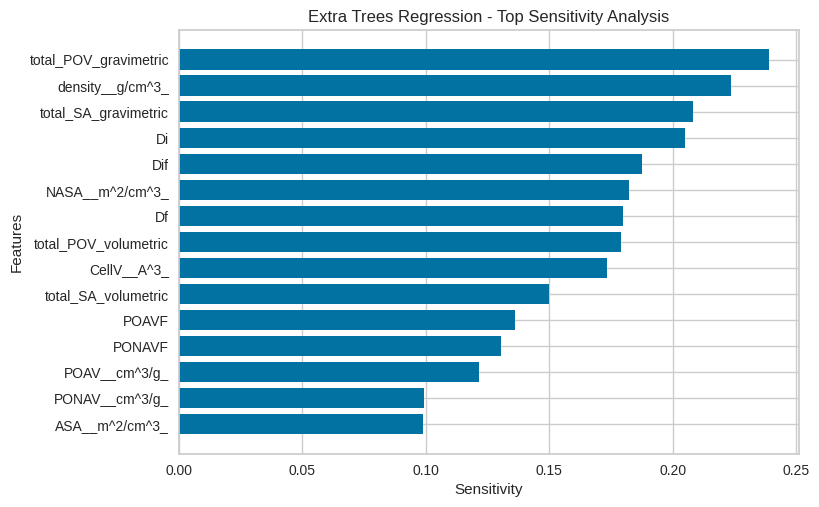

In [45]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4_outlier.drop('logKH_CH4', axis=1)
y=df_logKH_CH4_outlier['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

# opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

models = {
    "Extra Trees Regression": ExtraTreesRegressor(n_jobs=-1),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

# print(opted_Rscore)

# del opted_Rscore

## Modifying zscore outlier removing function for Henry's constant

count    6915.000000
mean        0.038665
std         0.507865
min        -0.999559
25%        -0.368745
50%         0.053667
75%         0.440001
max         0.999838
Name: logKH_CH4, dtype: float64


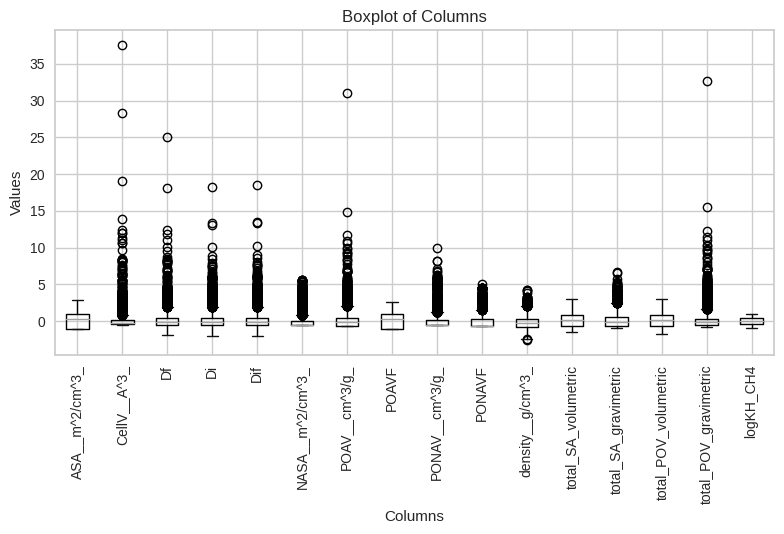

####################################################################################################




In [55]:
df_logKH_CH4_scaled_outlier = remove_outliers_zscore(df_logKH_CH4_scaled, column='logKH_CH4',threshold=1)
print(df_logKH_CH4_scaled_outlier['logKH_CH4'].describe())
boxplot_of_processed_data(df_logKH_CH4_scaled_outlier)

In [56]:
logKH_CH4_outlier=Sscaler.inverse_transform(df_logKH_CH4_scaled_outlier)

In [57]:
df_logKH_CH4_outlier=pd.DataFrame(logKH_CH4_outlier, columns=clean_feature_names_logKH_CH4)

In [58]:
df_logKH_CH4_outlier.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4
count,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000,6915.000000
mean,998.626803,6978.455216,5.250522,7.447535,7.347985,128.874936,0.391050,0.327444,0.046792,0.062232,1.217162,1127.501739,1247.932915,0.389677,0.437842,-4.909614
std,787.732207,12558.676108,2.881217,3.825270,3.758206,260.586161,0.522879,0.252148,0.091564,0.109305,0.412993,670.410352,1162.686601,0.193295,0.498329,0.274260
min,0.000000,327.796000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.063653,1.070200,0.587454,0.000000,0.000000,-5.470282
25%,0.000000,2026.470000,3.590675,5.063195,5.004680,0.000000,0.000000,0.000000,0.000000,0.000000,0.942104,539.355000,360.837038,0.236770,0.153858,-5.129626
50%,1089.840000,3607.950000,4.535260,6.329990,6.260800,0.000000,0.290415,0.365580,0.000000,0.000000,1.189850,1131.790000,923.082541,0.383840,0.311830,-4.901512
75%,1619.270000,7514.835000,6.186200,8.566365,8.435795,136.792000,0.522442,0.520140,0.066094,0.099010,1.466550,1631.620680,1722.703186,0.529220,0.532563,-4.692882
max,3144.830000,438839.000000,71.501970,71.641190,71.641190,1605.750000,15.098600,0.961060,0.965610,0.638700,3.314520,3144.830000,8443.446688,0.961060,15.098600,-4.390555


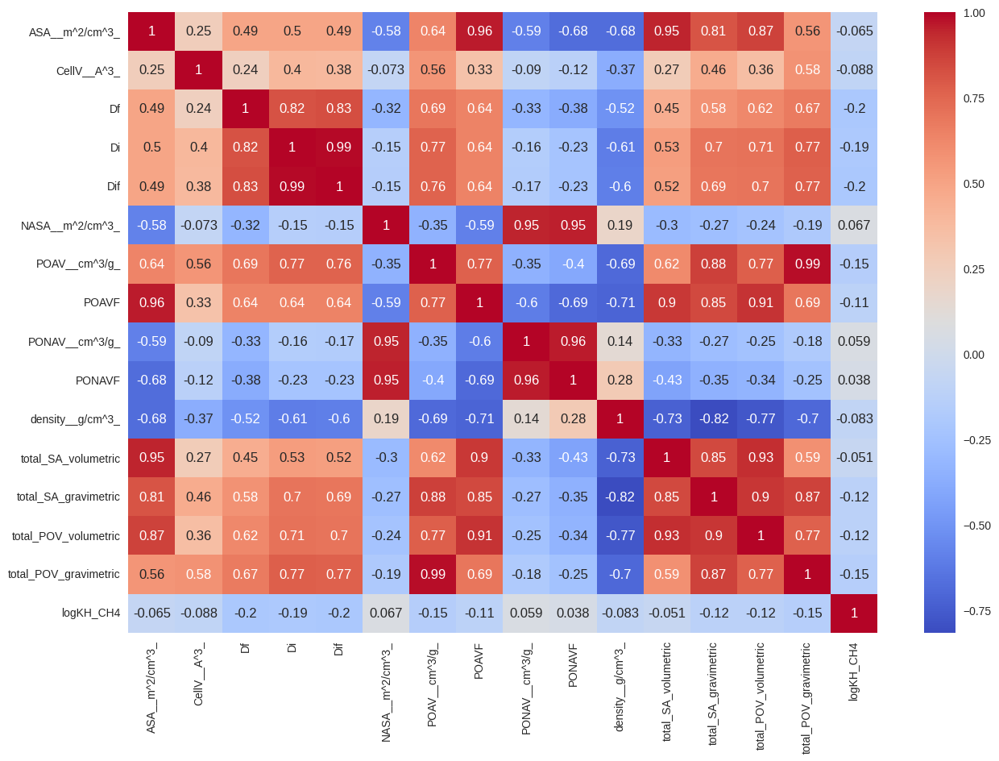

In [59]:
plt.figure(figsize=(15, 10))
sns.heatmap(df_logKH_CH4_outlier.corr(), annot=True, cmap='coolwarm')
plt.show()  

### pycaret test

In [60]:
regression_setup = setup(df_logKH_CH4_outlier, target='logKH_CH4')


best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])

final_model = finalize_model(best_model)

,Description,Value
0,Session id,1508
1,Target,logKH_CH4
2,Target type,Regression
3,Original data shape,"(6915, 16)"
4,Transformed data shape,"(6915, 16)"
5,Transformed train set shape,"(4840, 16)"
6,Transformed test set shape,"(2075, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.1431,0.0397,0.1991,0.4642,0.0338,0.0293,0.1667
rf,Random Forest Regressor,0.1493,0.0413,0.2031,0.4429,0.0344,0.0306,0.5293
xgboost,Extreme Gradient Boosting,0.1569,0.0452,0.2126,0.3890,0.0360,0.0321,0.0540
gbr,Gradient Boosting Regressor,0.1734,0.0480,0.2190,0.3528,0.0371,0.0355,0.2687
ada,AdaBoost Regressor,0.1982,0.0578,0.2404,0.2209,0.0407,0.0405,0.0420
knn,K Neighbors Regressor,0.1858,0.0598,0.2444,0.1932,0.0414,0.0380,0.0060
br,Bayesian Ridge,0.2049,0.0619,0.2486,0.1663,0.0420,0.0418,0.0047
lar,Least Angle Regression,0.2049,0.0619,0.2486,0.1663,0.0420,0.0418,0.0047
lr,Linear Regression,0.2049,0.0619,0.2486,0.1663,0.0420,0.0418,0.0047
ridge,Ridge Regression,0.2049,0.0619,0.2486,0.1664,0.0420,0.0418,0.0040


pycaret test is less than before which shows that if R2 score increases by the same model, we may have overfitting


Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.0375455540630289
Mean Absolute Error (MAE): 0.1391110595362609
R^2 Score: 0.5022389932858285
Cross-Validation Mean MSE: 0.03972488075906343
Cross-Validation Std MSE: 0.0011370186375478399


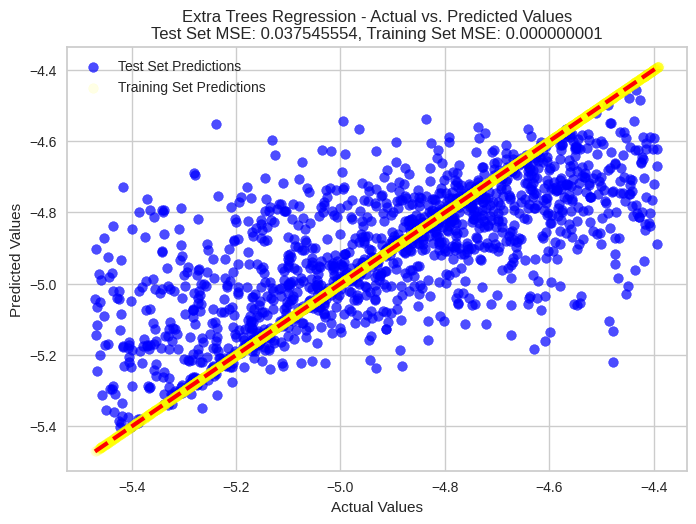

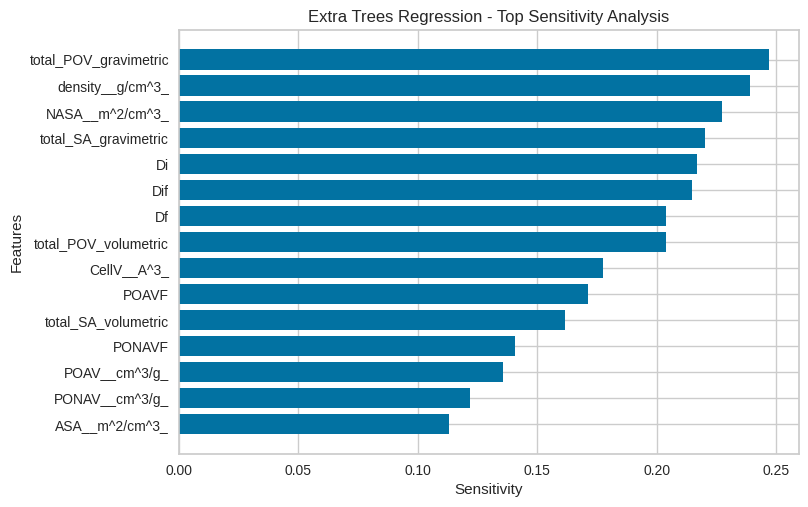

In [61]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4_outlier.drop('logKH_CH4', axis=1)
y=df_logKH_CH4_outlier['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

# opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    "Extra Trees Regression": ExtraTreesRegressor(n_jobs=-1),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

# print(opted_Rscore)

# del opted_Rscore

## Choosing IQR method for LogKH_CH4

In [48]:
df_logKH_CH4_scaled.columns

Index(['ASA__m^2/cm^3_', 'CellV__A^3_', 'Df', 'Di', 'Dif', 'NASA__m^2/cm^3_',
       'POAV__cm^3/g_', 'POAVF', 'PONAV__cm^3/g_', 'PONAVF',
       'density__g/cm^3_', 'total_SA_volumetric', 'total_SA_gravimetric',
       'total_POV_volumetric', 'total_POV_gravimetric', 'logKH_CH4'],
      dtype='object')

count    8975.000000
mean        0.022058
std         1.020882
min        -4.689670
25%        -0.560632
50%         0.092803
75%         0.637352
max         6.597888
Name: logKH_CH4, dtype: float64


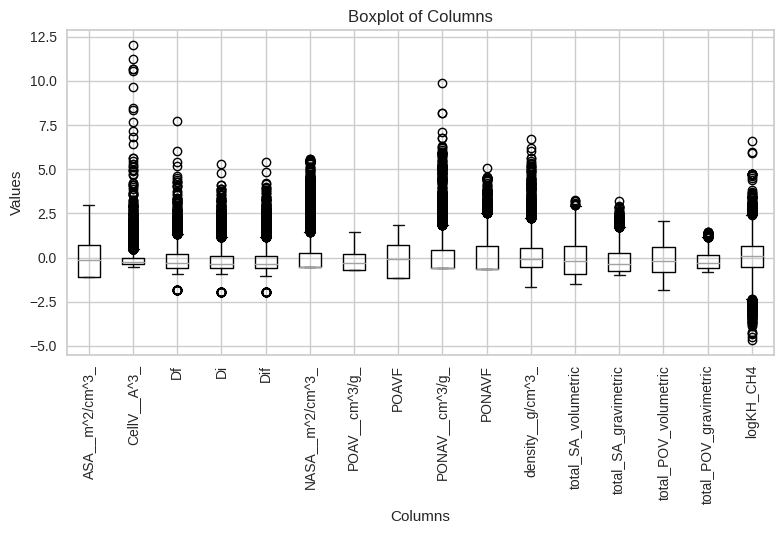

####################################################################################################




In [49]:
df_logKH_CH4_scaled_outlier = remove_outliers_iqr(df_logKH_CH4_scaled, column='total_POV_gravimetric')
print(df_logKH_CH4_scaled_outlier['logKH_CH4'].describe())
boxplot_of_processed_data(df_logKH_CH4_scaled_outlier)

In [50]:
logKH_CH4_outlier=Sscaler.inverse_transform(df_logKH_CH4_scaled_outlier)

In [51]:
df_logKH_CH4_outlier=pd.DataFrame(logKH_CH4_outlier, columns=clean_feature_names_logKH_CH4)

In [52]:
df_logKH_CH4_outlier.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4
count,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000
mean,809.009423,5163.944584,4.612201,6.487424,6.414181,149.856021,0.246895,0.259710,0.055308,0.075312,1.351243,958.865443,890.222634,0.335022,0.302203,-4.918582
std,765.482180,7114.741549,1.886736,2.440554,2.420307,268.124996,0.261026,0.233439,0.094073,0.114485,0.442317,657.040667,795.427796,0.175739,0.228653,0.551303
min,0.000000,250.921000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.520686,1.070200,0.538008,0.000000,0.000000,-7.463039
25%,0.000000,1807.095000,3.339080,4.831695,4.766000,0.000000,0.000000,0.000000,0.000000,0.000000,1.047350,391.159000,251.374983,0.196130,0.124449,-5.233250
50%,755.895000,3114.430000,4.102910,5.759790,5.695770,0.000000,0.190948,0.270540,0.000000,0.000000,1.267490,880.610000,651.611213,0.320400,0.241124,-4.880378
75%,1442.640000,5743.790000,5.389305,7.331365,7.259090,210.308000,0.418070,0.465730,0.089267,0.141450,1.567570,1458.200000,1341.564587,0.471560,0.434995,-4.586307
max,3272.090000,144768.000000,25.438950,25.689350,25.689350,1605.750000,1.019920,0.763140,0.965610,0.638700,4.470600,3272.090000,4602.569770,0.763140,1.019920,-1.367461


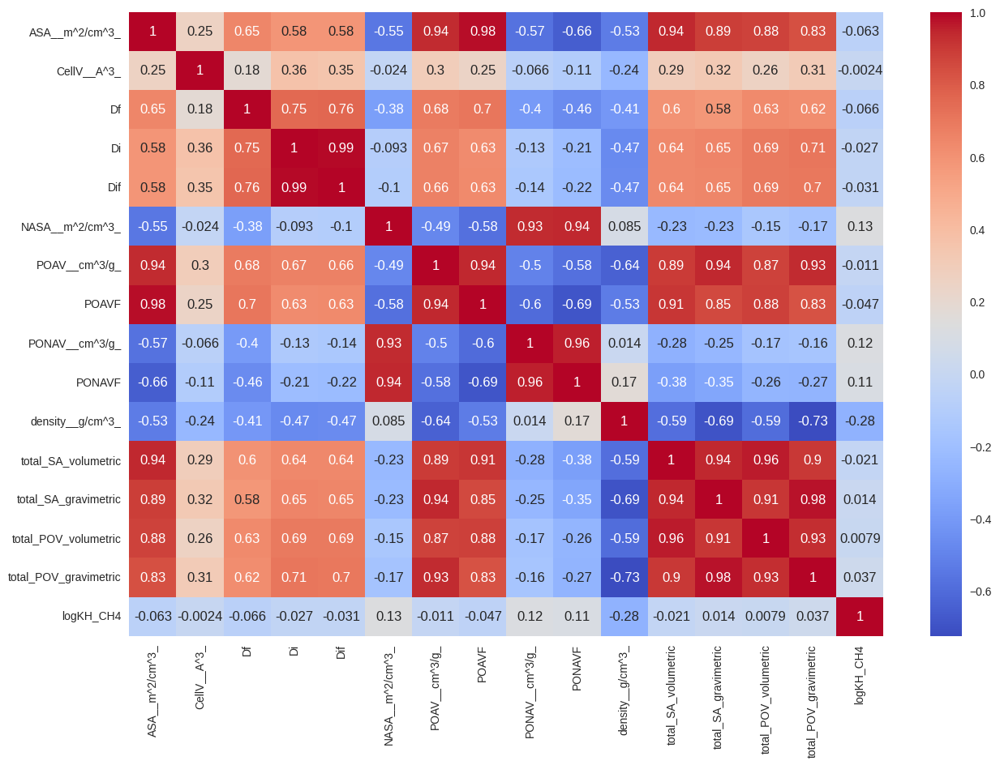

In [53]:
plt.figure(figsize=(15, 10))
sns.heatmap(df_logKH_CH4_outlier.corr(), annot=True, cmap='coolwarm')
plt.show()  

### pycaret test

In [37]:
regression_setup = setup(df_logKH_CH4_outlier, target='logKH_CH4')


best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])

final_model = finalize_model(best_model)

,Description,Value
0,Session id,8839
1,Target,logKH_CH4
2,Target type,Regression
3,Original data shape,"(8975, 16)"
4,Transformed data shape,"(8975, 16)"
5,Transformed train set shape,"(6282, 16)"
6,Transformed test set shape,"(2693, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.2456,0.1375,0.3697,0.5480,0.0642,0.0516,0.2153
rf,Random Forest Regressor,0.2577,0.1463,0.3811,0.5200,0.0666,0.0544,0.7560
xgboost,Extreme Gradient Boosting,0.2732,0.1592,0.3977,0.4766,0.0693,0.0574,0.0587
gbr,Gradient Boosting Regressor,0.3038,0.1784,0.4214,0.4145,0.0741,0.0644,0.3507
knn,K Neighbors Regressor,0.3362,0.2229,0.4711,0.2682,0.0816,0.0702,0.0073
lr,Linear Regression,0.3581,0.2426,0.4921,0.2028,0.0858,0.0756,0.1853
br,Bayesian Ridge,0.3579,0.2426,0.4921,0.2028,0.0858,0.0756,0.0053
ridge,Ridge Regression,0.3583,0.2454,0.4950,0.1938,0.0864,0.0758,0.0053
ada,AdaBoost Regressor,0.3770,0.2465,0.4960,0.1901,0.0857,0.0785,0.0640
dt,Decision Tree Regressor,0.3374,0.2763,0.5245,0.0883,0.0915,0.0704,0.0173



Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.12215674660553
Mean Absolute Error (MAE): 0.23179623886258513
R^2 Score: 0.6097637653562036
Cross-Validation Mean MSE: 0.13388192397288254
Cross-Validation Std MSE: 0.015437303023028792


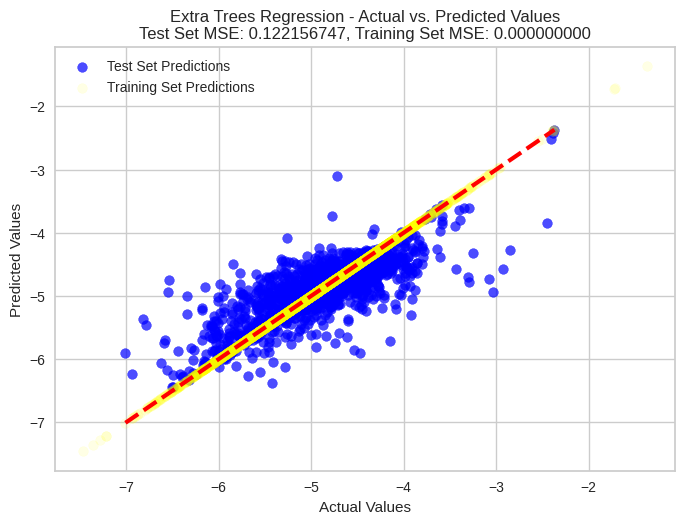

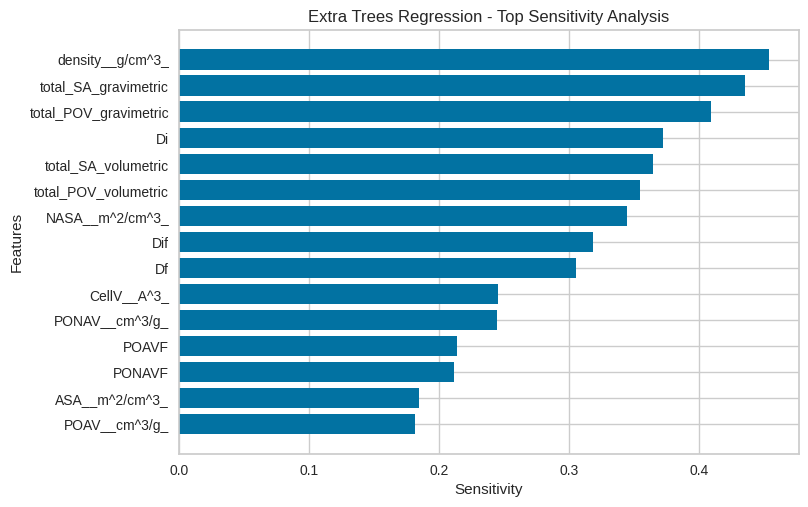

[0.18, 0.523163740525883, 2, 0.609119044454856]


In [39]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4_outlier.drop('logKH_CH4', axis=1)
y=df_logKH_CH4_outlier['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(n_jobs=-1),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

print(opted_Rscore)

del opted_Rscore

## Choosing IQR method for LogKH_CH4 (over 2 columns) 

In [54]:
df_logKH_CH4_scaled.columns

Index(['ASA__m^2/cm^3_', 'CellV__A^3_', 'Df', 'Di', 'Dif', 'NASA__m^2/cm^3_',
       'POAV__cm^3/g_', 'POAVF', 'PONAV__cm^3/g_', 'PONAVF',
       'density__g/cm^3_', 'total_SA_volumetric', 'total_SA_gravimetric',
       'total_POV_volumetric', 'total_POV_gravimetric', 'logKH_CH4'],
      dtype='object')

count    8713.000000
mean        0.056704
std         0.979679
min        -4.689670
25%        -0.501654
50%         0.114435
75%         0.649518
max         5.956338
Name: logKH_CH4, dtype: float64


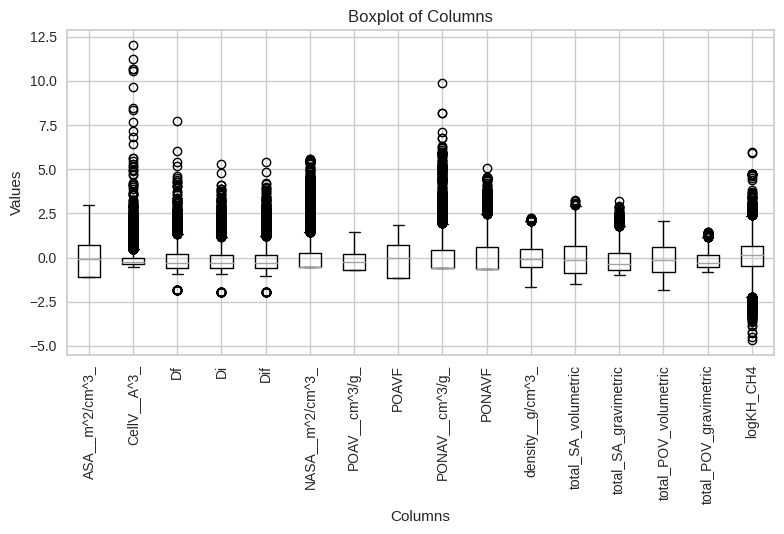

####################################################################################################




In [55]:
df_logKH_CH4_scaled_outlier = remove_outliers_iqr(df_logKH_CH4_scaled_outlier, column='density__g/cm^3_')
print(df_logKH_CH4_scaled_outlier['logKH_CH4'].describe())
boxplot_of_processed_data(df_logKH_CH4_scaled_outlier)

In [56]:
logKH_CH4_outlier=Sscaler.inverse_transform(df_logKH_CH4_scaled_outlier)

In [57]:
df_logKH_CH4_outlier=pd.DataFrame(logKH_CH4_outlier, columns=clean_feature_names_logKH_CH4)

In [58]:
df_logKH_CH4_outlier.describe()

,ASA__m^2/cm^3_,CellV__A^3_,Df,Di,Dif,NASA__m^2/cm^3_,POAV__cm^3/g_,POAVF,PONAV__cm^3/g_,PONAVF,density__g/cm^3_,total_SA_volumetric,total_SA_gravimetric,total_POV_volumetric,total_POV_gravimetric,logKH_CH4
count,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000,8713.000000
mean,823.244571,5197.580473,4.641333,6.528209,6.455346,149.586117,0.253113,0.264197,0.055965,0.074861,1.308499,972.830688,911.600728,0.339058,0.309078,-4.899872
std,766.761190,7186.528484,1.899428,2.456744,2.435866,269.528347,0.262200,0.233723,0.095211,0.115063,0.365090,656.417782,796.953417,0.175363,0.228400,0.529052
min,0.000000,250.921000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.520686,1.070200,0.581115,0.000000,0.000000,-7.463039
25%,0.000000,1811.920000,3.359850,4.850400,4.790770,0.000000,0.000000,0.000000,0.000000,0.000000,1.041160,407.791000,267.502816,0.201580,0.130638,-5.201400
50%,788.400000,3113.350000,4.135170,5.802740,5.743350,0.000000,0.203471,0.278380,0.000000,0.000000,1.254190,903.110000,682.327322,0.327480,0.248112,-4.868696
75%,1454.160000,5790.480000,5.420200,7.386050,7.315060,206.580000,0.426722,0.468700,0.091797,0.140000,1.535160,1467.480000,1367.479024,0.475240,0.442949,-4.579737
max,3272.090000,144768.000000,25.438950,25.689350,25.689350,1605.750000,1.019920,0.763140,0.965610,0.638700,2.347820,3272.090000,4602.569770,0.763140,1.019920,-1.713914


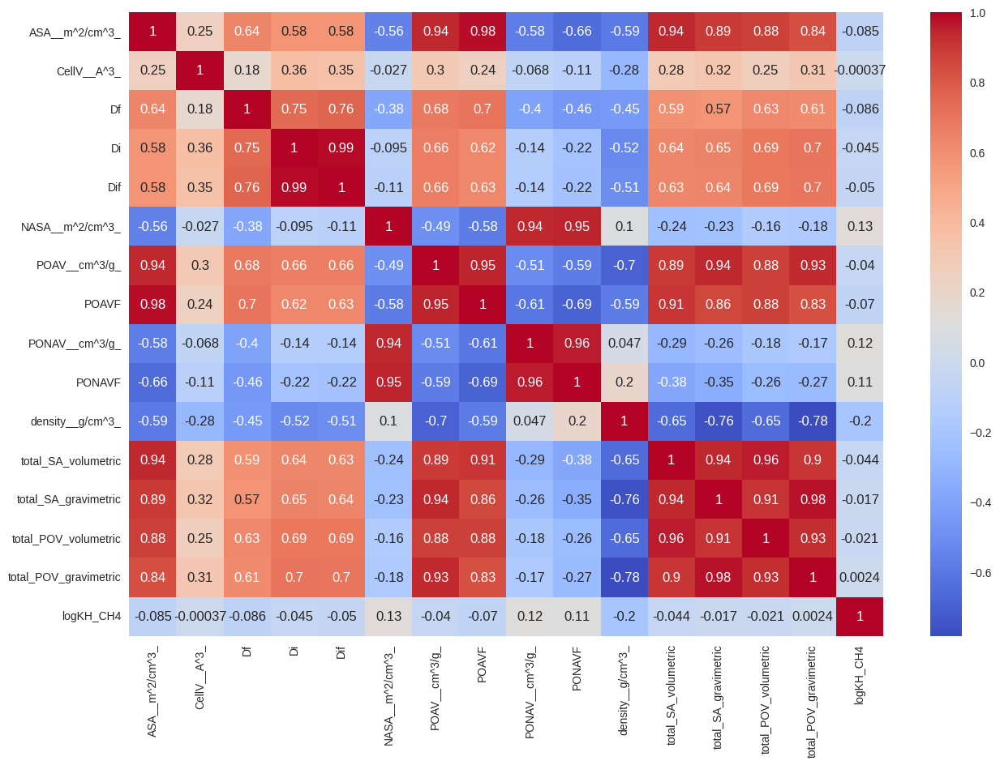

In [59]:
plt.figure(figsize=(15, 10))
sns.heatmap(df_logKH_CH4_outlier.corr(), annot=True, cmap='coolwarm')
plt.show()  

### pycaret test

In [60]:
regression_setup = setup(df_logKH_CH4_outlier, target='logKH_CH4')


best_model = compare_models(fold=15, sort='RMSE',exclude=['lightgbm'])

final_model = finalize_model(best_model)

,Description,Value
0,Session id,3726
1,Target,logKH_CH4
2,Target type,Regression
3,Original data shape,"(8713, 16)"
4,Transformed data shape,"(8713, 16)"
5,Transformed train set shape,"(6099, 16)"
6,Transformed test set shape,"(2614, 16)"
7,Numeric features,15
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,0.2375,0.1261,0.3548,0.5510,0.0615,0.0497,0.2107
rf,Random Forest Regressor,0.2464,0.1322,0.3631,0.5308,0.0632,0.0518,0.7187
xgboost,Extreme Gradient Boosting,0.2598,0.1416,0.3759,0.4961,0.0653,0.0544,0.0580
gbr,Gradient Boosting Regressor,0.2935,0.1635,0.4040,0.4208,0.0707,0.0620,0.3420
knn,K Neighbors Regressor,0.3244,0.2043,0.4511,0.2762,0.0782,0.0678,0.0067
ada,AdaBoost Regressor,0.3608,0.2246,0.4735,0.2047,0.0817,0.0751,0.0773
lr,Linear Regression,0.3504,0.2332,0.4824,0.1746,0.0836,0.0738,0.0047
br,Bayesian Ridge,0.3503,0.2332,0.4824,0.1746,0.0836,0.0738,0.0047
ridge,Ridge Regression,0.3521,0.2361,0.4854,0.1645,0.0841,0.0742,0.0053
dt,Decision Tree Regressor,0.3314,0.2560,0.5052,0.0932,0.0878,0.0688,0.0167



Extra Trees Regression Evaluation Scores:
Mean Squared Error (MSE): 0.1111207686189765
Mean Absolute Error (MAE): 0.22210077137389375
R^2 Score: 0.6103569765338456
Cross-Validation Mean MSE: 0.12643568626416307
Cross-Validation Std MSE: 0.006579998404215864


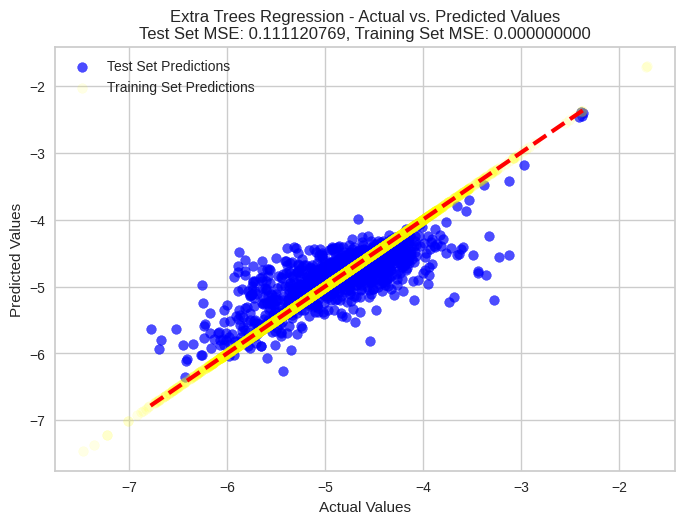

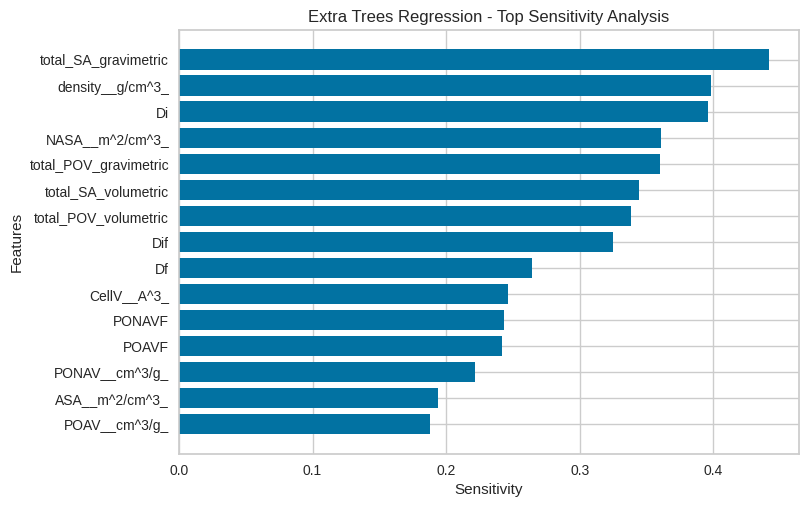

[0.15, 0.4851769578270904, 48, 0.614106116893441]


In [64]:
clean_feature_names = df_logKH_CH4.columns.str.replace(r'[\[\]\s]', '_', regex=True)
df_logKH_CH4.columns = clean_feature_names

X=df_logKH_CH4_outlier.drop('logKH_CH4', axis=1)
y=df_logKH_CH4_outlier['logKH_CH4']

feature_names = X.columns

scaler=StandardScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=feature_names)

opted_Rscore= ExtraTreesRegressionScore(X,y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=opted_Rscore[0], random_state=opted_Rscore[2])

models = {
    "Extra Trees Regression": ExtraTreesRegressor(n_jobs=-1),    
}
results = {}

for model_name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)  

    mse = mean_squared_error(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    r2 = model.score(X_test, y_test)
    
    
    kf = KFold(n_splits=5, shuffle=True, random_state=opted_Rscore[2])
    cv_scores = cross_val_score(model, X, y, cv=kf, scoring='neg_mean_squared_error',n_jobs=-1)
    cv_mse_scores = -cv_scores
    cv_mean_mse = cv_mse_scores.mean()
    cv_std_mse = cv_mse_scores.std()
    

    sensitivity_analysis = []
    perturbation_amount = 0.1

    for i in range(X_train.shape[1]):
        X_perturbed = X_test.copy()
        X_perturbed.iloc[:, i] += perturbation_amount

        y_perturbed = model.predict(X_perturbed)
        sensitivity = np.abs((y_perturbed - y_pred) / perturbation_amount)
        sensitivity_analysis.append(sensitivity.mean())

    

    results[model_name] = {
        "mse": mse,
        "mae": mae,
        "r2": r2,
        "cv_mean_mse": cv_mean_mse,
        "cv_std_mse": cv_std_mse,
        "sensitivity_analysis": sensitivity_analysis
    }
    

    print(f"\n{model_name} Evaluation Scores:")
    print("Mean Squared Error (MSE):", mse)
    print("Mean Absolute Error (MAE):", mae)
    print("R^2 Score:", r2)
    print("Cross-Validation Mean MSE:", cv_mean_mse)
    print("Cross-Validation Std MSE:", cv_std_mse)
    

    plt.figure()
    plt.scatter(y_test, y_pred, alpha=0.7, label='Test Set Predictions', color='blue')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=3, color='red')


    plt.scatter(y_train, y_pred_train, alpha=0.1, label='Training Set Predictions', color='yellow')
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.title(f"{model_name} - Actual vs. Predicted Values\nTest Set MSE: {mse:.9f}, Training Set MSE: {mse_train:.9f}")
    plt.legend()
    plt.show()

    model_name_safe = "".join(c for c in model_name if c.isalnum() or c.isspace()).replace(" ", "_")

    
    plt.show()
    
    
    sensitivity_analysis = np.array(sensitivity_analysis)


    plt.figure()
    top_features_sensitivity = np.argsort(sensitivity_analysis)[-20:]
    top_feature_names = [feature_names[i] for i in top_features_sensitivity]
    plt.barh(range(len(top_features_sensitivity)), [sensitivity_analysis[i] for i in top_features_sensitivity])
    plt.yticks(range(len(top_features_sensitivity)), top_feature_names)
    plt.xlabel("Sensitivity")
    plt.ylabel("Features")
    plt.title(f"{model_name} - Top Sensitivity Analysis")
    
    
    plt.show()

print(opted_Rscore)

del opted_Rscore